In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from gensim.models.word2vec import Word2Vec

In this section, you can decide which model for which corpus you want to use for your analysis. Here by default, it's the critical corpus within the years 1820-1940. We tested over 10-year slides, it's clearly much less effective due to the small size of the French corpora.
After the load, put the path to your directory of models, and then select your range in "year in range".

In [3]:
from collections import OrderedDict

models = OrderedDict([
    (year, Word2Vec.load('/home/odysseus/Téléchargements/models/criticism/{}.bin'.format(year)))
    for year in range(1840, 1940, 20)
])

In [4]:
def cosine_series(anchor, query):
    
    series = OrderedDict()
    
    for year, model in models.items():
        
        series[year] = (
            model.similarity(anchor, query)
            if query in model else 0
        )

    return series

In [5]:
import numpy as np
import statsmodels.api as sm

def lin_reg(series):

    x = np.array(list(series.keys()))
    y = np.array(list(series.values()))

    x = sm.add_constant(x)

    return sm.OLS(y, x).fit()

In [6]:
def plot_cosine_series(anchor, query, w=8, h=4):
    
    series = cosine_series(anchor, query)
    
    fit = lin_reg(series)

    x1 = list(series.keys())[0]
    x2 = list(series.keys())[-1]

    y1 = fit.predict()[0]
    y2 = fit.predict()[-1]
    
    print(query)
    
    plt.figure(figsize=(w, h))
    plt.ylim(0, 1)
    plt.title(query)
    plt.xlabel('Year')
    plt.ylabel('Similarity')
    plt.plot(list(series.keys()), list(series.values()))
    plt.plot([x1, x2], [y1, y2], color='gray', linewidth=0.5)
    plt.show()

# Similarity of a list of key terms to "littérature"

The cell below (which calls the methods above), shows how two words differ from one another <b>through time</b>, with <b>cosine</b> similarity. Here, we show how a list of selected concepts evolves compared to "littérature". You can manually change both below.

poésie


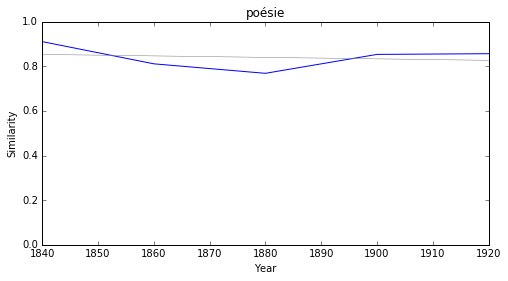

science


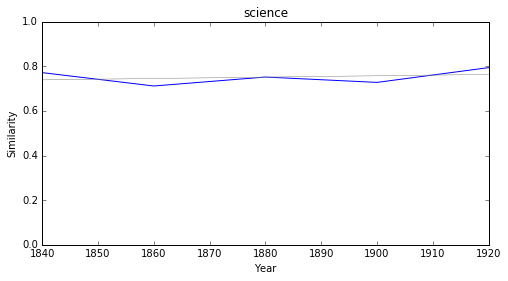

savoir


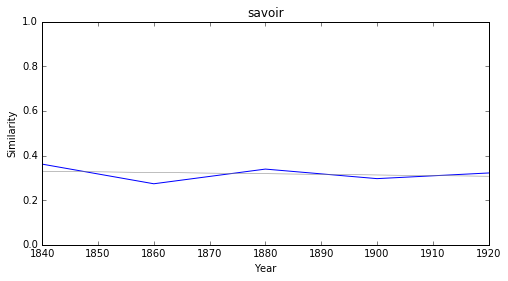

histoire


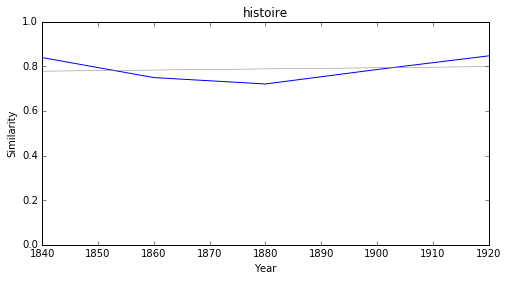

philosophie


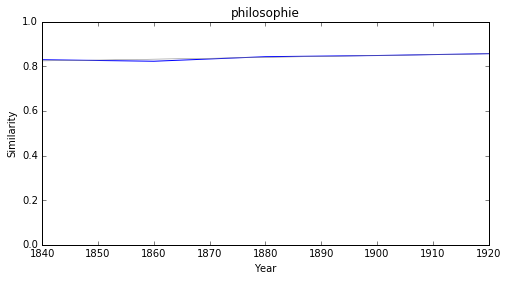

lettre


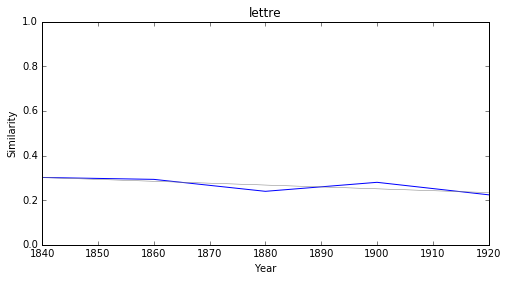

critique


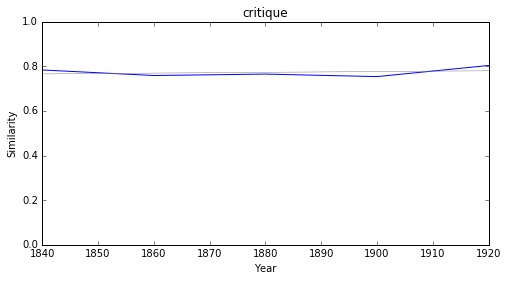

roman


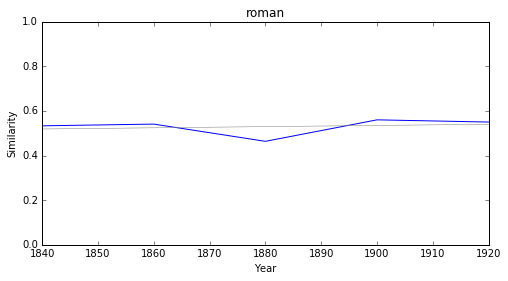

théâtre


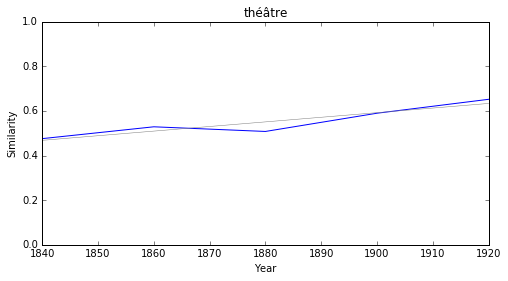

drame


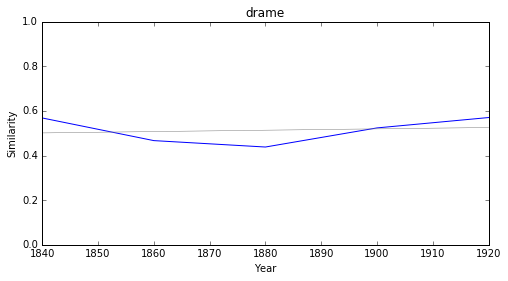

esprit


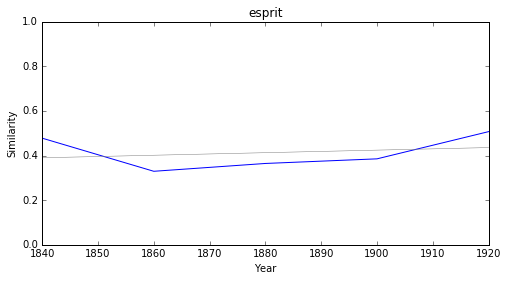

langue


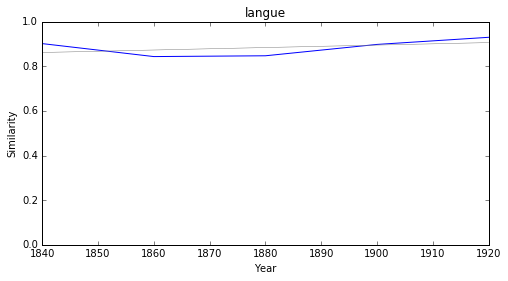

diplomatie


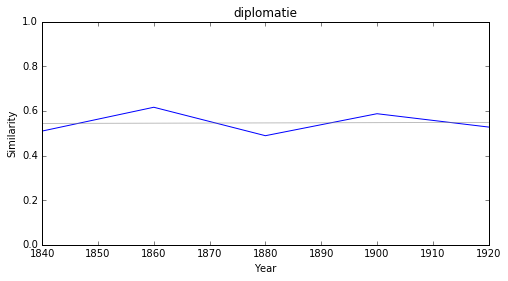

politique


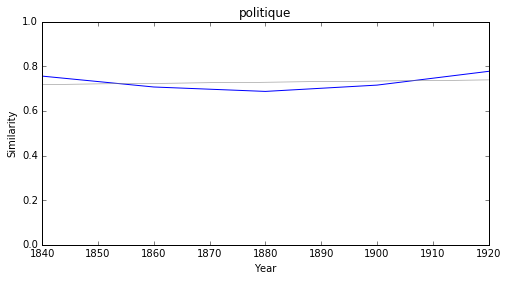

morale


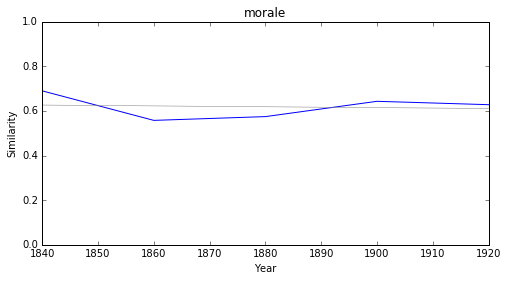

société


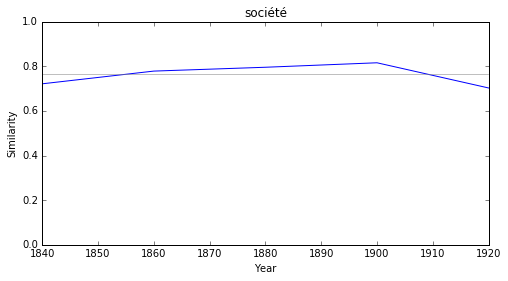

pouvoir


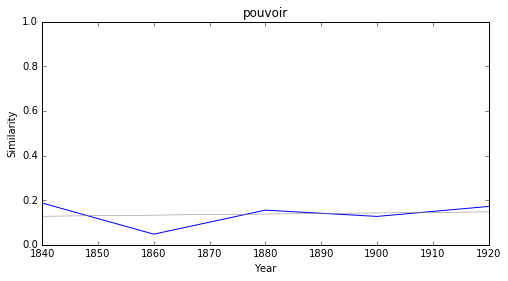

théologie


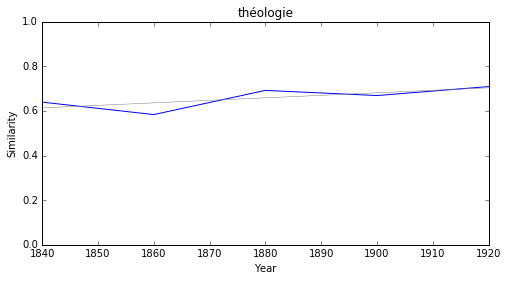

droit


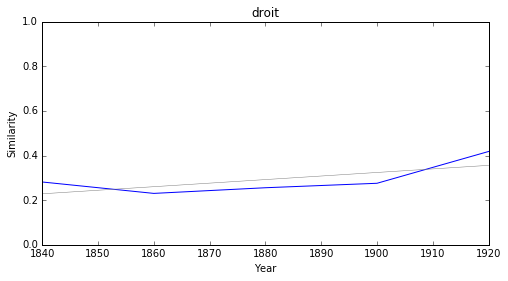

loi


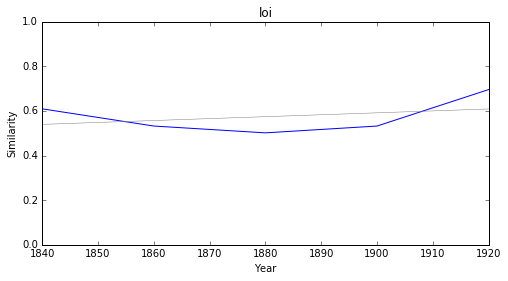

méthode


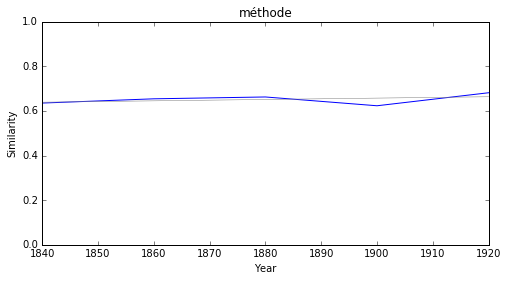

génie


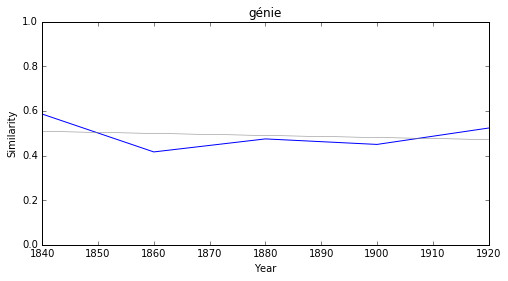

romantisme


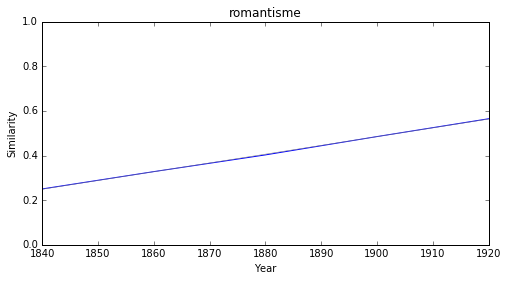

réalisme


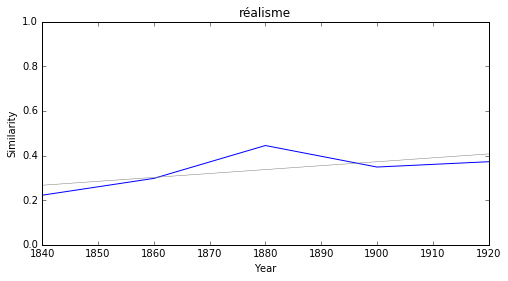

symbolisme


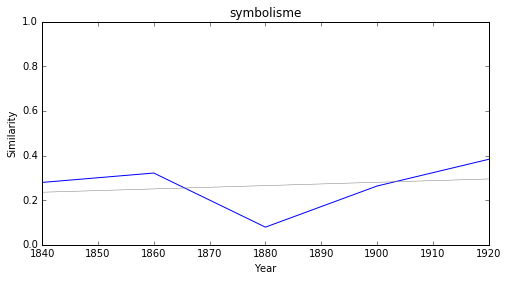

naturalisme


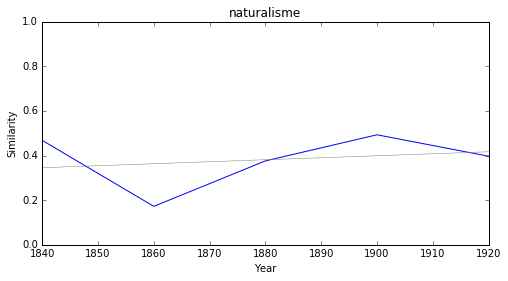

In [7]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')

for idx, val in enumerate(testList):
    if idx>0:
        plot_cosine_series('littérature', val)

The two next cells get the 200 most similar terms to a specific term, from the training models, here "littérature".

In [8]:
def union_neighbor_vocab(anchor, topn=200):
    
    vocab = set()
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocab.update([s[0] for s in similar])
        
    return vocab

At this point, we'll do the same thing as above, and calculate, for each token in the 200 nearest terms to the main entry, the <b>proximity</b> of this term and its <b>significance</b>. The significance is calculated with the p value, that is to say that, below a certain threshold (0.05) we have a strong likelyhood that the result is sure and significant.

In [9]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')
entries={}

for word in testList:
    data = []
    for token in union_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

# Increasing

In this part, we want to show what terms <b>emerge</b> more and more with the main entry, that is to say each word of the given test list. The <b>"slope"</b> is the degree of progress, and the <b>"p" value</b> its efficiency. So here, the main emergence with "littérature" which is significant is "humanisme". All terms seem to be significant, except "fédéralisme", "welschinger", "maniere", "hennet", "réapparition", "deffence", "bourgin", "colonie", "naturalisme", "réalisme", "sillery", "gréco", "compétence", "symbolisme", "catholique", "japonais", "manuel", "romand", "topographie, "organisme", "prédominance". That is to say that those terms can be nearest, but that statistically they are not significant enough to be sure, while the others are more certain.

In this following cell, we show how the top ten most similar vectors change through time compared to the words in the test list : "humanisme" for example seems to be very rare before 1860, and then becomes more and more similar to "littérature". Those show the terms that were not similar in the beginning, but <b>tend to be more and more related</b> to "littérature". You should keep in mind the p values associated to each vector.

### <i><b>littérature</i></b>

             token     slope         p
20      relativité  0.008630  0.027054
33        revision  0.008067  0.006138
4        hégémonie  0.007857  0.022322
28  méconnaissance  0.007500  0.004024
42   documentation  0.007471  0.042685
38    réapparition  0.007044  0.022231
3           parité  0.006723  0.048006
43        biologie  0.006508  0.023557
41       évolution  0.004081  0.010543
27       technique  0.003718  0.004797



relativité


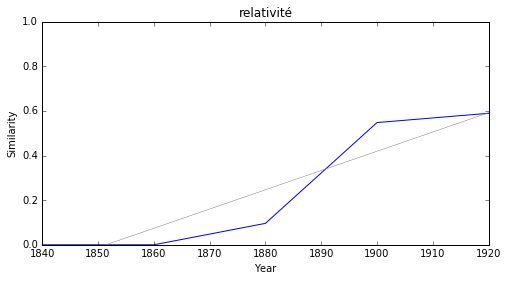

revision


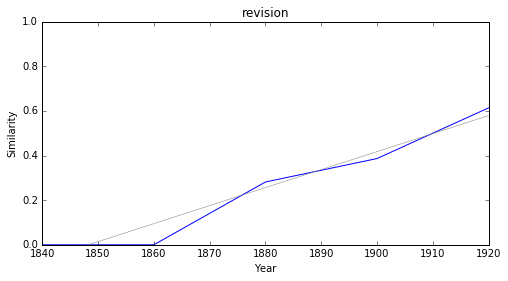

hégémonie


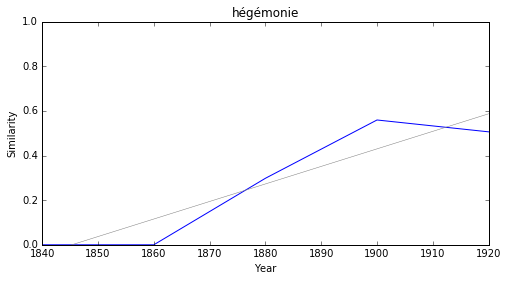

méconnaissance


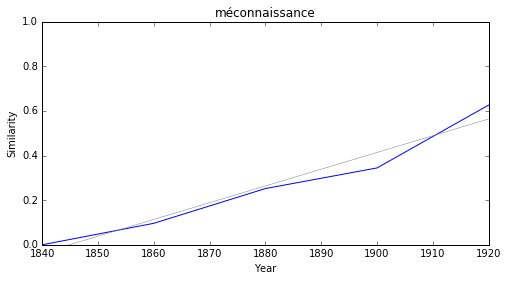

documentation


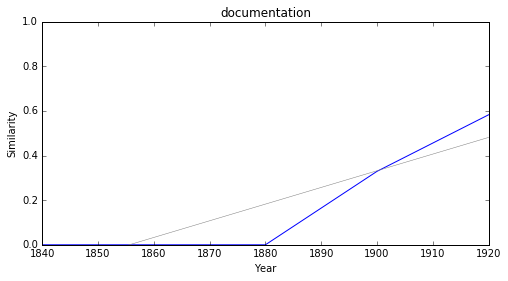

réapparition


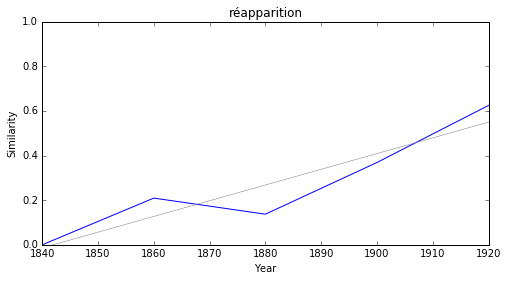

parité


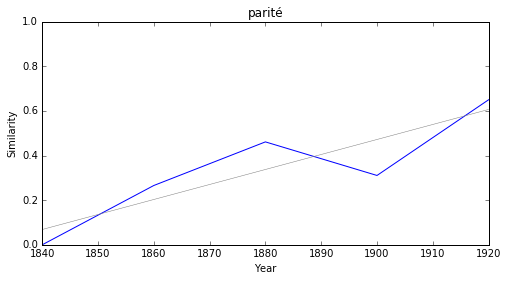

biologie


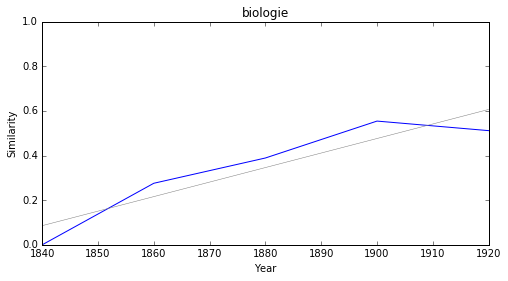

évolution


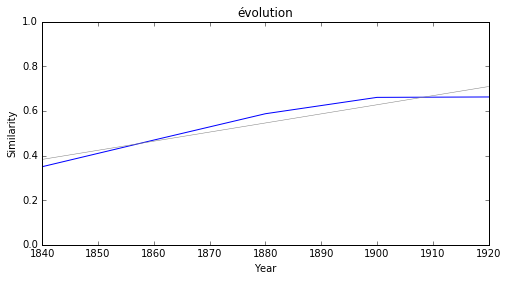

technique


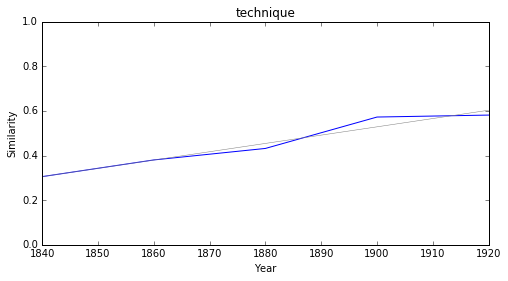

### <i><b>poésie</i></b>

             token     slope         p
20      relativité  0.009988  0.009130
12   compréhension  0.008559  0.026074
28  méconnaissance  0.008145  0.002772
2           parité  0.007528  0.009211
30      redondance  0.007391  0.026926
27       technique  0.005078  0.016174
36        vitalité  0.004656  0.028515
24          féerie  0.004303  0.005984
41       évolution  0.003866  0.013399
25      romantique  0.003849  0.015698



relativité


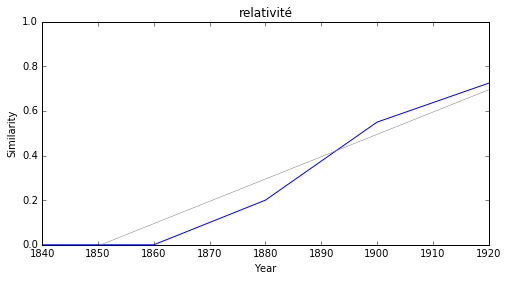

compréhension


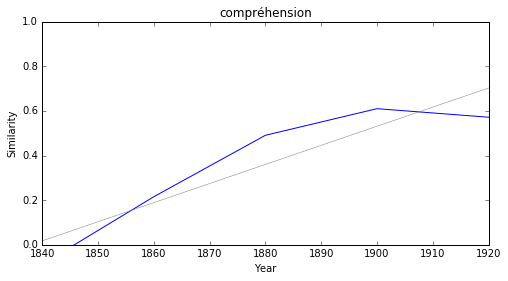

méconnaissance


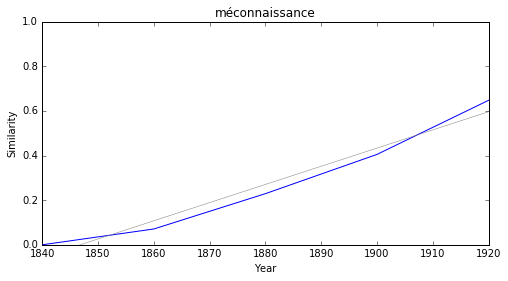

parité


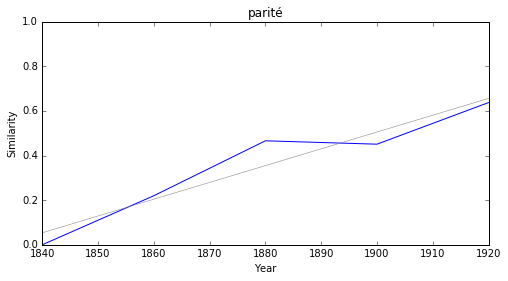

redondance


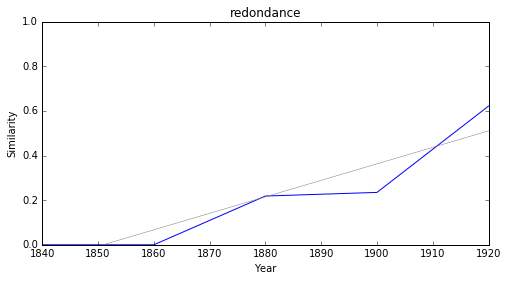

technique


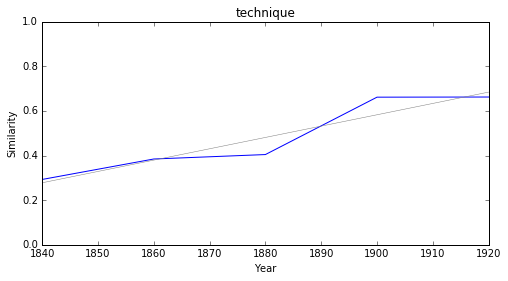

vitalité


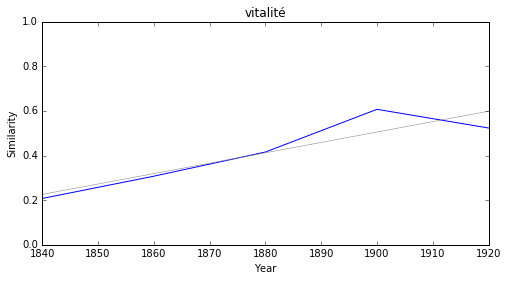

féerie


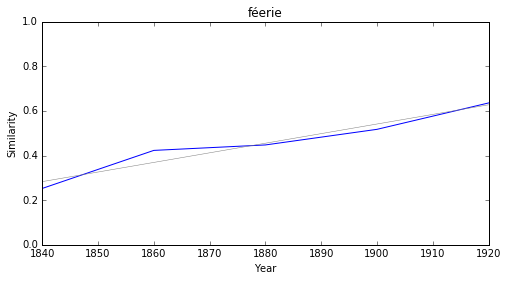

évolution


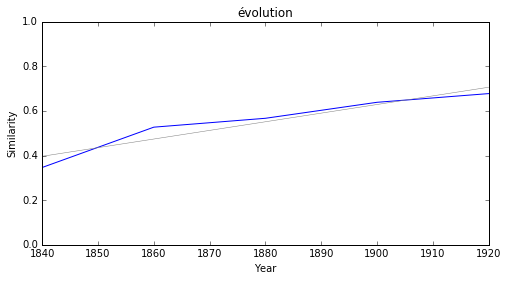

romantique


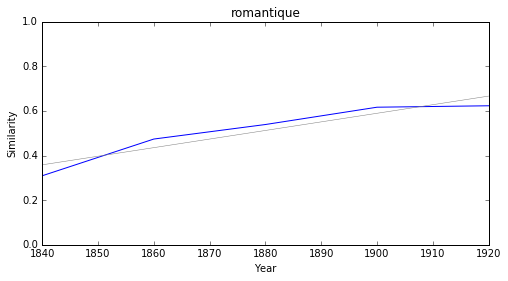

### <i><b>science</i></b>

             token     slope         p
12      relativité  0.011249  0.011606
16  méconnaissance  0.010199  0.006277
7       aberration  0.009544  0.038287
6    compréhension  0.009489  0.020553
2    vulgarisation  0.007762  0.022583
20    dissemblance  0.007716  0.031022
1           parité  0.007515  0.034081
10          rareté  0.005890  0.045532
15       technique  0.005045  0.005871
23        vitalité  0.004703  0.008853



relativité


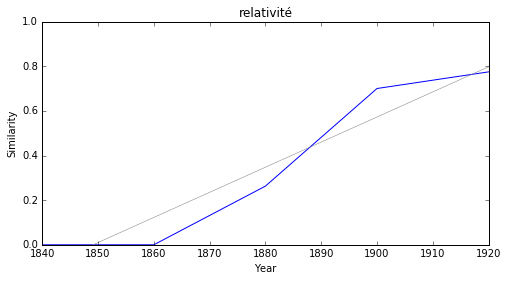

méconnaissance


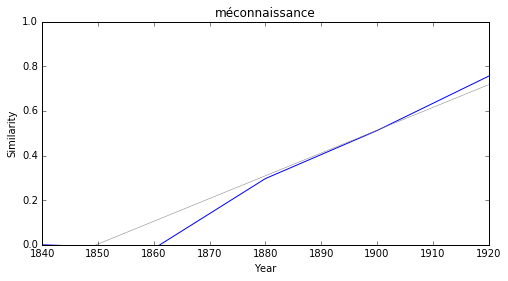

aberration


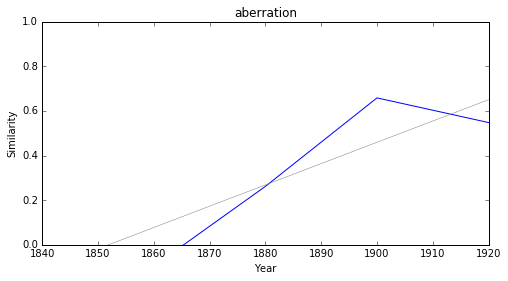

compréhension


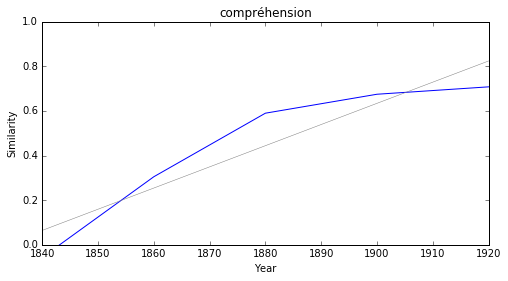

vulgarisation


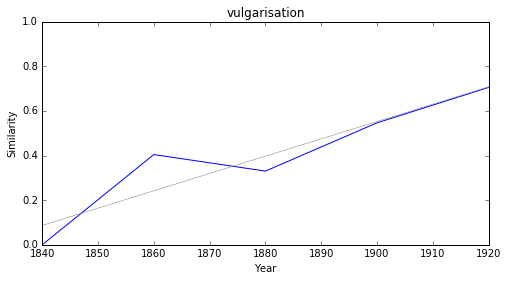

dissemblance


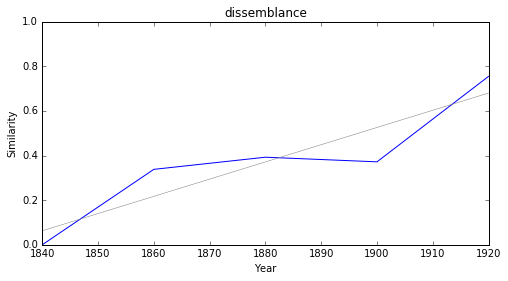

parité


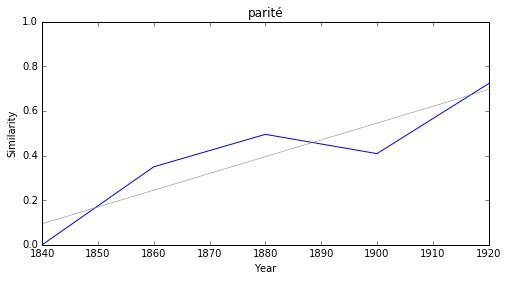

rareté


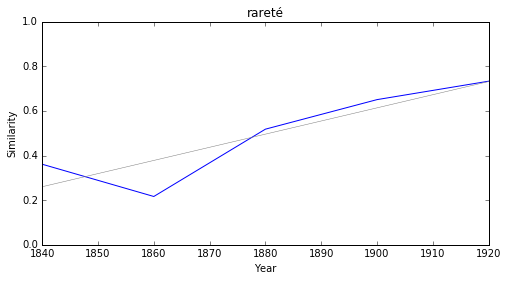

technique


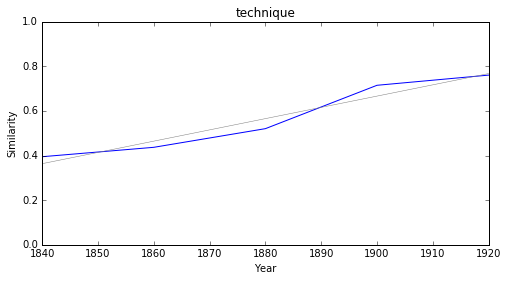

vitalité


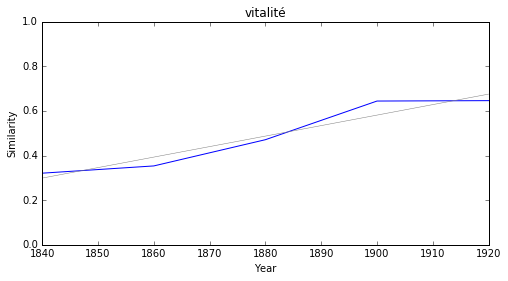

### <i><b>savoir</i></b>

           token     slope         p
11     souhaiter  0.003581  0.002623
9       conteste  0.002588  0.038764
10       soucier  0.002407  0.042188
0       réaliser  0.002163  0.029873
8          utile  0.001950  0.043704
14     connaître  0.001879  0.010351
7   parfaitement  0.001714  0.023866
6       rappeler  0.001346  0.007488
2       signaler  0.001136  0.046401
13     remarquer  0.000993  0.022142



souhaiter


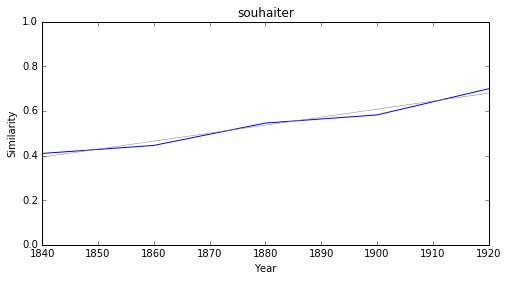

conteste


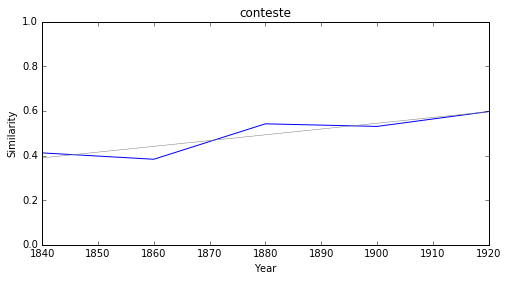

soucier


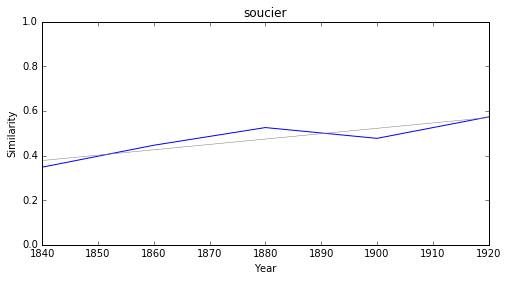

réaliser


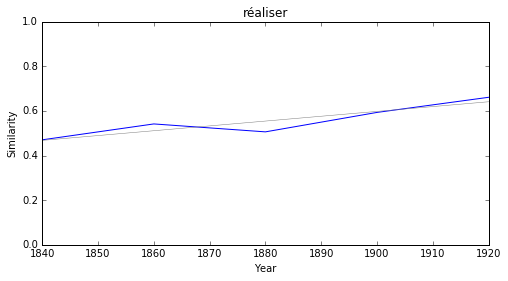

utile


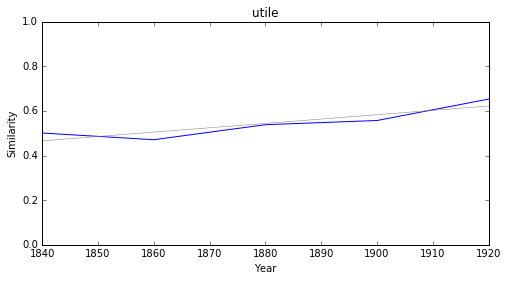

connaître


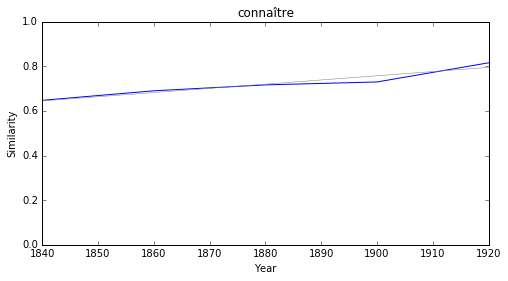

parfaitement


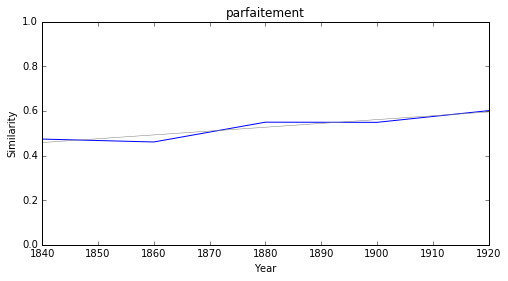

rappeler


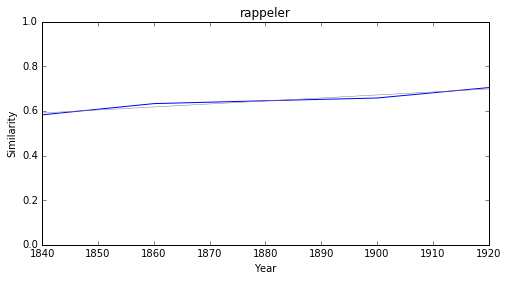

signaler


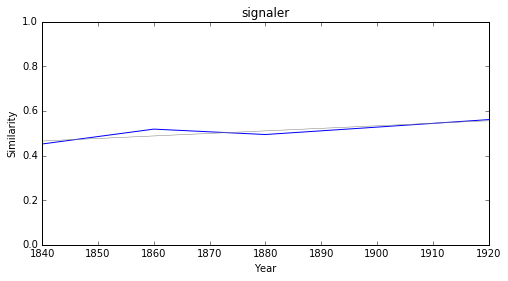

remarquer


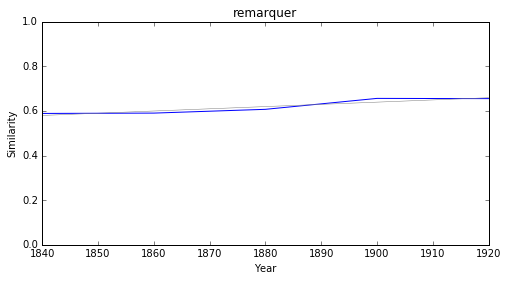

### <i><b>histoire</i></b>

             token     slope         p
5        humanisme  0.009878  0.020428
48       réédition  0.008193  0.004980
3        hégémonie  0.008143  0.020007
27    affabulation  0.008053  0.012808
37        revision  0.007793  0.006509
34  méconnaissance  0.007008  0.042760
42      figuration  0.006890  0.042321
15          apport  0.006802  0.023732
16  identification  0.006399  0.019691
31          intimé  0.006009  0.048074



humanisme


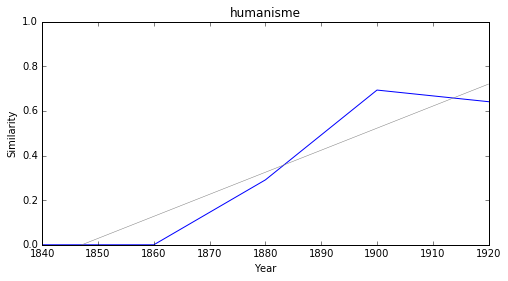

réédition


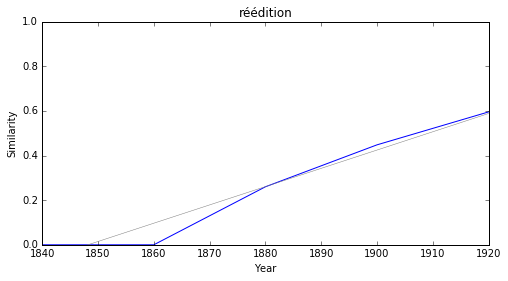

hégémonie


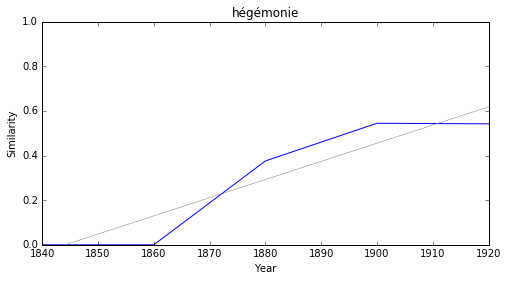

affabulation


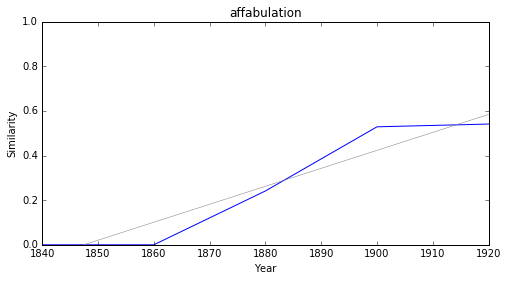

revision


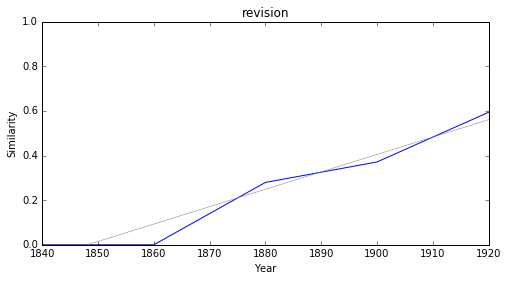

méconnaissance


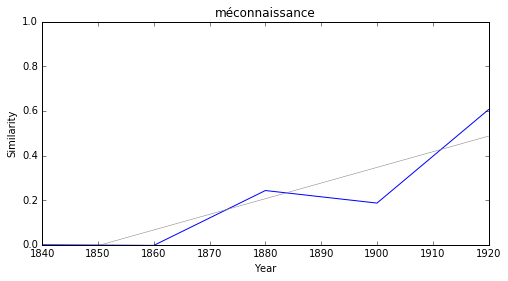

figuration


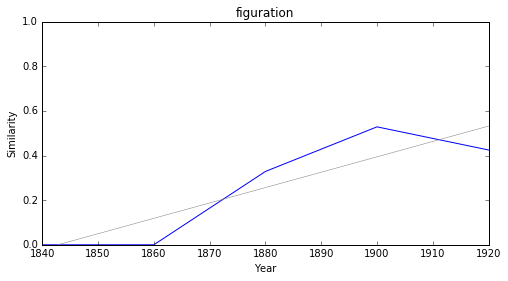

apport


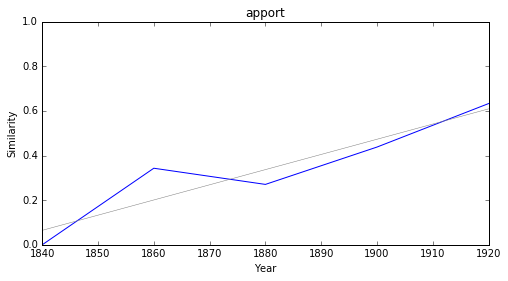

identification


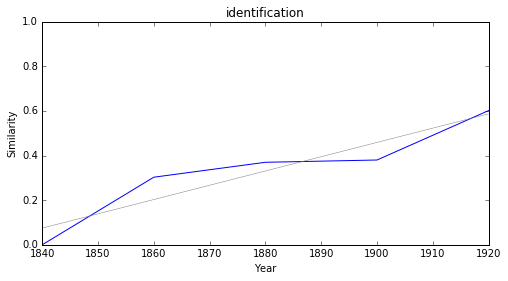

intimé


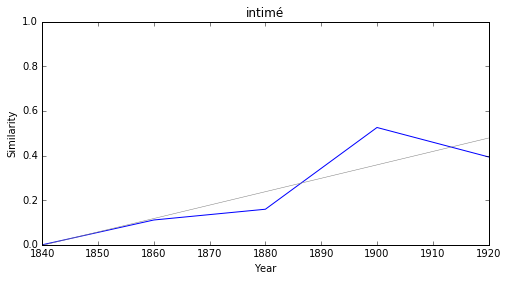

### <i><b>philosophie</i></b>

             token     slope         p
16      relativité  0.010425  0.012617
14         hantise  0.009470  0.005540
20  méconnaissance  0.009186  0.004146
6     répercussion  0.008794  0.027656
23    réapparition  0.008261  0.002637
28        biologie  0.007822  0.022679
19      préciosité  0.007762  0.023065
0           parité  0.007440  0.043325
25    constatation  0.006741  0.031383
18       technique  0.004557  0.002005



relativité


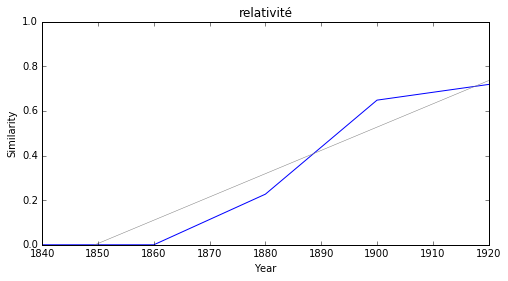

hantise


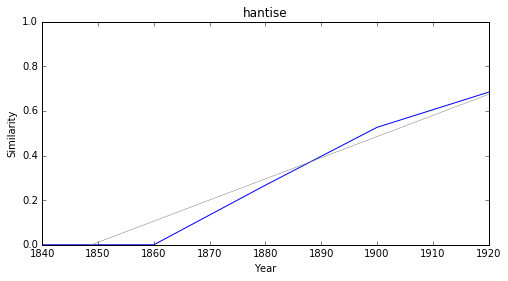

méconnaissance


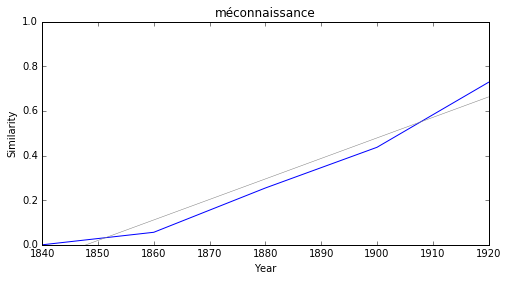

répercussion


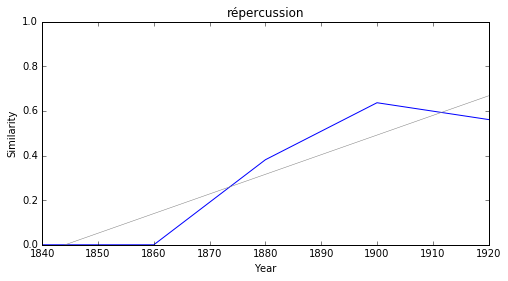

réapparition


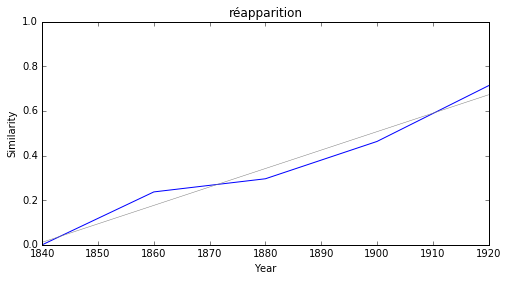

biologie


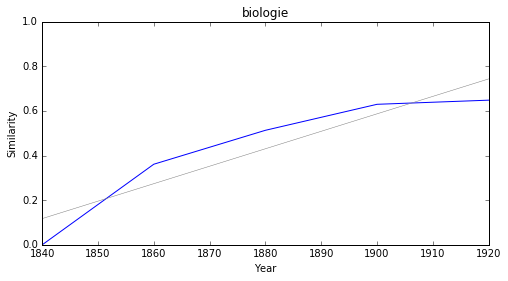

préciosité


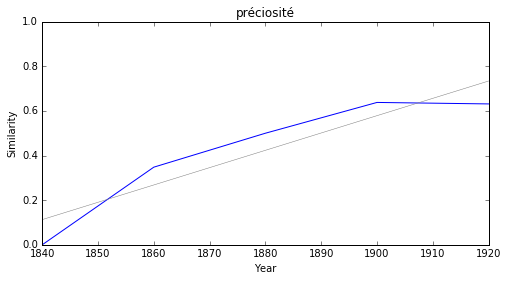

parité


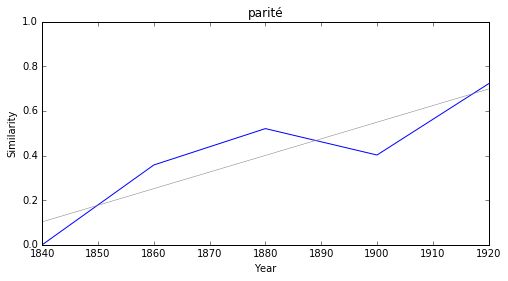

constatation


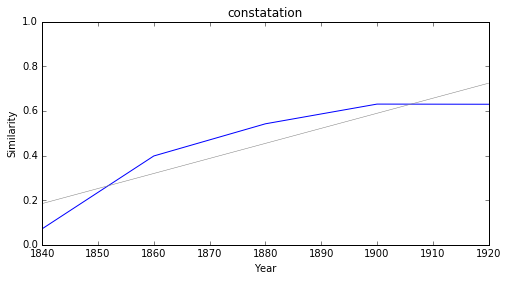

technique


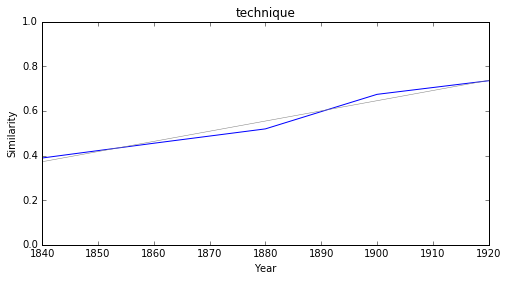

### <i><b>lettre</i></b>

            token     slope         p
8   bibliographie  0.009256  0.046050
20         phobie  0.009077  0.049468
37      apoplexie  0.008105  0.045244
22       croisset  0.007949  0.013666
9         colibri  0.007830  0.011770
23         bovary  0.007520  0.022837
34         chaine  0.007386  0.034142
35          beyle  0.007334  0.032051
31        edition  0.006443  0.039515
29          moore  0.006435  0.020843



bibliographie


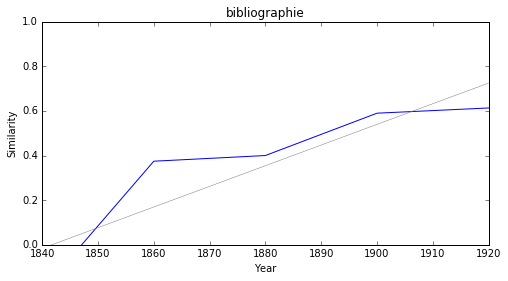

phobie


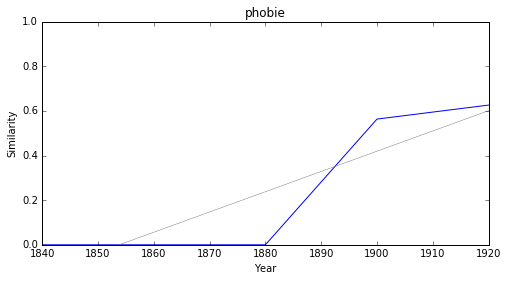

apoplexie


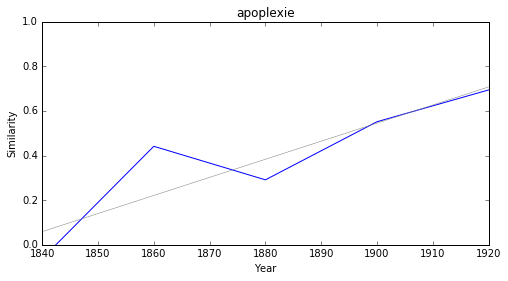

croisset


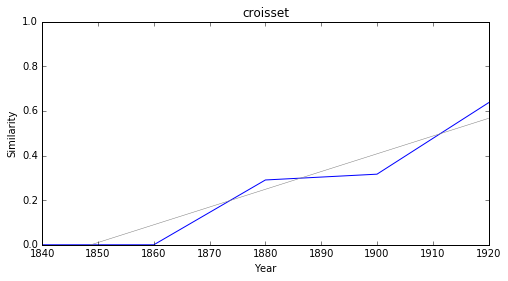

colibri


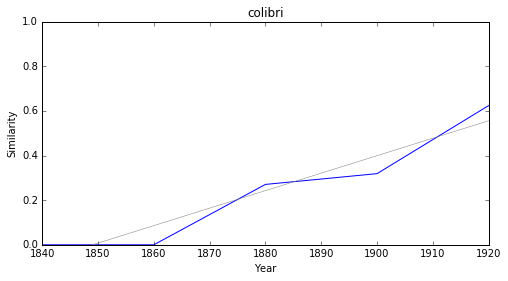

bovary


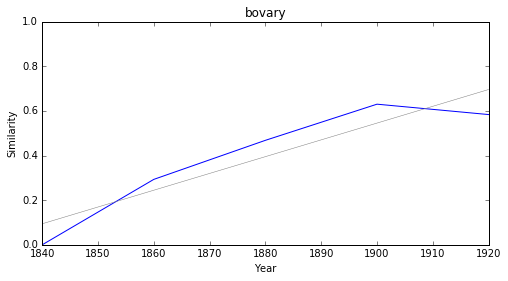

chaine


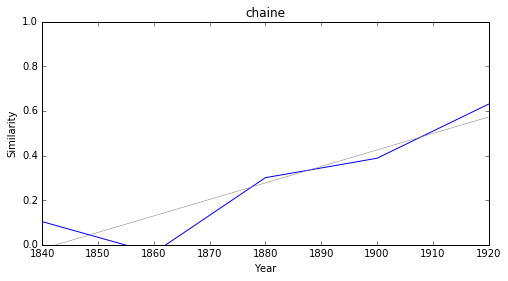

beyle


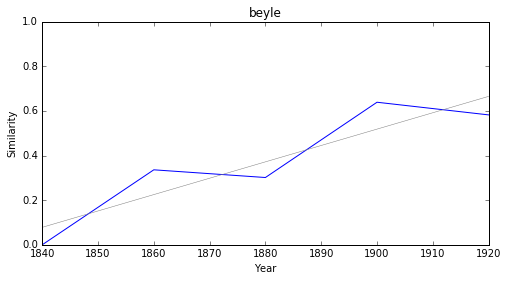

edition


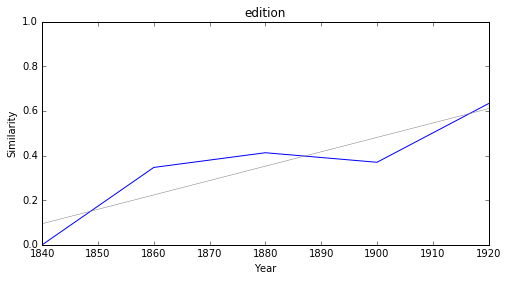

moore


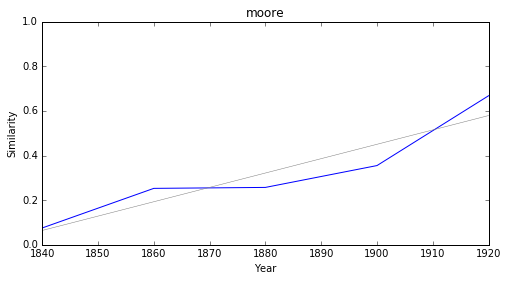

### <i><b>critique</i></b>

              token     slope         p
14       relativité  0.008197  0.019425
23         revision  0.007305  0.012213
2         humanisme  0.007279  0.012308
1     vulgarisation  0.007245  0.005336
18   méconnaissance  0.007016  0.018721
19         pionnier  0.006710  0.010486
17  impressionniste  0.006651  0.040755
7      terminologie  0.006493  0.012350
16          concept  0.006284  0.010870
27         biologie  0.006214  0.017487



relativité


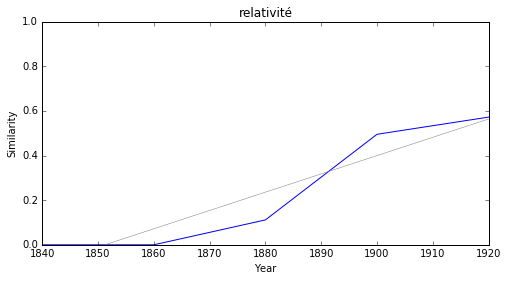

revision


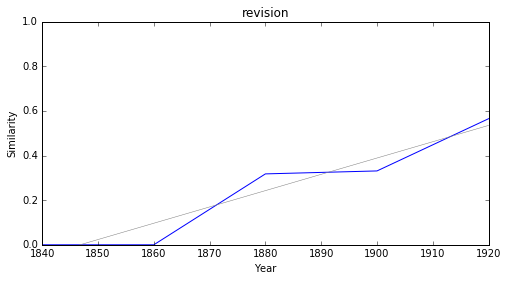

humanisme


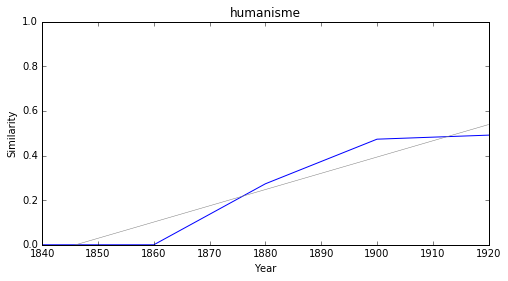

vulgarisation


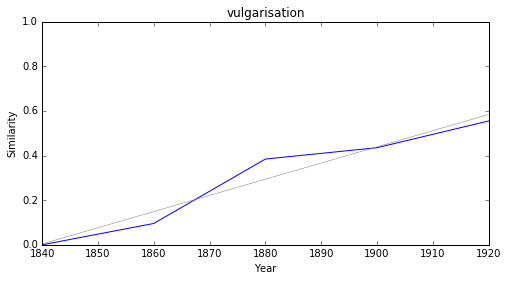

méconnaissance


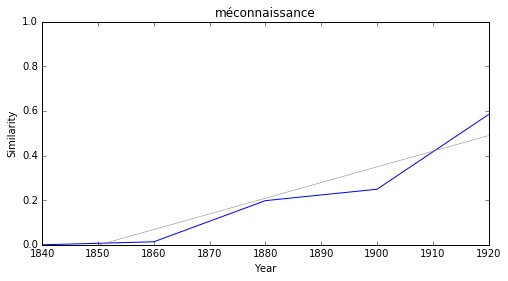

pionnier


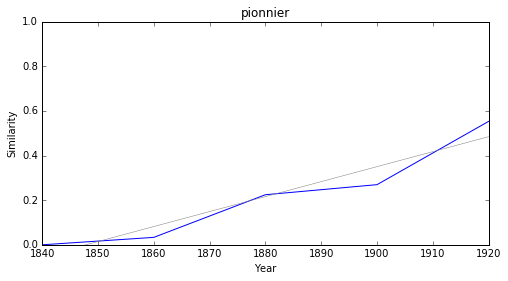

impressionniste


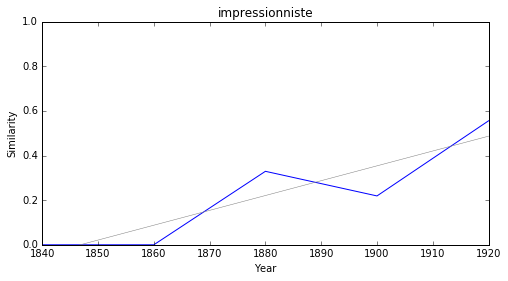

terminologie


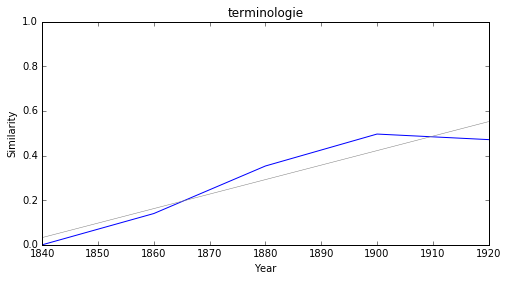

concept


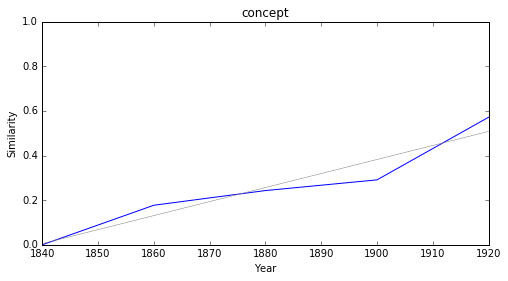

biologie


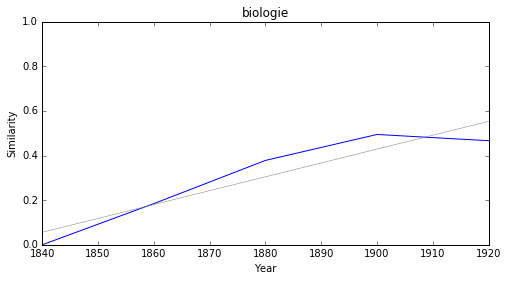

### <i><b>roman</i></b>

          token     slope         p
17      bibelot  0.009075  0.007370
25   subjonctif  0.008751  0.001123
16  bergsonisme  0.008746  0.042496
3          xvnc  0.008570  0.008301
20      mensuel  0.008240  0.012608
18  pragmatisme  0.008214  0.048610
22    prototype  0.008003  0.032682
2     humanisme  0.007941  0.038164
15      concept  0.007760  0.009020
5    parnassien  0.007455  0.037942



bibelot


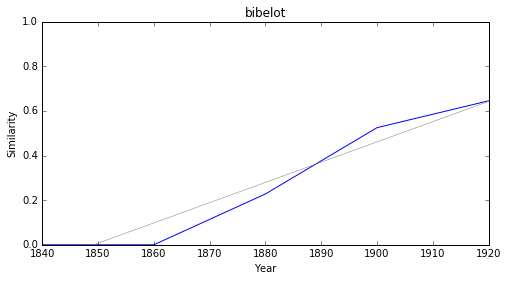

subjonctif


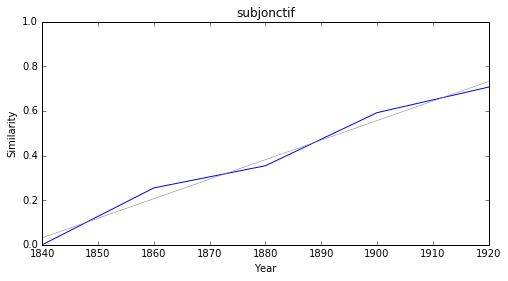

bergsonisme


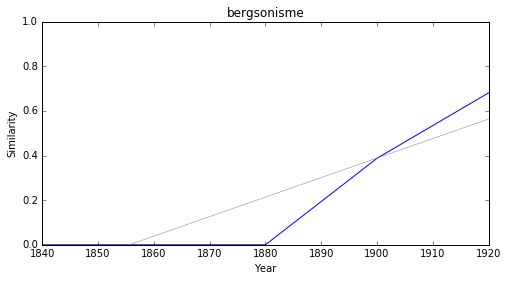

xvnc


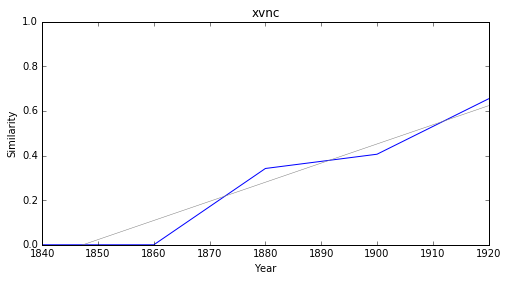

mensuel


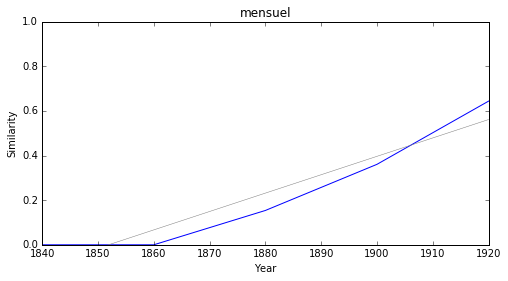

pragmatisme


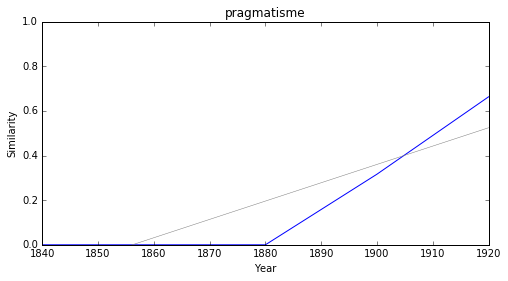

prototype


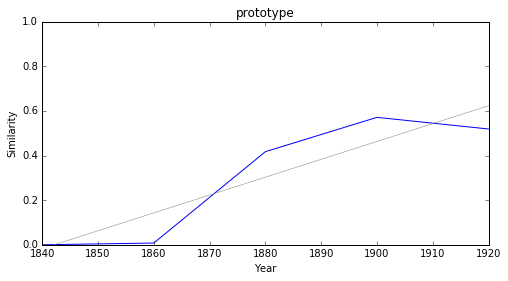

humanisme


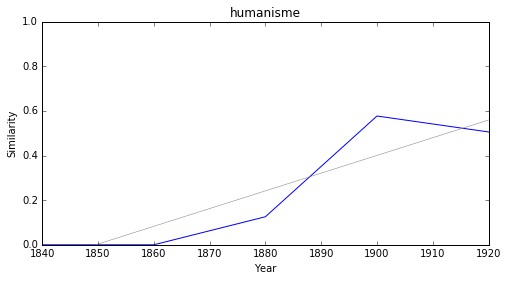

concept


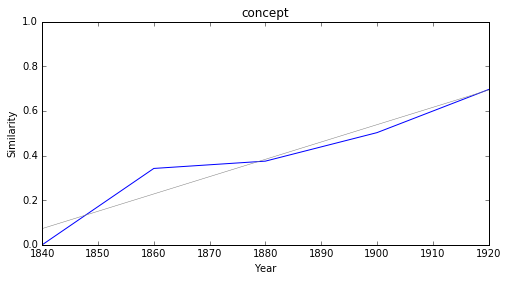

parnassien


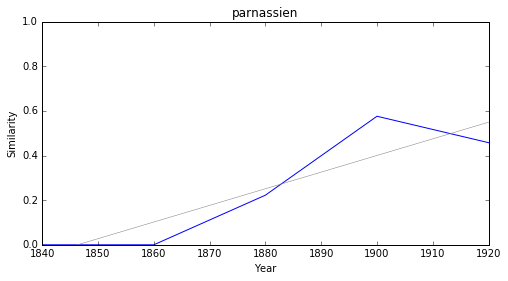

### <i><b>théâtre</i></b>

          token     slope         p
1          xvnc  0.009702  0.008218
32  fédéralisme  0.008634  0.021033
30   subjonctif  0.008615  0.000541
20       castor  0.008439  0.044540
14          xme  0.008072  0.008721
12   litteraire  0.007662  0.019292
0    machinisme  0.007604  0.037416
2   classicisme  0.007251  0.029240
23       rythme  0.007151  0.017763
28      dormeur  0.007056  0.023513



xvnc


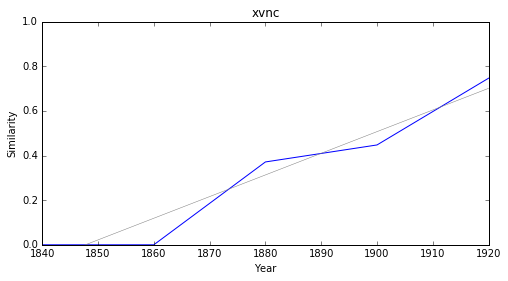

fédéralisme


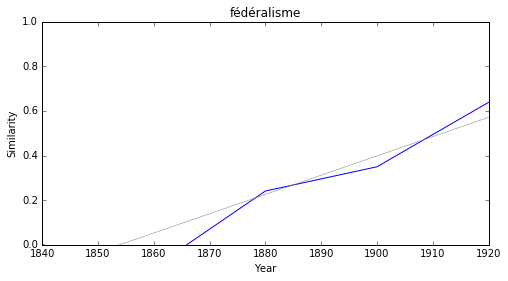

subjonctif


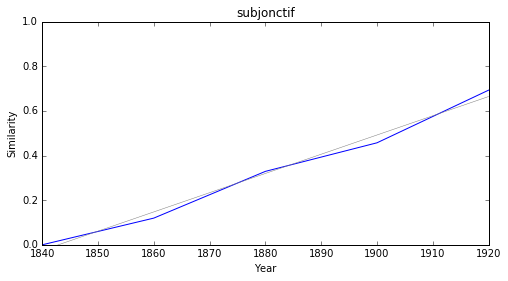

castor


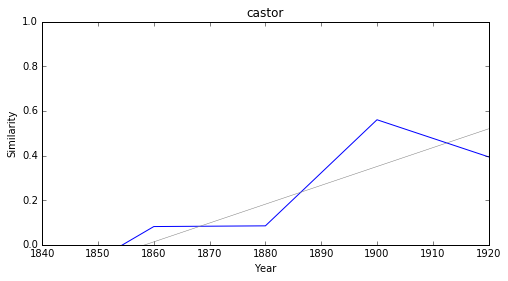

xme


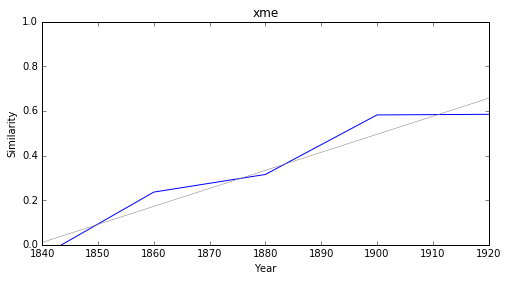

litteraire


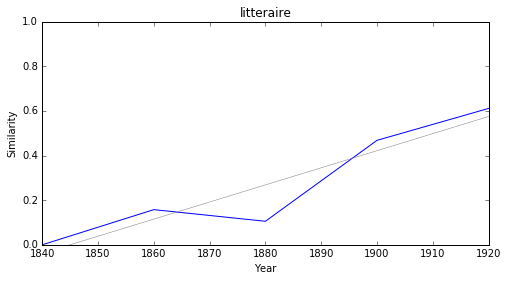

machinisme


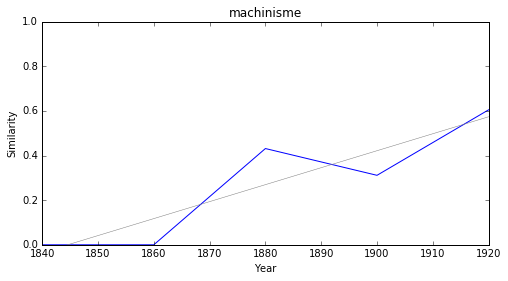

classicisme


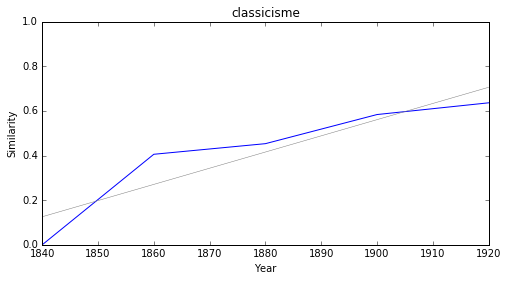

rythme


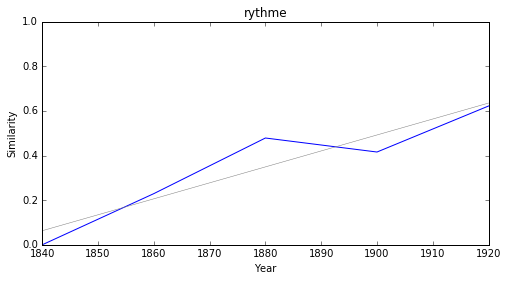

dormeur


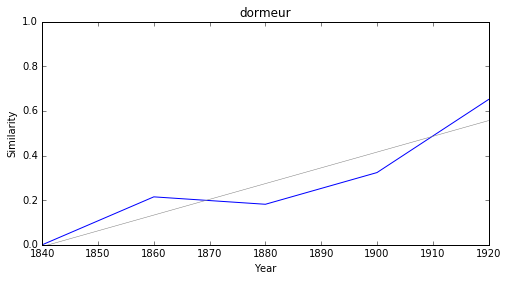

### <i><b>drame</i></b>

              token     slope         p
17           rythme  0.010260  0.011455
0   traditionalisme  0.009921  0.043208
20       subjonctif  0.009514  0.002153
11      bergsonisme  0.009301  0.040704
7      nationalisme  0.009094  0.048052
10          concept  0.008912  0.007678
4       classicisme  0.008220  0.037947
2        relèvement  0.007867  0.015140
18          dormeur  0.007481  0.025747
14          vocable  0.007216  0.047733



rythme


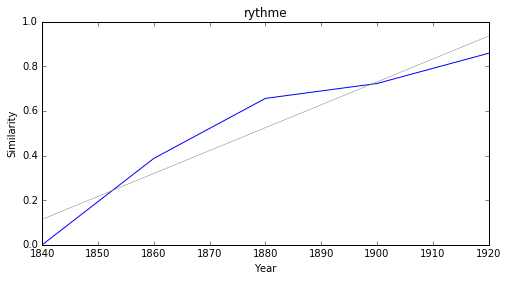

traditionalisme


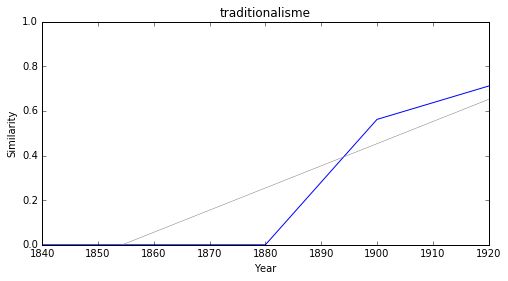

subjonctif


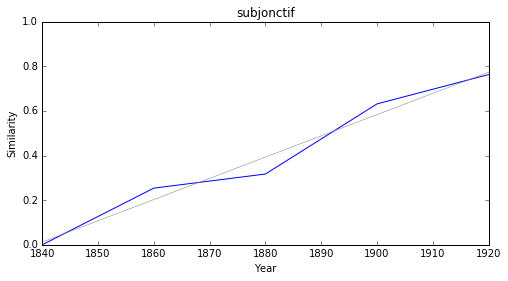

bergsonisme


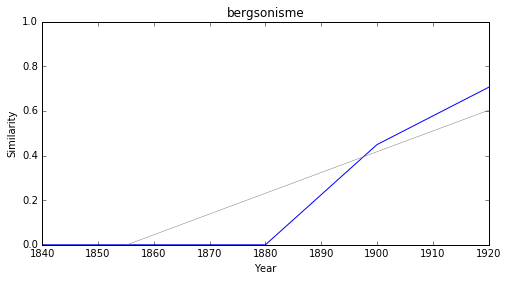

nationalisme


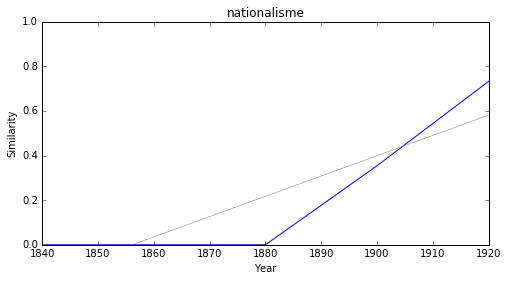

concept


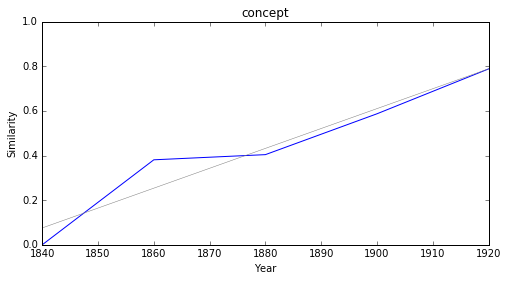

classicisme


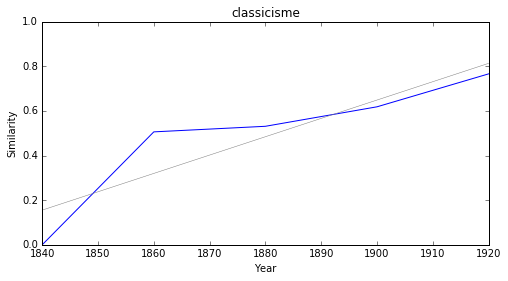

relèvement


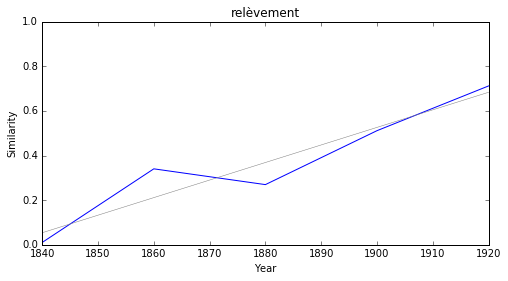

dormeur


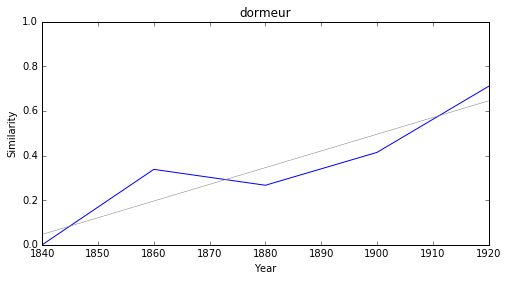

vocable


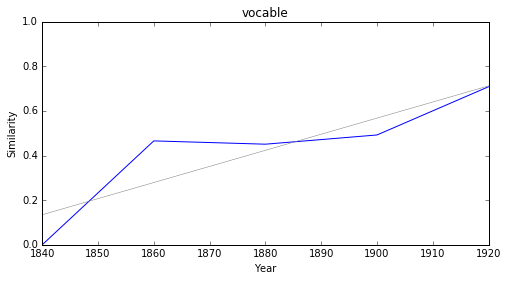

### <i><b>esprit</i></b>

              token     slope         p
3       inconscient  0.008537  0.008160
35          esthète  0.008114  0.026978
13  intellectualité  0.008077  0.019835
5   impressionnisme  0.008043  0.021195
18   encyclopédiste  0.007739  0.037994
6         intrusion  0.007733  0.025382
47      objectivité  0.007641  0.000076
40             brio  0.007528  0.019721
31    accommodation  0.007385  0.042235
12          éthique  0.007145  0.008630



inconscient


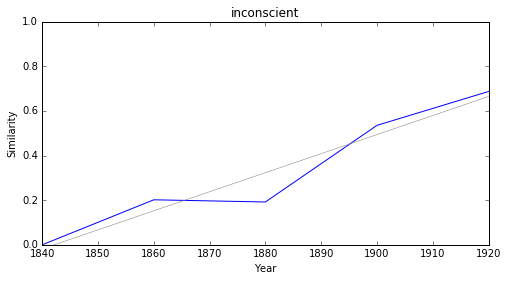

esthète


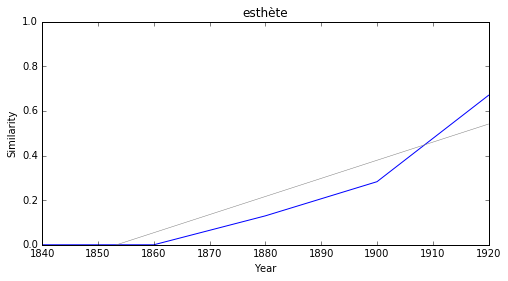

intellectualité


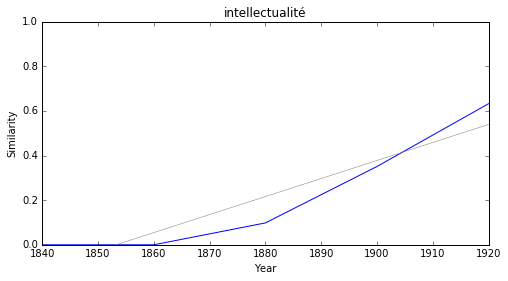

impressionnisme


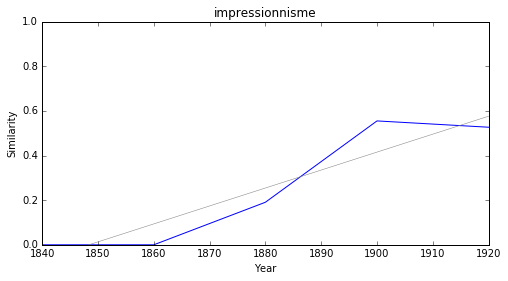

encyclopédiste


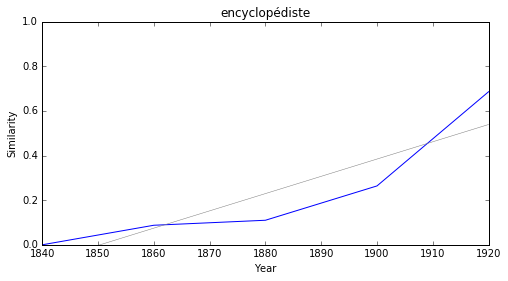

intrusion


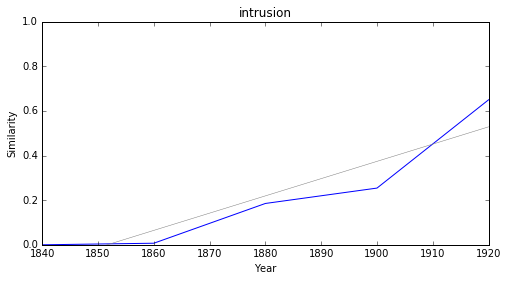

objectivité


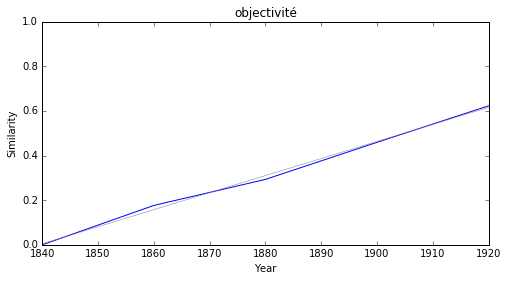

brio


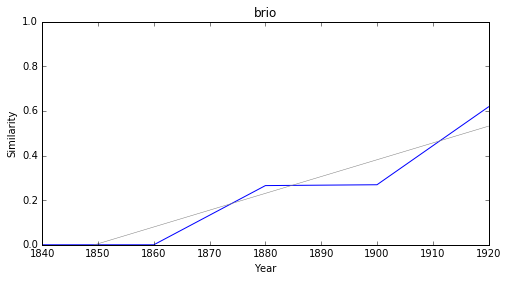

accommodation


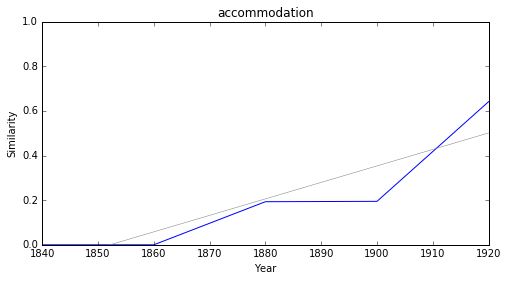

éthique


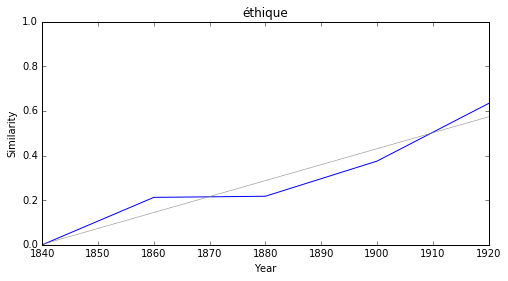

### <i><b>langue</i></b>

             token     slope         p
20      relativité  0.008774  0.029943
28        revision  0.008695  0.005783
26  méconnaissance  0.008457  0.005564
7     répercussion  0.008032  0.049184
11    terminologie  0.007694  0.009385
25      préciosité  0.006800  0.037287
10   bibliographie  0.006094  0.035585
33        coopérer  0.005476  0.043155
24       technique  0.004233  0.024828
22          féerie  0.003665  0.014276



relativité


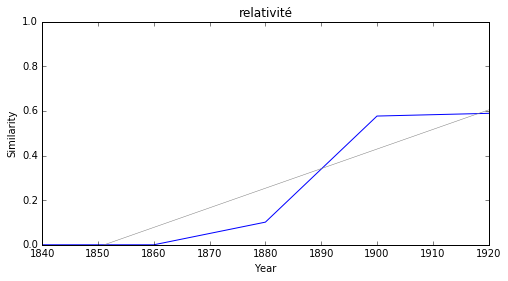

revision


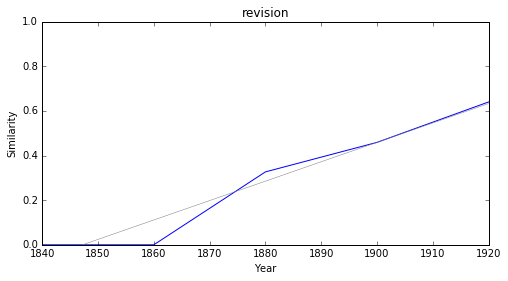

méconnaissance


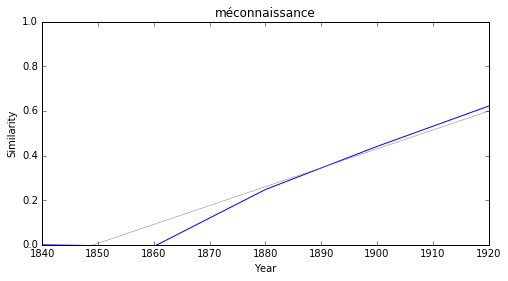

répercussion


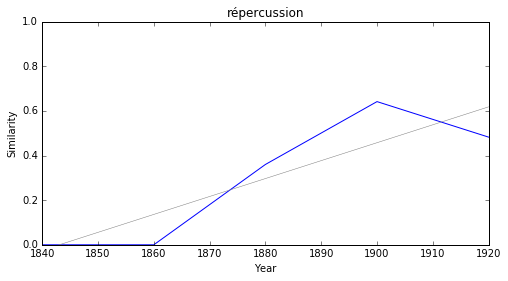

terminologie


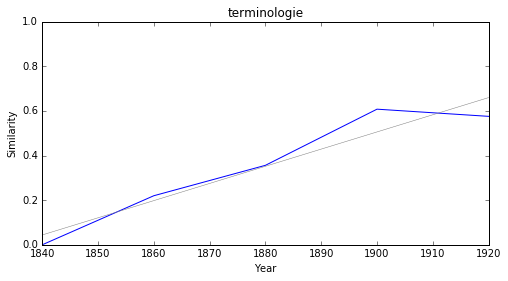

préciosité


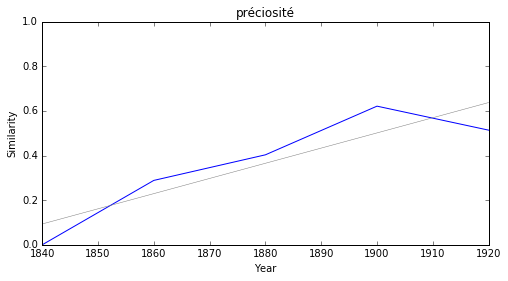

bibliographie


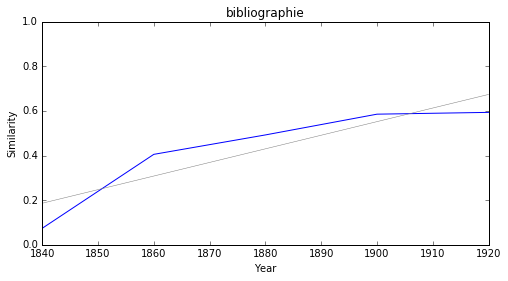

coopérer


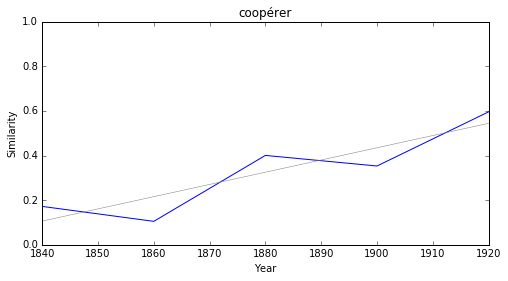

technique


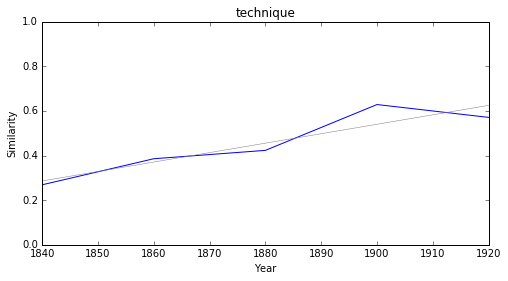

féerie


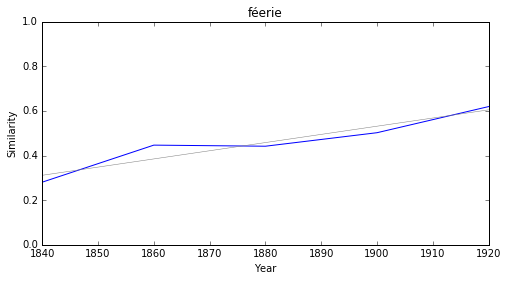

### <i><b>diplomatie</i></b>

           token     slope         p
26        blague  0.012104  0.020559
10    sociologie  0.012003  0.044041
31       corrèze  0.011729  0.004855
28     immanente  0.011635  0.005175
27    figuration  0.011572  0.037658
1   sénéchaussée  0.011131  0.041496
4      nostalgie  0.010399  0.024292
15      débilité  0.009920  0.043241
22    préciosité  0.009732  0.036926
8      lubricité  0.009702  0.009635



blague


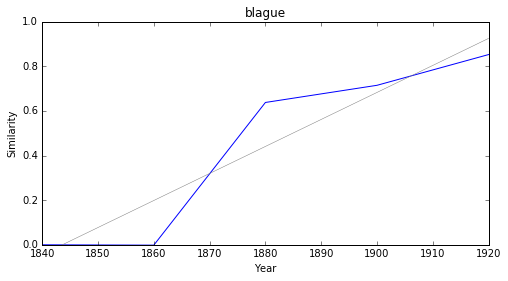

sociologie


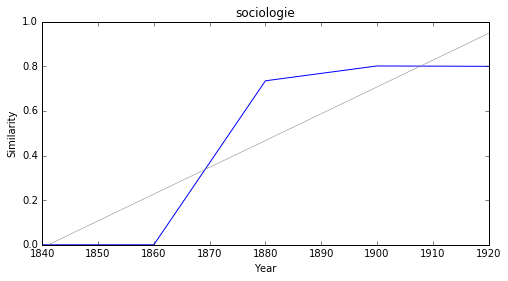

corrèze


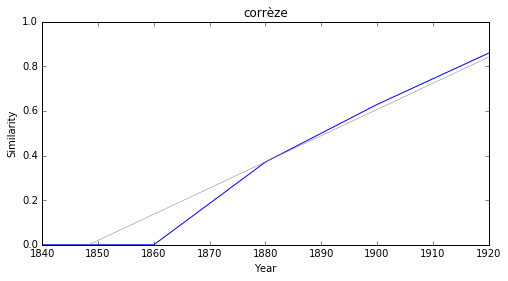

immanente


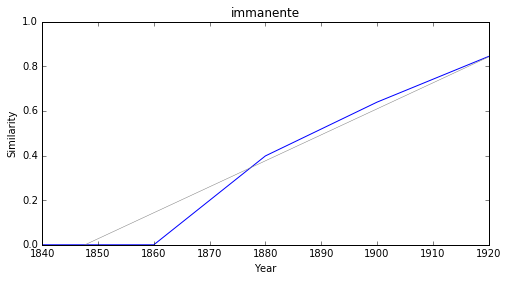

figuration


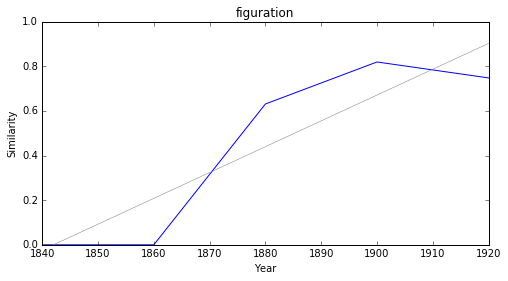

sénéchaussée


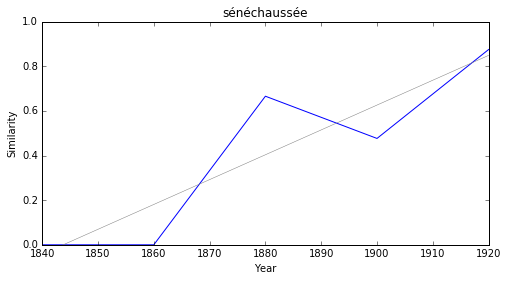

nostalgie


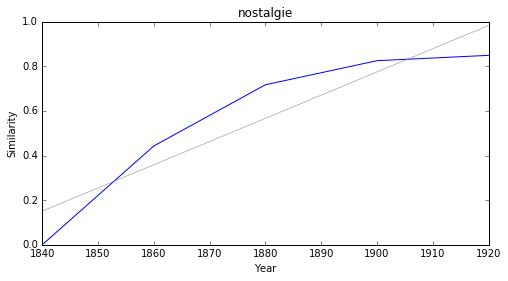

débilité


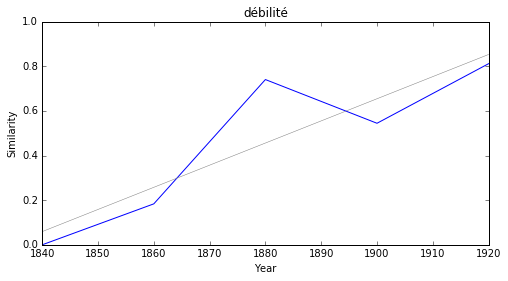

préciosité


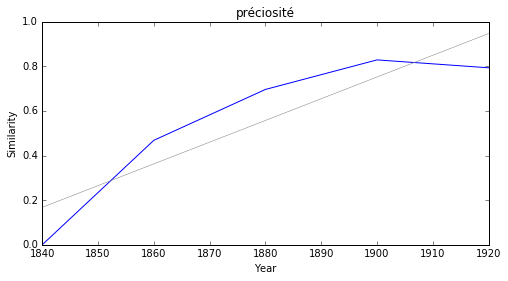

lubricité


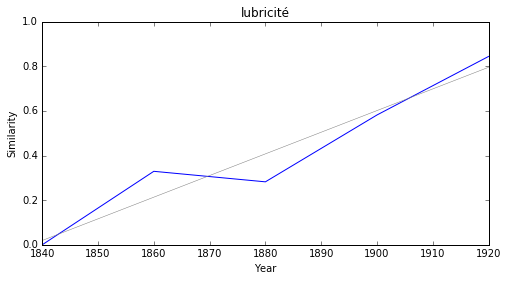

### <i><b>politique</i></b>

             token     slope         p
12      relativité  0.009054  0.017385
33        immanent  0.008571  0.010197
20        economie  0.008205  0.013934
10      économique  0.004972  0.002886
24  traditionnelle  0.004303  0.046769
16       technique  0.004061  0.003248
5         notation  0.003710  0.042659
18     abstraction  0.003520  0.027781
14      romantique  0.003513  0.005898
28       évolution  0.003405  0.002190



relativité


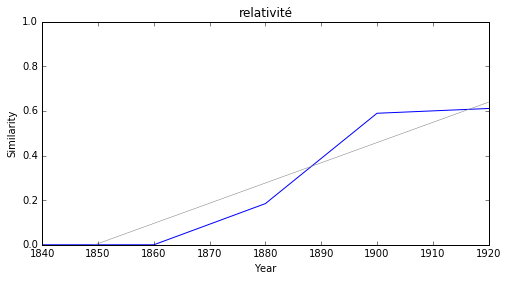

immanent


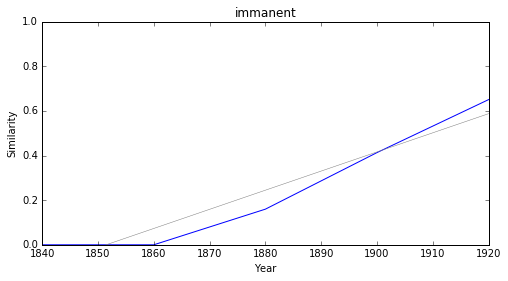

economie


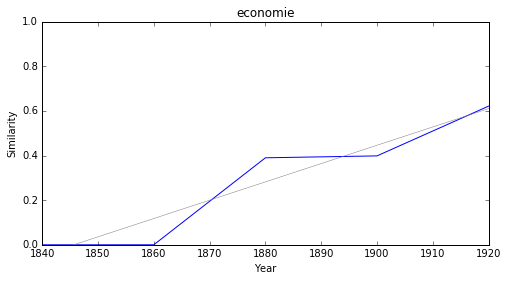

économique


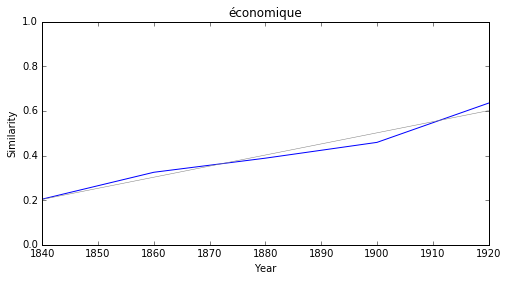

traditionnelle


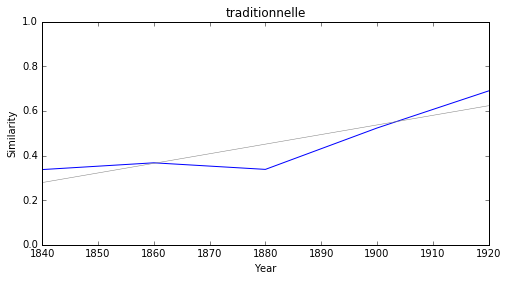

technique


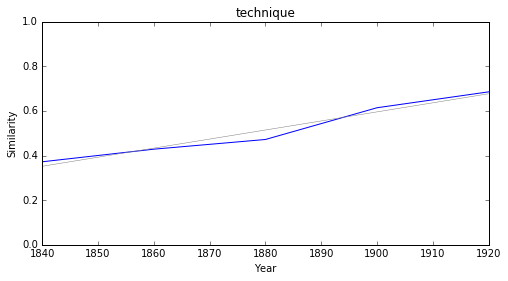

notation


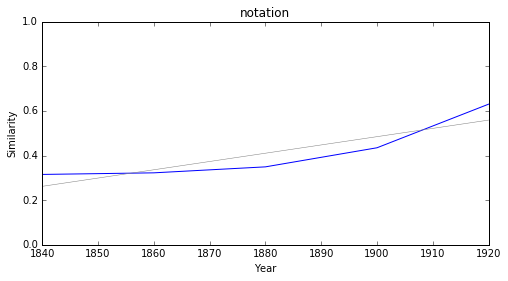

abstraction


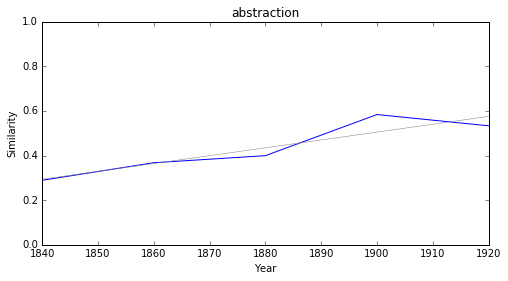

romantique


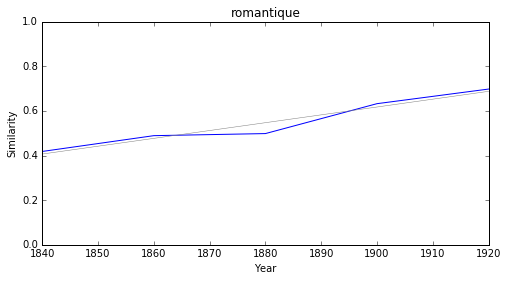

évolution


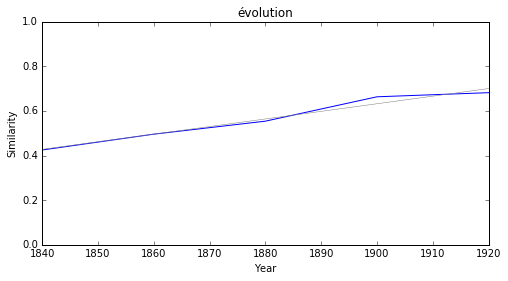

### <i><b>morale</i></b>

             token     slope         p
4       suggestion  0.011138  0.034709
16      relativité  0.010795  0.007435
6    compréhension  0.009988  0.041128
19  méconnaissance  0.009462  0.002760
28        impureté  0.008696  0.024401
10      consciente  0.008647  0.025653
14          rareté  0.005320  0.039634
18       technique  0.005207  0.000578
31        vitalité  0.004347  0.023115
29  traditionnelle  0.004044  0.023089



suggestion


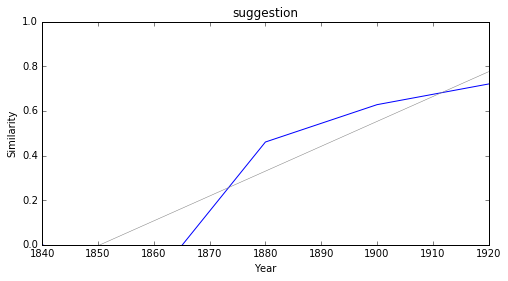

relativité


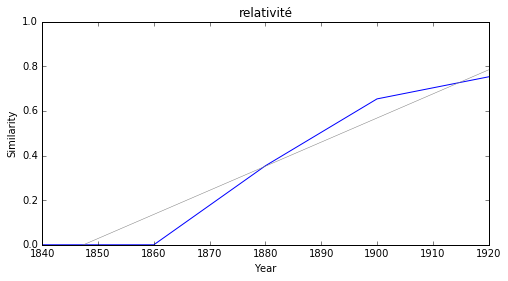

compréhension


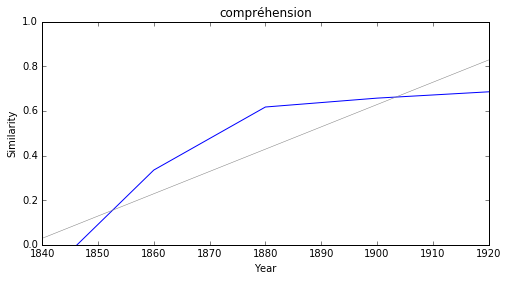

méconnaissance


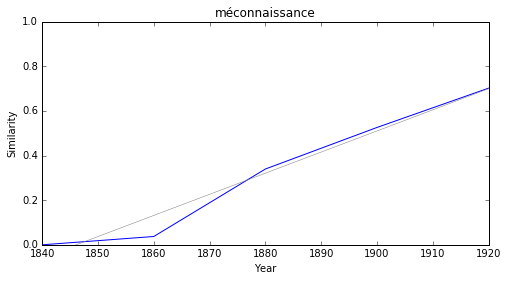

impureté


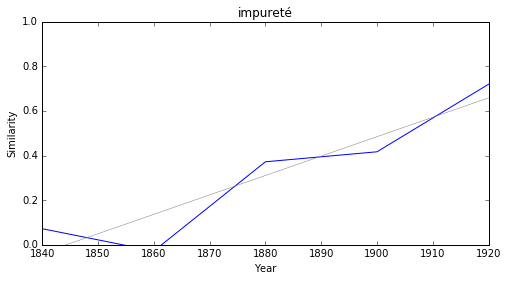

consciente


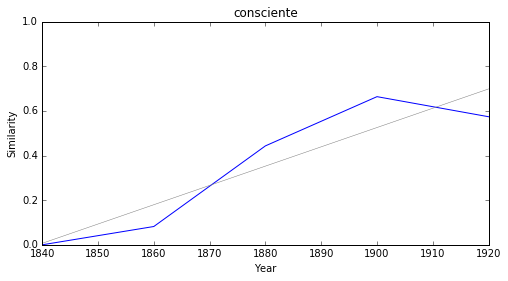

rareté


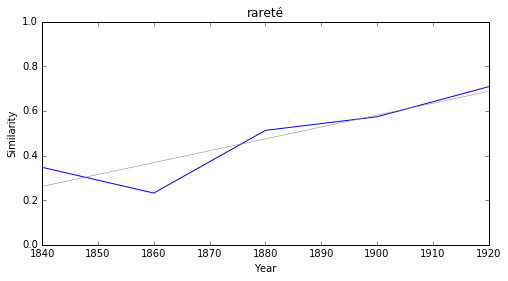

technique


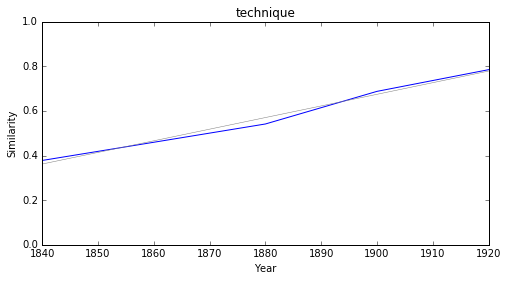

vitalité


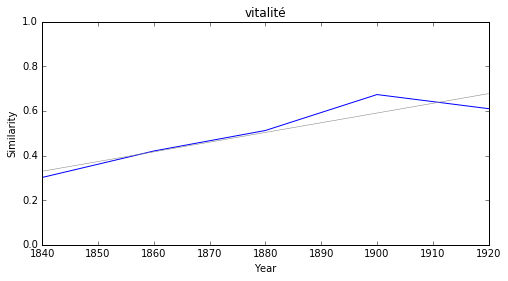

traditionnelle


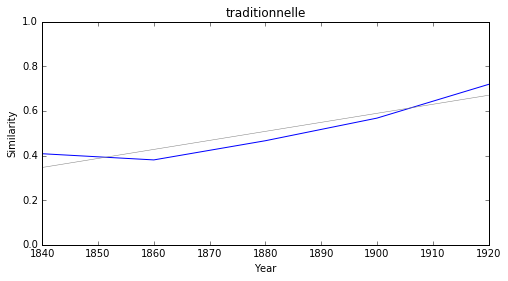

### <i><b>société</i></b>

              token     slope         p
2              arch  0.009617  0.043924
18  bibliographique  0.009026  0.002271
21       sociologie  0.008876  0.039197
23              mém  0.008633  0.031434
27         bulletin  0.008398  0.032844
42       symboliste  0.008396  0.010706
3      sénéchaussée  0.008295  0.023477
1            parité  0.008154  0.016705
17    bibliographie  0.008035  0.007612
14             publ  0.008032  0.018726



arch


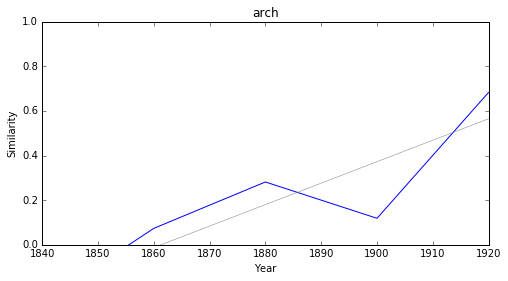

bibliographique


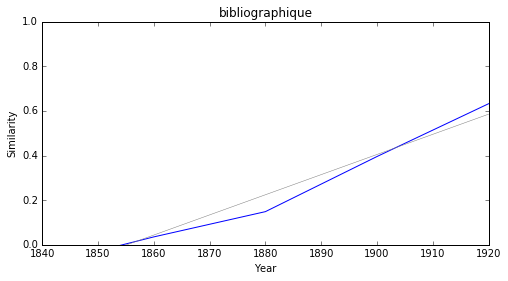

sociologie


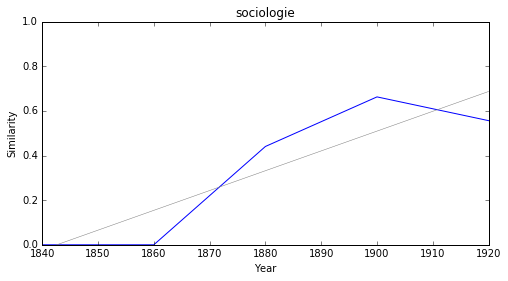

mém


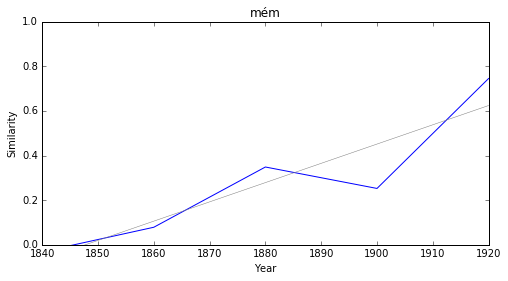

bulletin


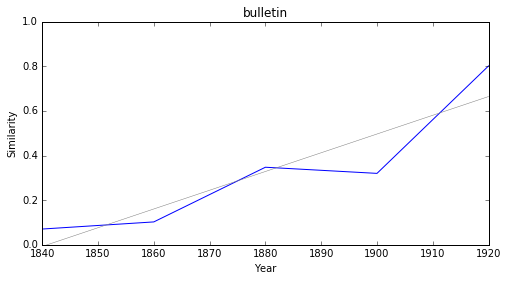

symboliste


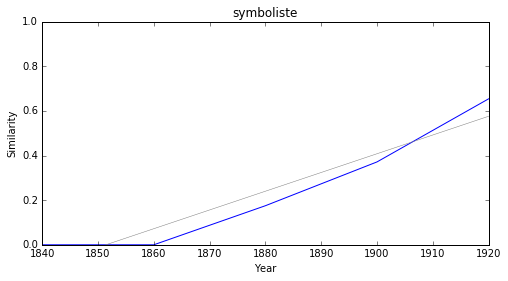

sénéchaussée


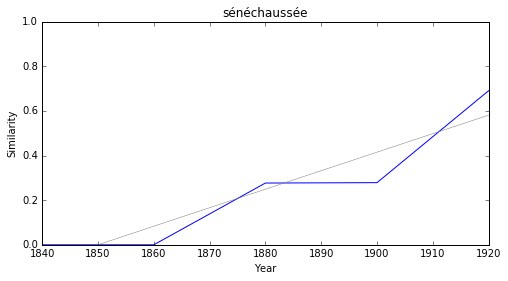

parité


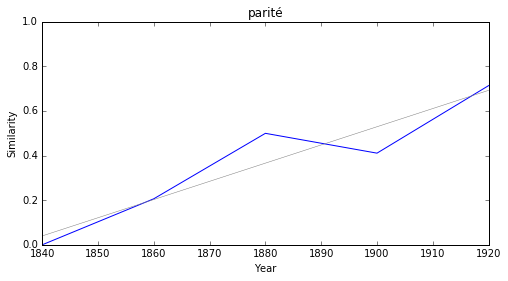

bibliographie


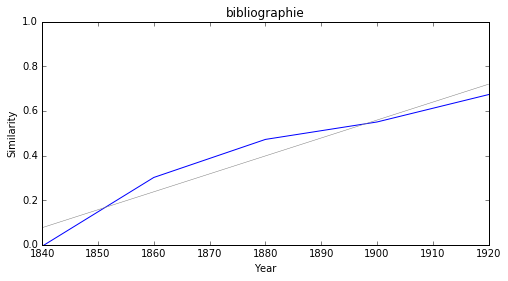

publ


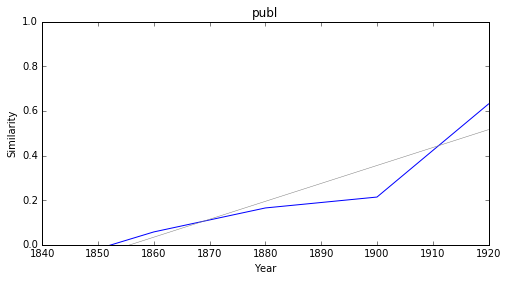

### <i><b>pouvoir</i></b>

             token     slope         p
1        réconfort  0.009124  0.000907
19          rythme  0.007636  0.003081
22     naturalisme  0.006932  0.030714
4   fonctionnement  0.006489  0.019655
10       inexploré  0.006305  0.045834
15     renoncement  0.004747  0.010719
16          pourra  0.002388  0.002275
6        incapable  0.002149  0.007461
12          obligé  0.002121  0.049974
20         pouvant  0.001887  0.035102



réconfort


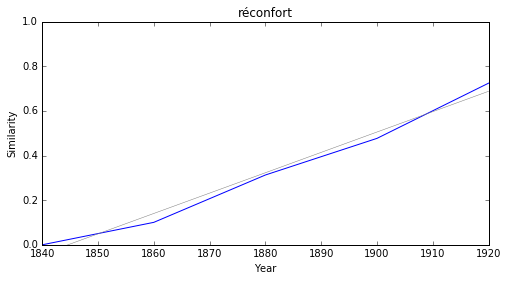

rythme


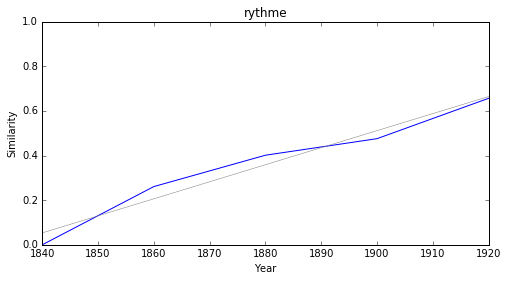

naturalisme


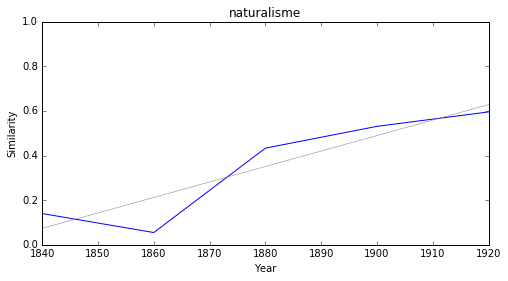

fonctionnement


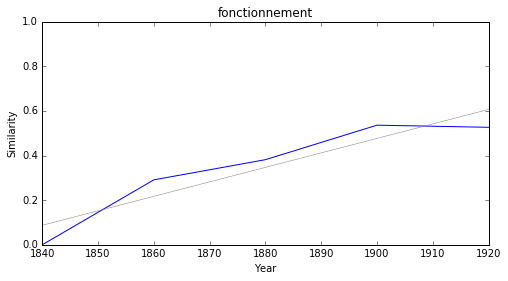

inexploré


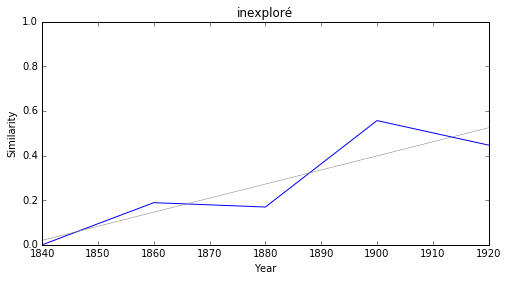

renoncement


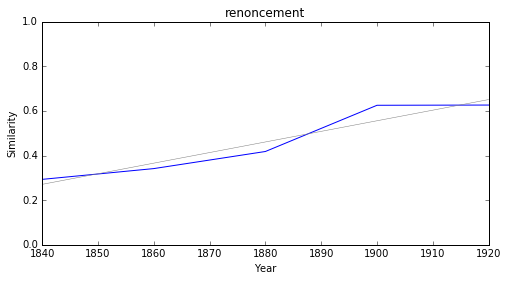

pourra


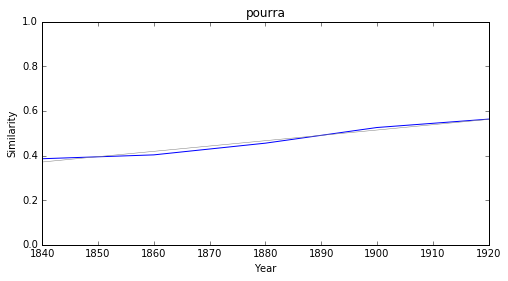

incapable


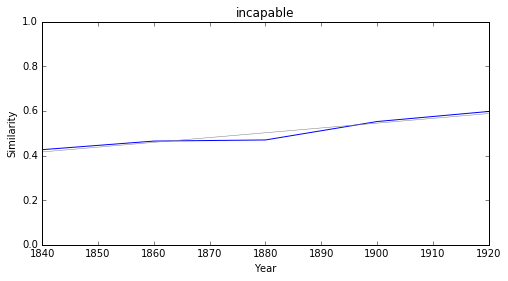

obligé


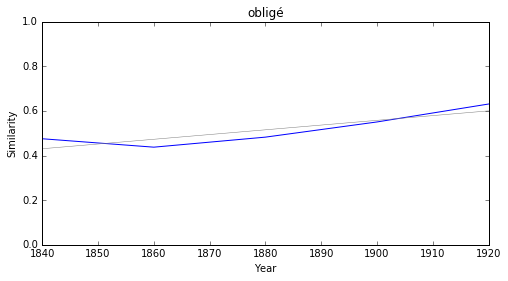

pouvant


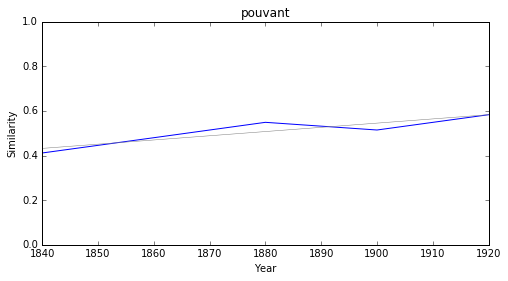

### <i><b>théologie</i></b>

             token     slope         p
13      relativité  0.011879  0.015522
2     sénéchaussée  0.010884  0.025248
22      figuration  0.010637  0.032385
17  méconnaissance  0.010413  0.000005
12        clinique  0.010351  0.004093
23    réapparition  0.010066  0.000274
16      préciosité  0.009739  0.024051
4        nostalgie  0.009568  0.021438
7          mimique  0.009423  0.036132
25          poësie  0.008441  0.045171



relativité


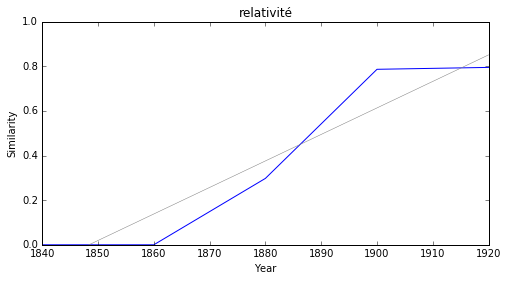

sénéchaussée


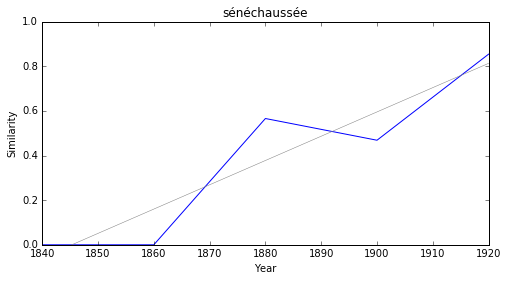

figuration


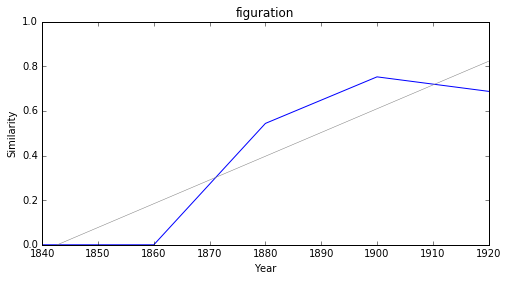

méconnaissance


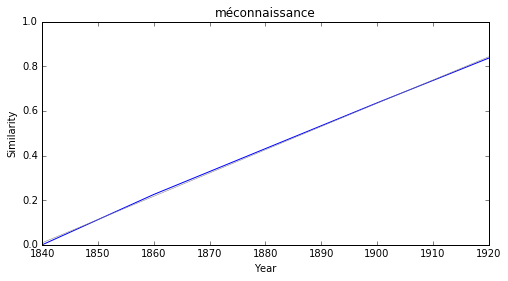

clinique


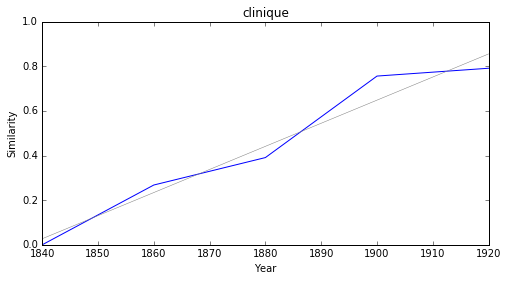

réapparition


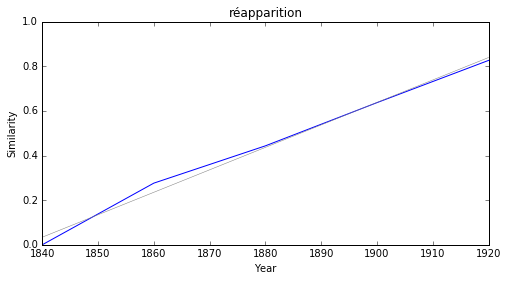

préciosité


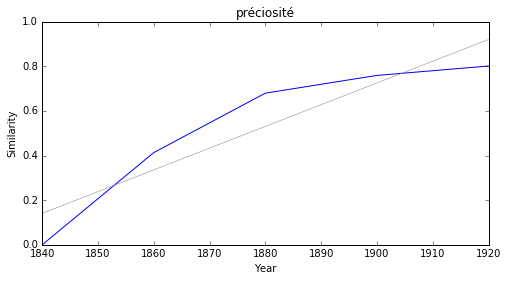

nostalgie


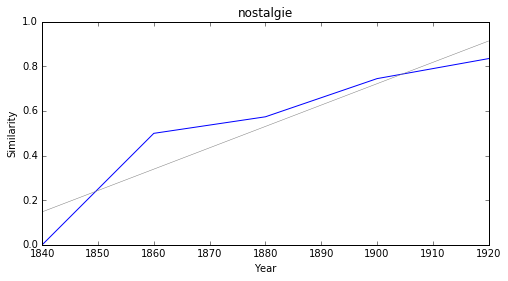

mimique


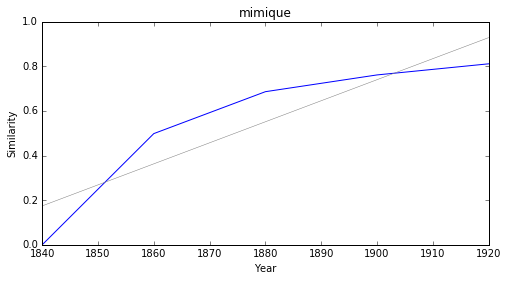

poësie


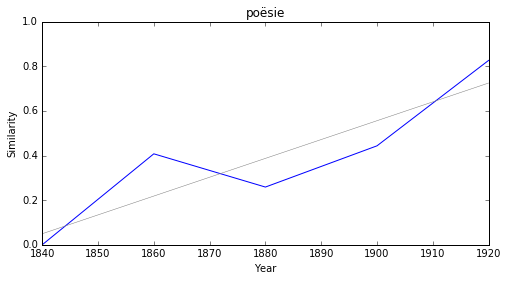

### <i><b>droit</i></b>

          token     slope         p
2     réconfort  0.008395  0.001764
17       rythme  0.007674  0.001136
11   signataire  0.007464  0.025104
14   imaginatif  0.007409  0.043400
6    repliement  0.007262  0.021842
4   classicisme  0.006639  0.009917
13       bartas  0.006239  0.028727
15  renoncement  0.004285  0.025209
18      contrat  0.002549  0.003203
5     sacrifice  0.002293  0.034426



réconfort


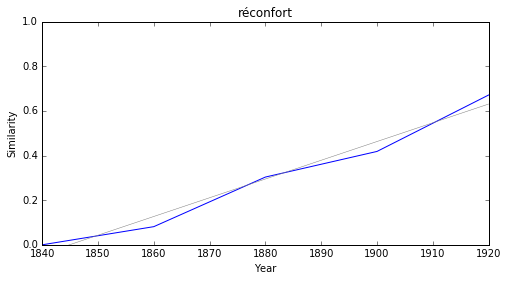

rythme


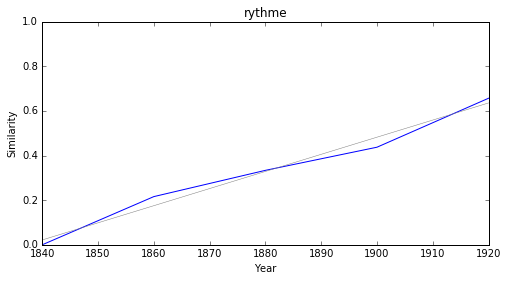

signataire


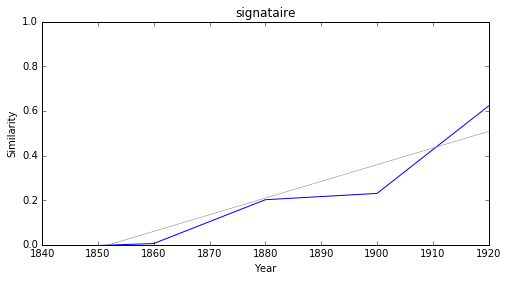

imaginatif


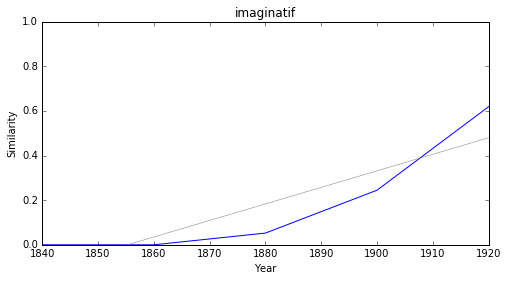

repliement


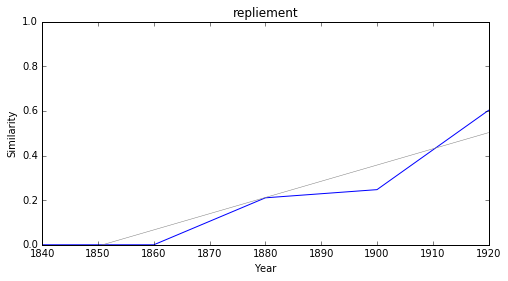

classicisme


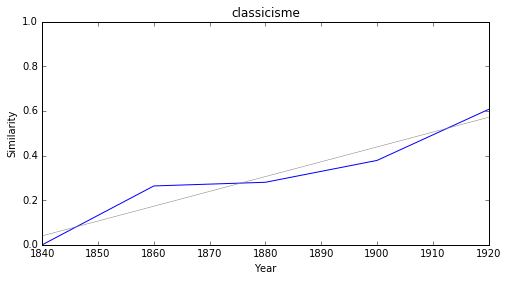

bartas


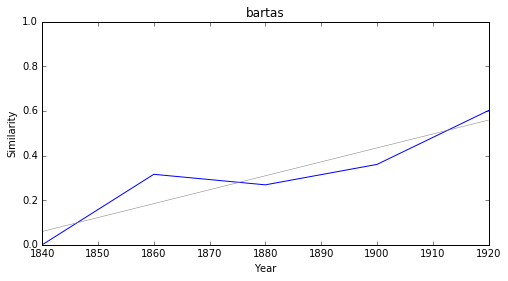

renoncement


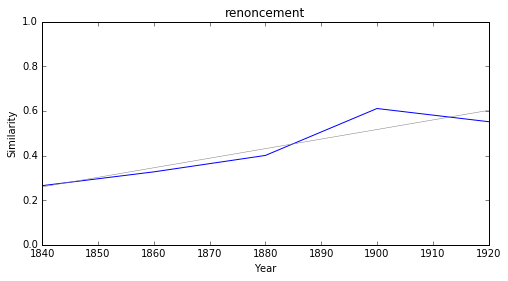

contrat


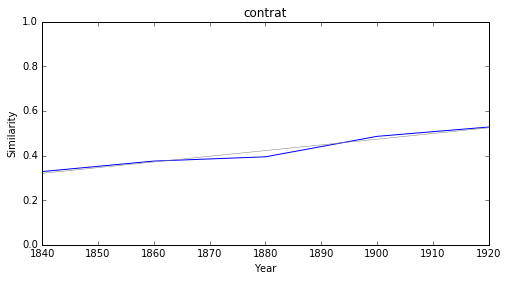

sacrifice


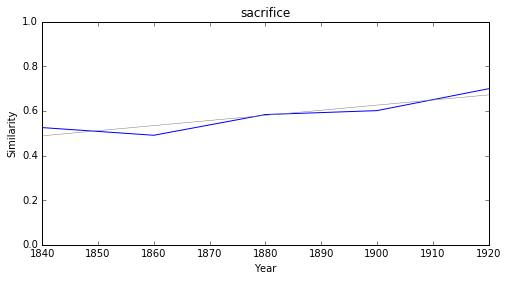

### <i><b>loi</i></b>

              token     slope         p
4        suggestion  0.011689  0.039366
18   méconnaissance  0.011481  0.007815
13       relativité  0.011274  0.015788
6     compréhension  0.010952  0.020616
16     collectivité  0.010140  0.023744
20     réapparition  0.008851  0.007610
19     dissemblance  0.008310  0.021268
22     constatation  0.008267  0.043069
0   différenciation  0.007898  0.035781
11           rareté  0.006210  0.021307



suggestion


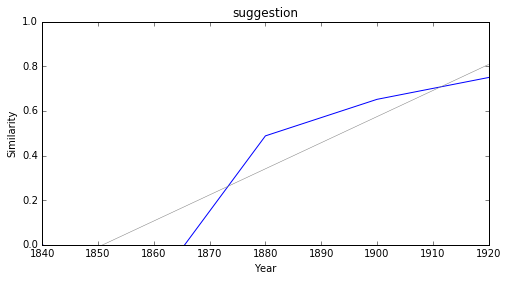

méconnaissance


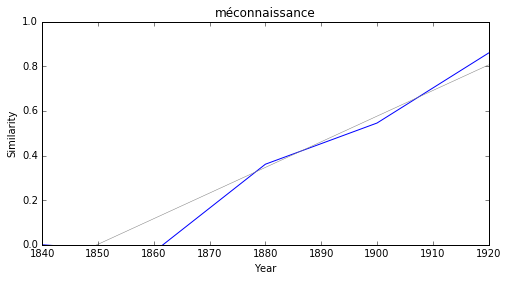

relativité


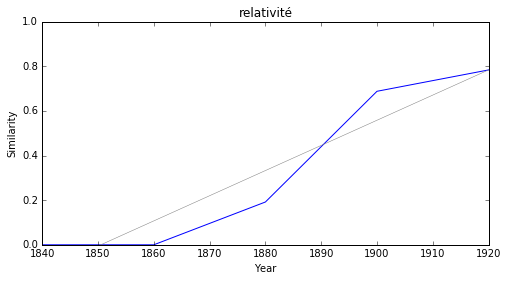

compréhension


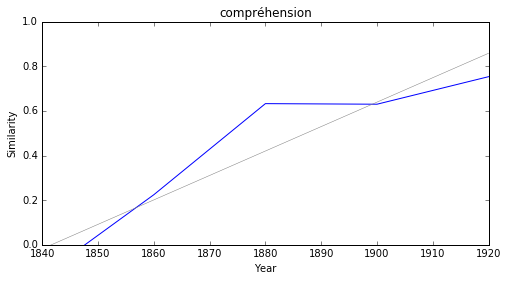

collectivité


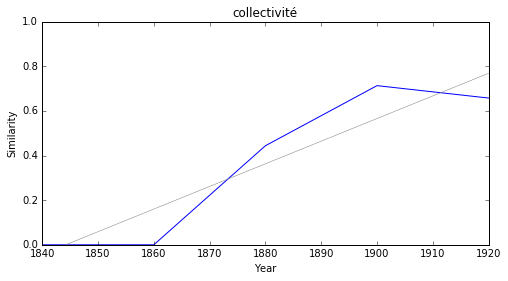

réapparition


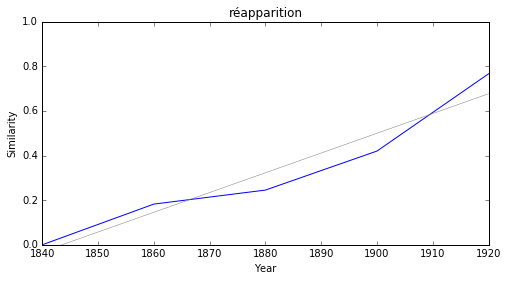

dissemblance


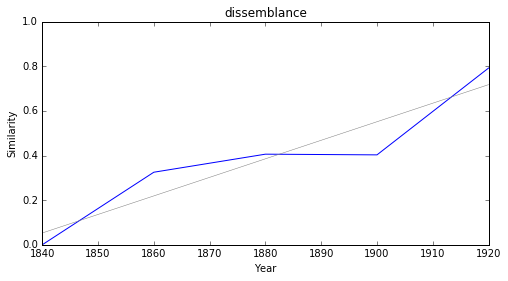

constatation


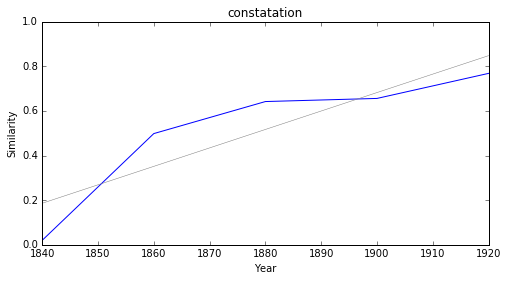

différenciation


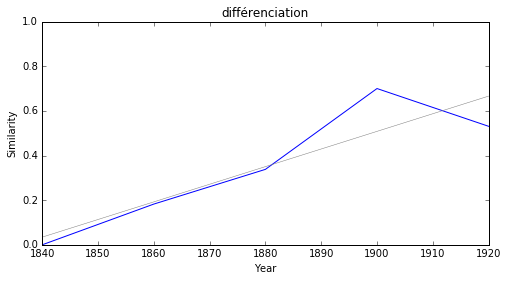

rareté


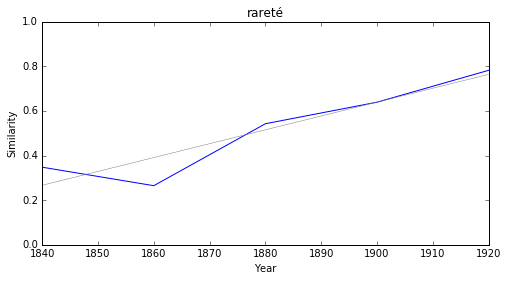

### <i><b>méthode</i></b>

             token     slope         p
4    compréhension  0.011846  0.023947
13  méconnaissance  0.011747  0.011924
6       aberration  0.011527  0.044388
10      relativité  0.011113  0.012695
2       suggestion  0.011012  0.025440
14       résonance  0.010557  0.005913
12    collectivité  0.010219  0.026136
19      virtualité  0.009473  0.031786
18    constatation  0.009155  0.029166
16    dissemblance  0.009008  0.011686



compréhension


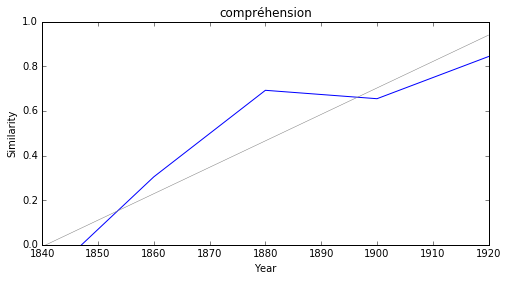

méconnaissance


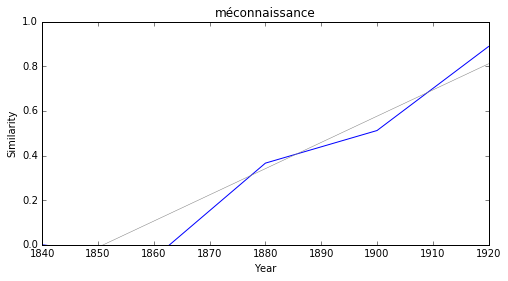

aberration


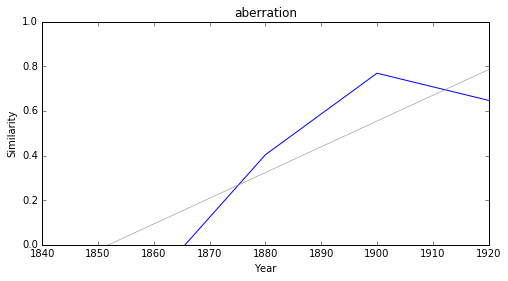

relativité


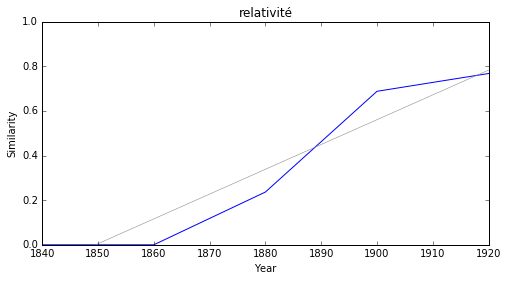

suggestion


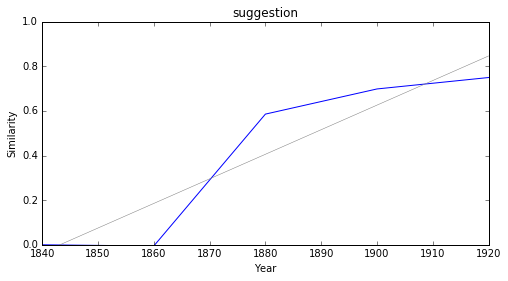

résonance


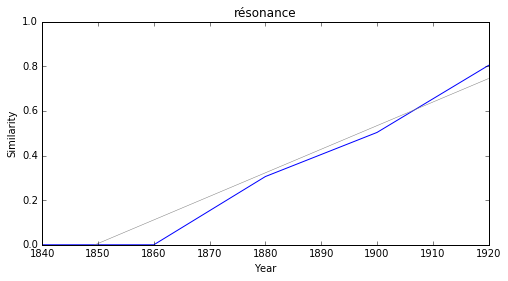

collectivité


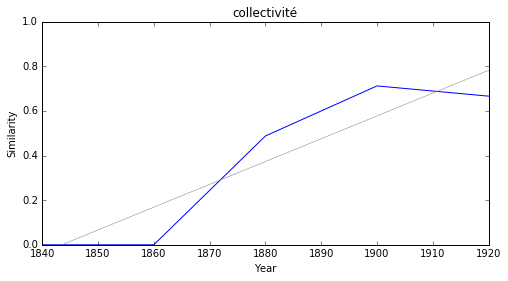

virtualité


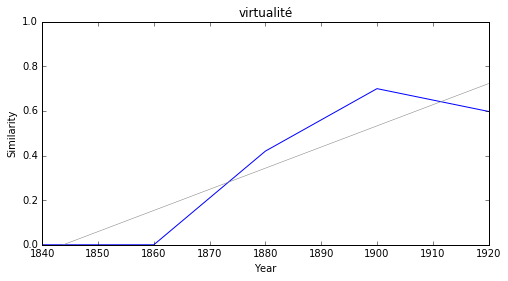

constatation


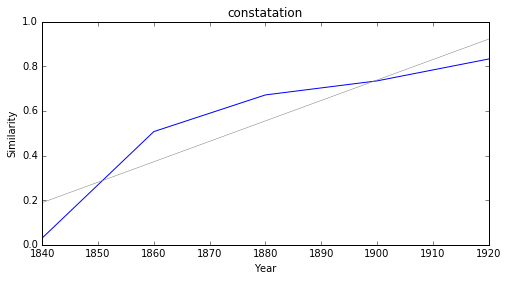

dissemblance


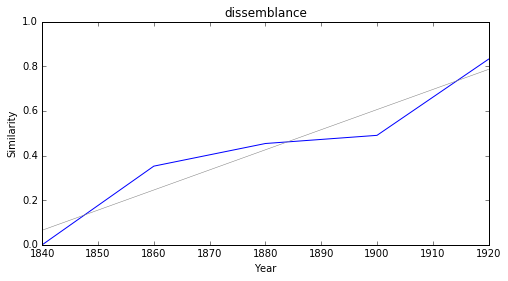

### <i><b>génie</i></b>

              token     slope         p
0   traditionalisme  0.009599  0.042625
25           rythme  0.009490  0.013379
22      pragmatisme  0.008981  0.042283
21          bibelot  0.008920  0.014996
2         réconfort  0.008730  0.015961
17          concept  0.008593  0.000463
4         leitmotiv  0.008476  0.045810
31       subjonctif  0.008244  0.008273
33       pessimisme  0.008100  0.026035
27             brio  0.008010  0.016077



traditionalisme


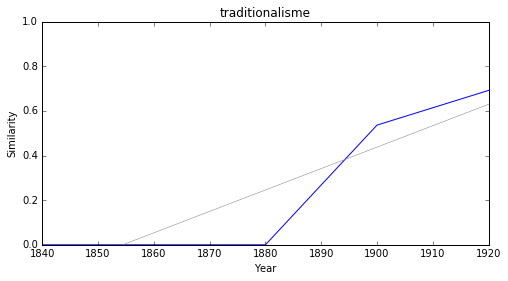

rythme


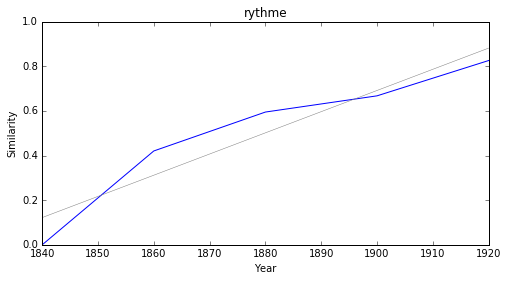

pragmatisme


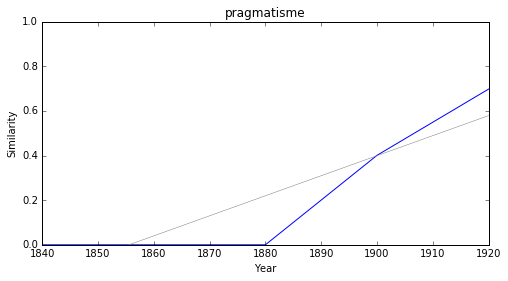

bibelot


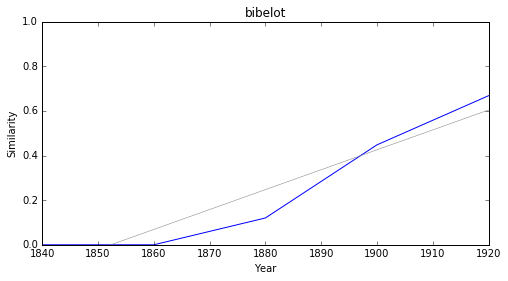

réconfort


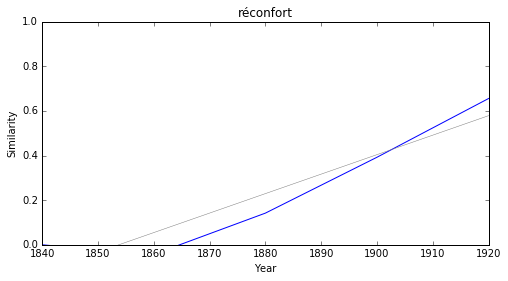

concept


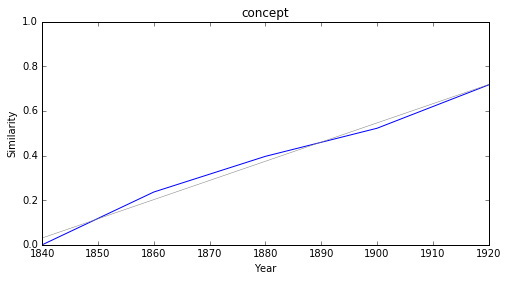

leitmotiv


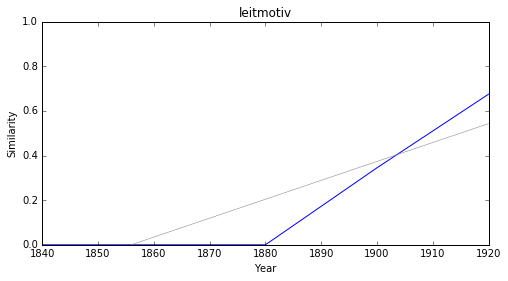

subjonctif


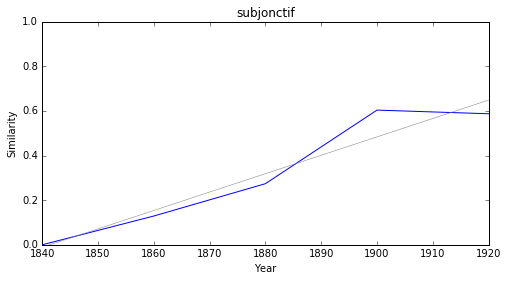

pessimisme


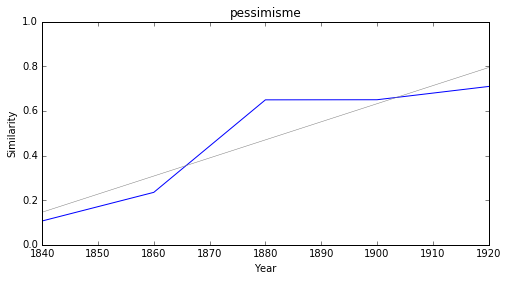

brio


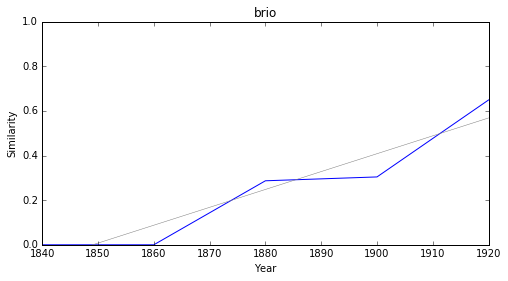

### <i><b>romantisme</i></b>

              token     slope         p
4              xvnc  0.010737  0.023968
1   traditionalisme  0.010566  0.046538
20         tremblay  0.010234  0.030578
19     nationalisme  0.010110  0.043175
26           museum  0.009440  0.016209
31      sociétariat  0.009277  0.037464
25        pacifisme  0.009146  0.048669
49       subjonctif  0.008821  0.035930
41        quiproquo  0.008017  0.038508
2        relèvement  0.007907  0.044171



xvnc


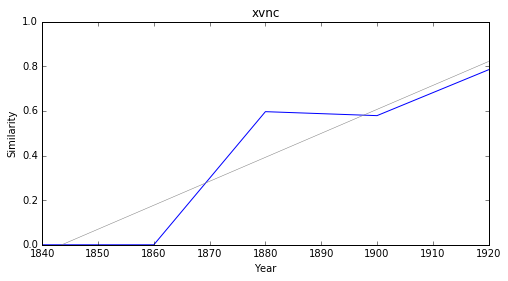

traditionalisme


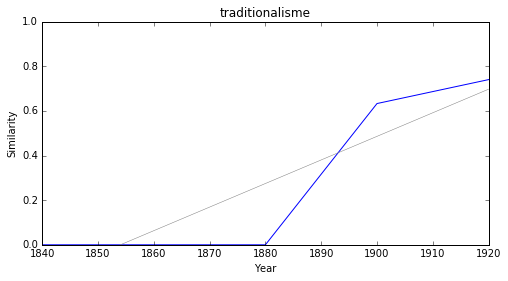

tremblay


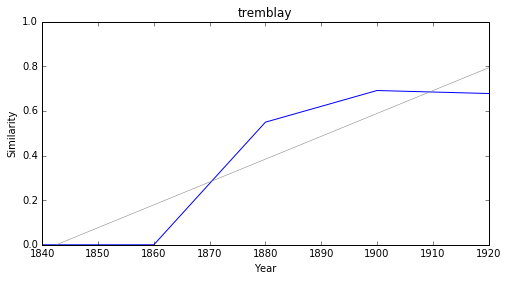

nationalisme


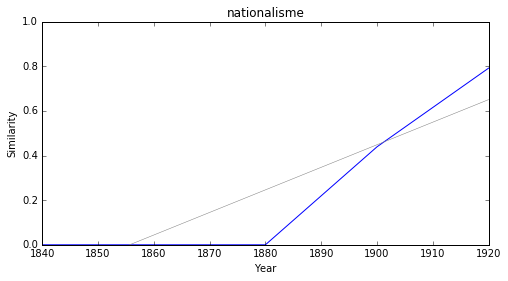

museum


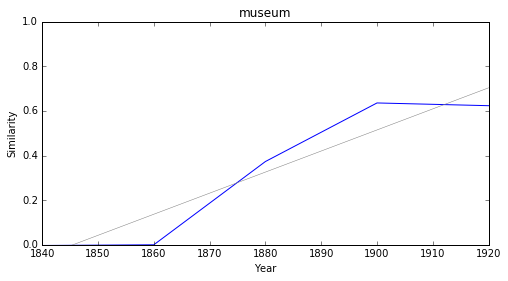

sociétariat


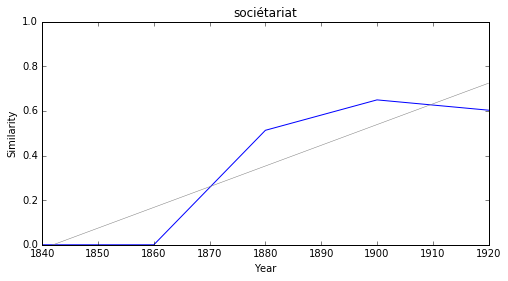

pacifisme


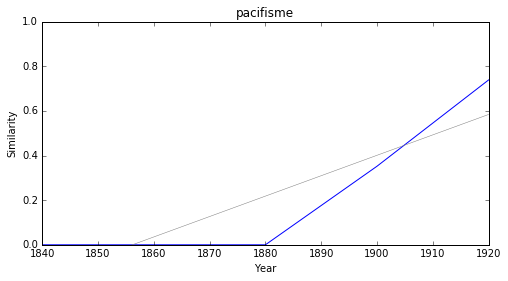

subjonctif


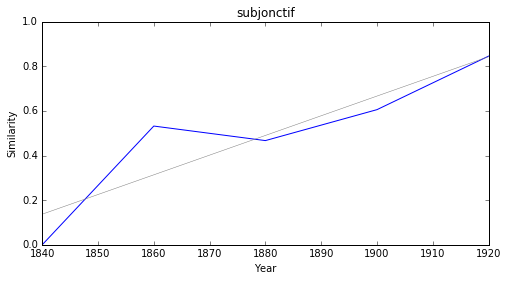

quiproquo


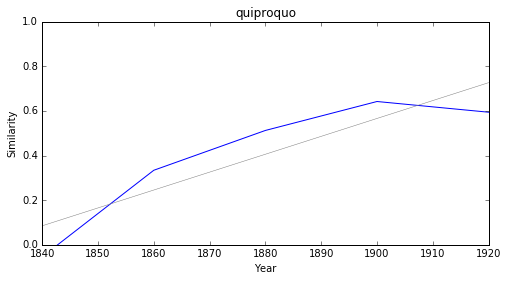

relèvement


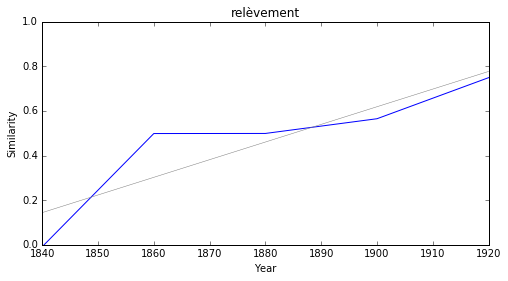

### <i><b>réalisme</i></b>

           token     slope         p
40   pragmatisme  0.012016  0.045103
23  nationalisme  0.012005  0.042729
2    coefficient  0.011750  0.021842
6     modernisme  0.011468  0.006984
3     parnassien  0.011399  0.019660
15  grouillement  0.010811  0.008160
37     sortilège  0.010791  0.026986
64   psychologue  0.010769  0.002018
55  constructeur  0.010471  0.013493
25  mémorialiste  0.010468  0.048570



pragmatisme


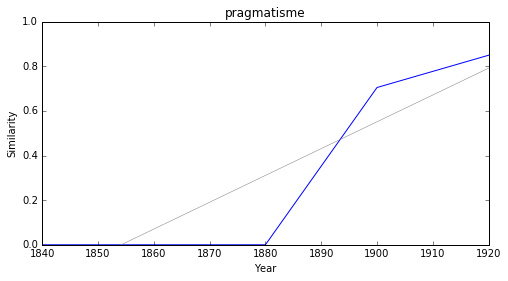

nationalisme


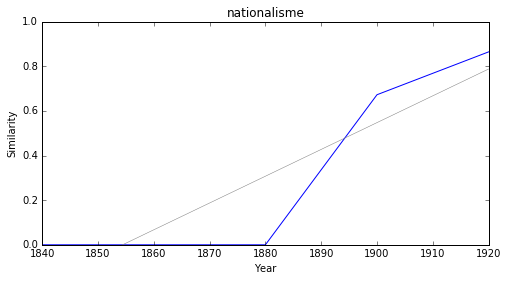

coefficient


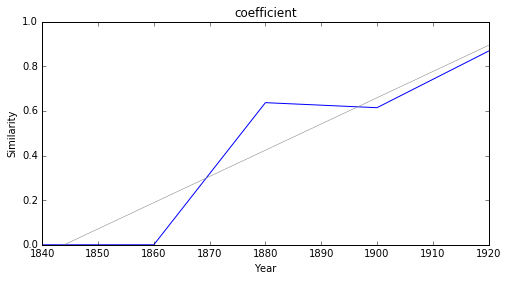

modernisme


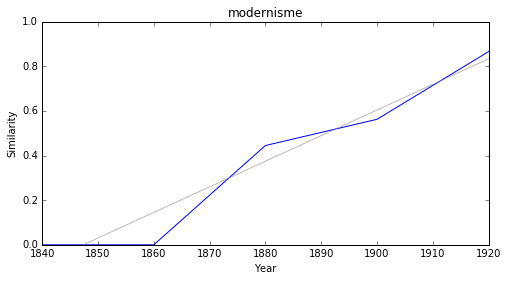

parnassien


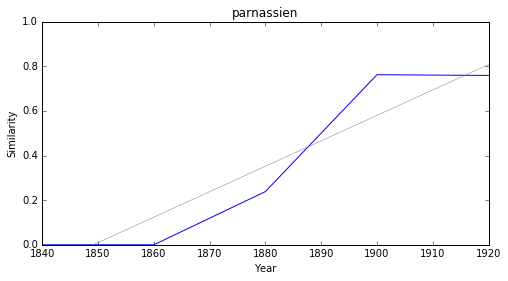

grouillement


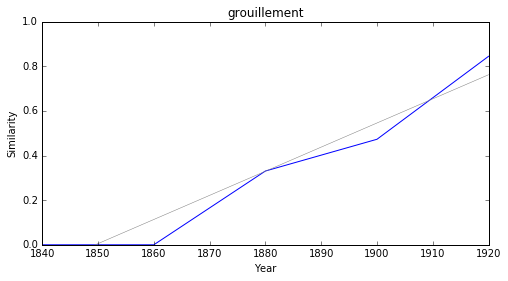

sortilège


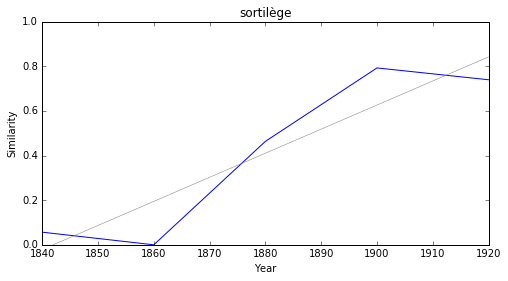

psychologue


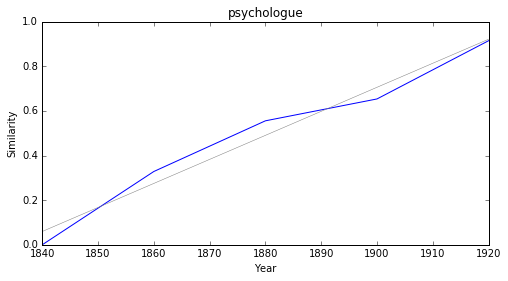

constructeur


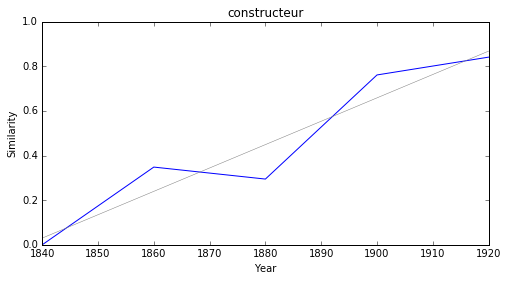

mémorialiste


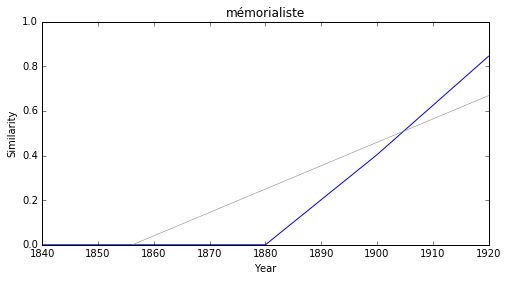

### <i><b>symbolisme</i></b>

             token     slope         p
13    nationalisme  0.011936  0.041590
29     pragmatisme  0.011173  0.040714
24       pacifisme  0.011117  0.040560
4       modernisme  0.010917  0.038331
25     sociétariat  0.010740  0.025215
8    transformisme  0.009844  0.048830
41       nihilisme  0.009513  0.044905
0          renégat  0.009333  0.046221
40      subjonctif  0.009080  0.040885
7   fonctionnement  0.009008  0.045082



nationalisme


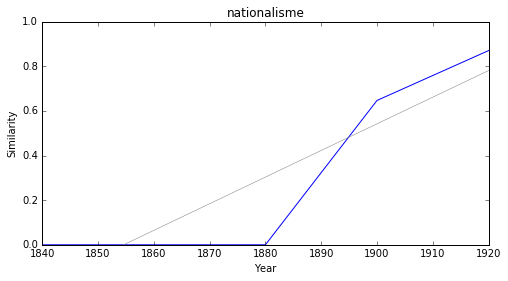

pragmatisme


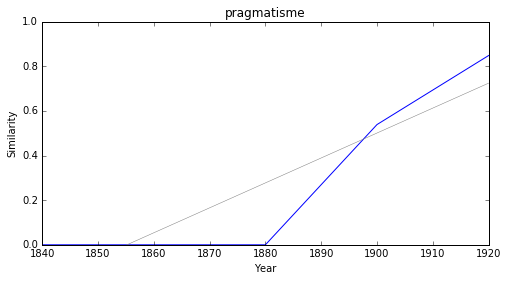

pacifisme


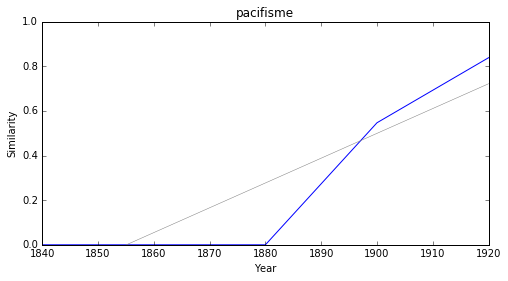

modernisme


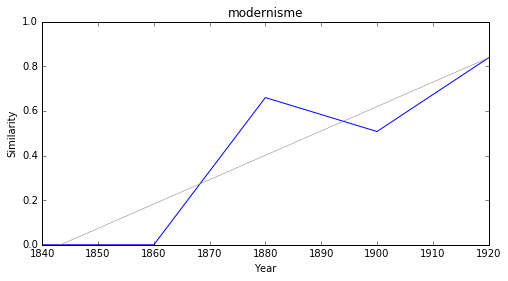

sociétariat


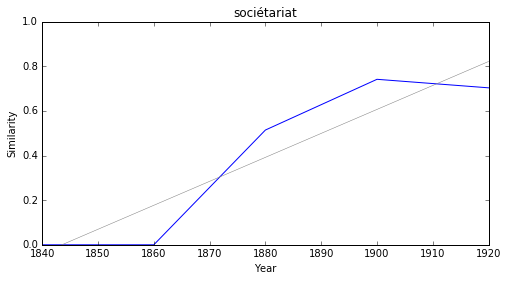

transformisme


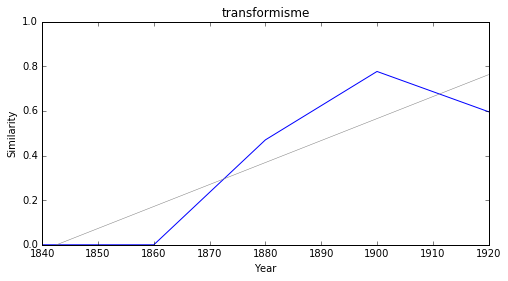

nihilisme


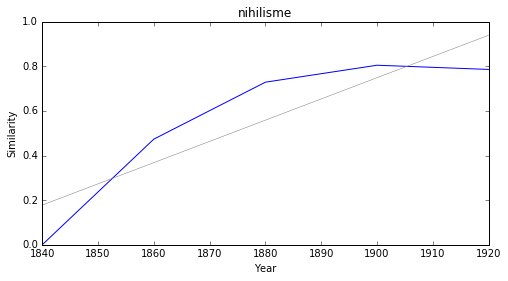

renégat


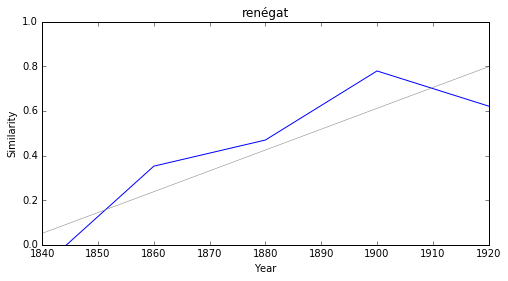

subjonctif


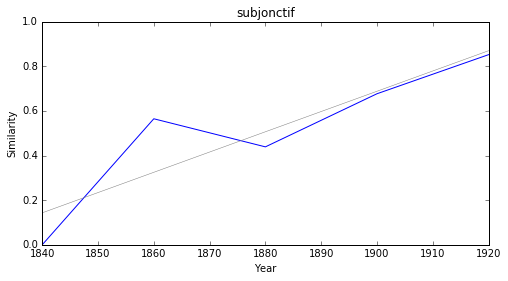

fonctionnement


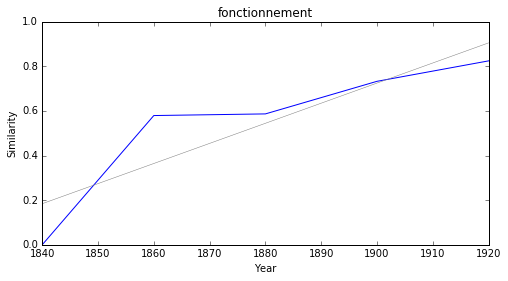

### <i><b>naturalisme</i></b>

               token     slope         p
25          thomisme  0.012396  0.048155
1    traditionalisme  0.012305  0.047294
47      nationalisme  0.011878  0.041496
24        modernisme  0.011453  0.020174
92       pragmatisme  0.011257  0.042560
65         pacifisme  0.011185  0.042190
79         sortilège  0.010278  0.038050
124        nihilisme  0.010181  0.010569
44      déséquilibre  0.010129  0.033959
141        féminisme  0.010015  0.029206



thomisme


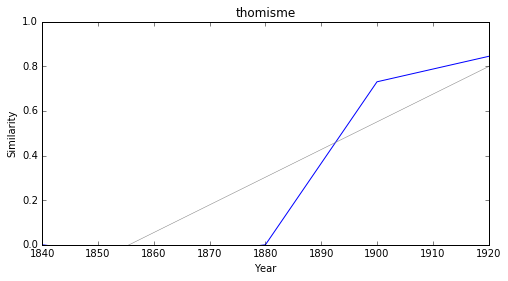

traditionalisme


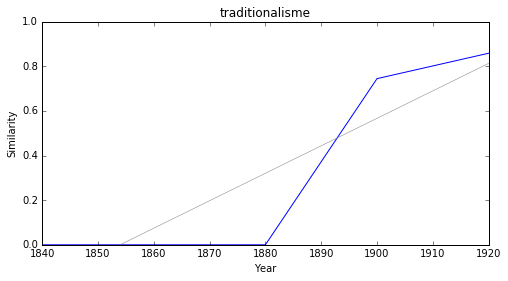

nationalisme


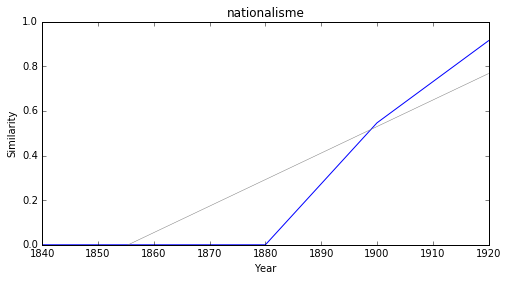

modernisme


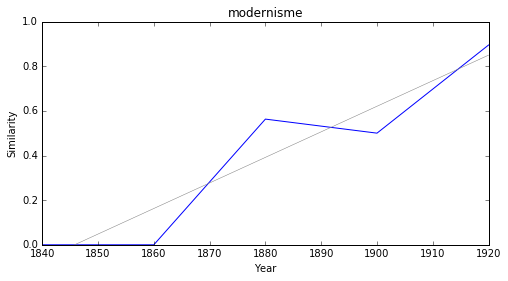

pragmatisme


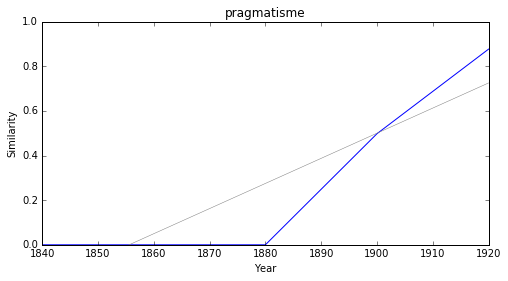

pacifisme


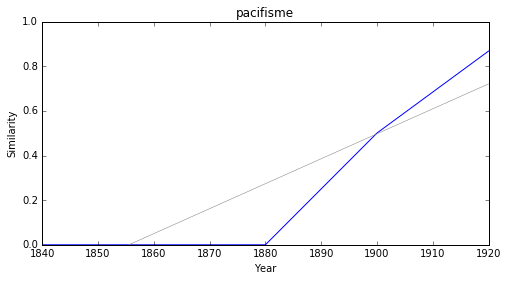

sortilège


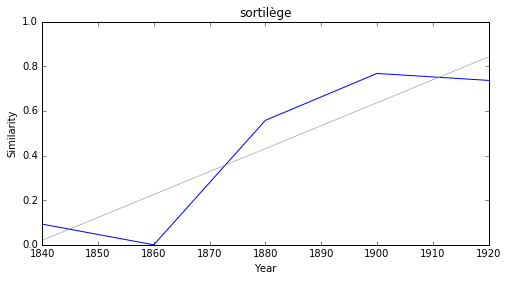

nihilisme


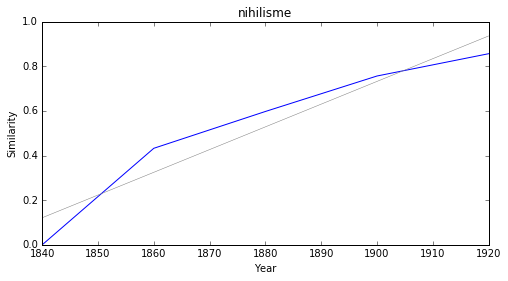

déséquilibre


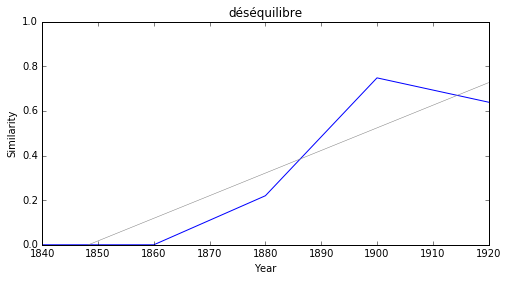

féminisme


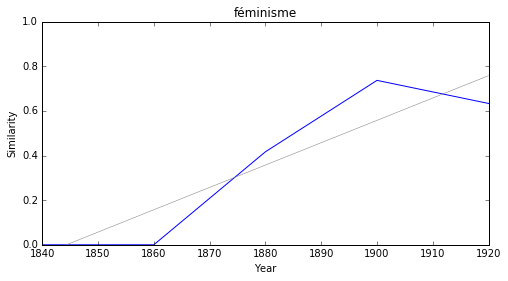

In [10]:
import pandas as pd
from IPython.display import Markdown, display
pd.set_option('display.max_rows', 1000)

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df1 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df1.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df1.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Decreasing

This is the same process here : we want to see which terms tend to <b>disassociate</b> themselves from "littérature" (by default, which you can change with the trained models). Then again, you have to check the p values. "transplantation", "choeur" and "philé" are not considered significant, "chaldéen" is, and "destination", "morceau", etc. are as well. The fact that those are less significant is logical : the fewer the terms, the more erratic their series tend to be.

### <i><b>littérature</i></b>

          token     slope         p
31    sanscrite -0.007694  0.047043
11    historico -0.006981  0.037476
34      satiété -0.005480  0.034510
9     fondation -0.002875  0.006485
26      langues -0.002684  0.049037
5     éloquence -0.002389  0.015717
16   perfection -0.001045  0.010321
32  philosophie  0.000399  0.030672
0         vogue  0.000870  0.004761
37    influence  0.000881  0.045302



sanscrite


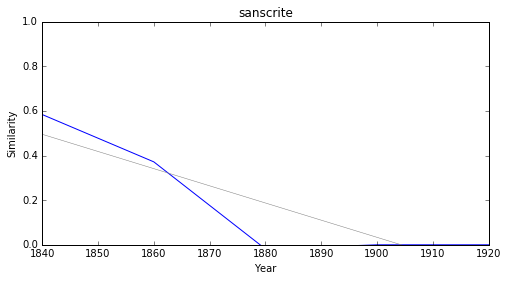

historico


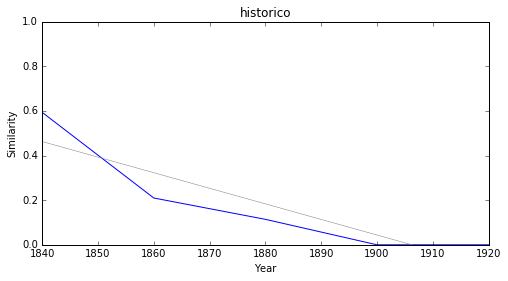

satiété


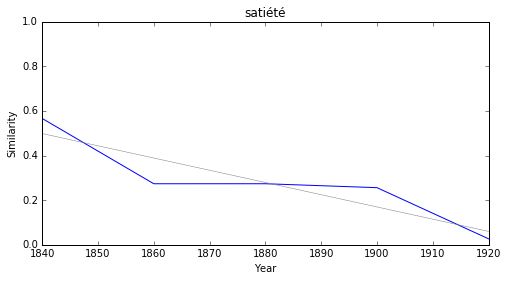

fondation


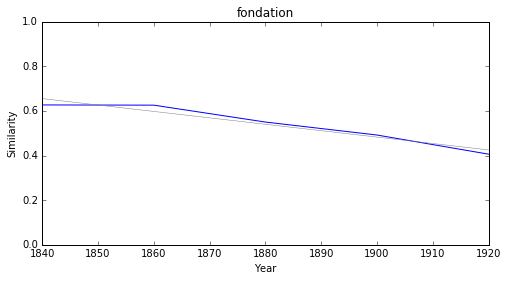

langues


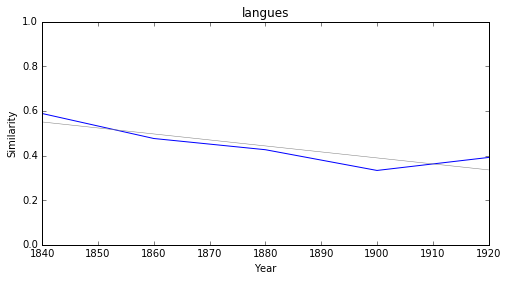

éloquence


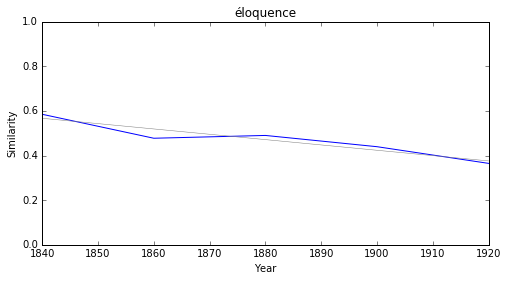

perfection


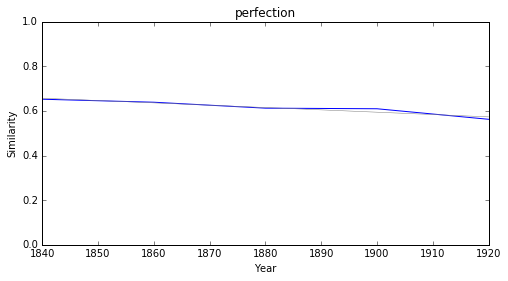

philosophie


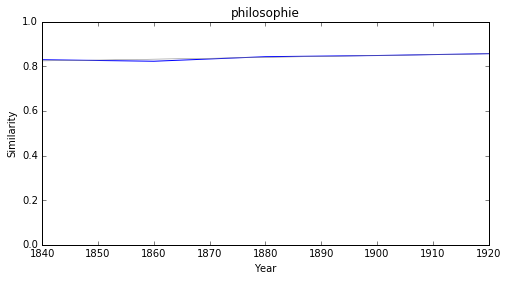

vogue


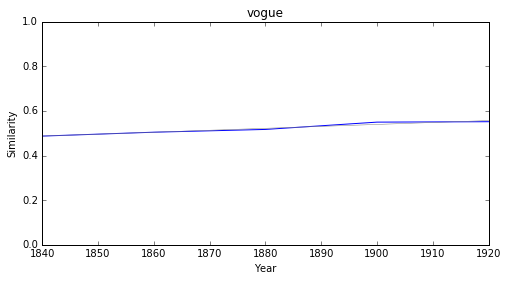

influence


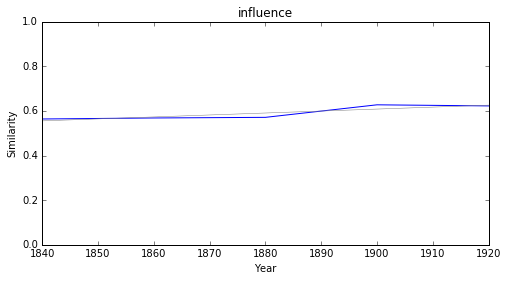

### <i><b>poésie</i></b>

         token     slope         p
9    fondation -0.002997  0.022748
3    éloquence -0.002813  0.007553
1    féodalité -0.002790  0.025391
29     chanson -0.001806  0.004454
16     réforme -0.001289  0.003972
15      langue -0.001089  0.049835
31  profondeur  0.000548  0.027924
8      logique  0.000826  0.047933
18     théorie  0.000962  0.029993
19         vie  0.001051  0.010202



fondation


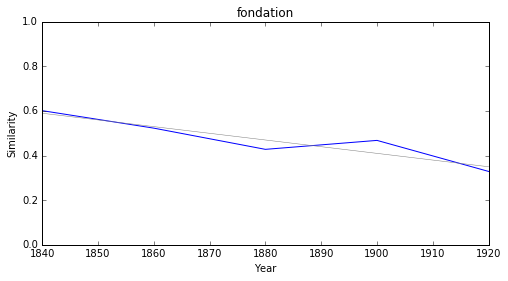

éloquence


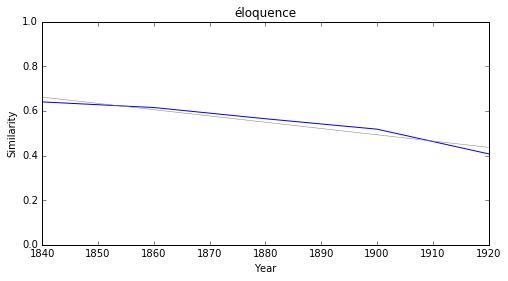

féodalité


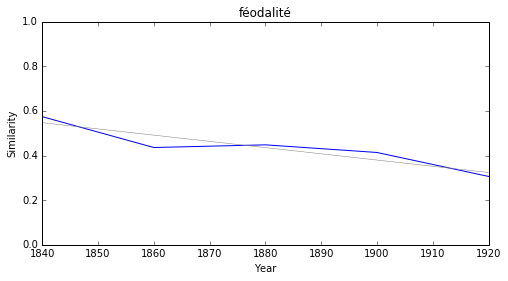

chanson


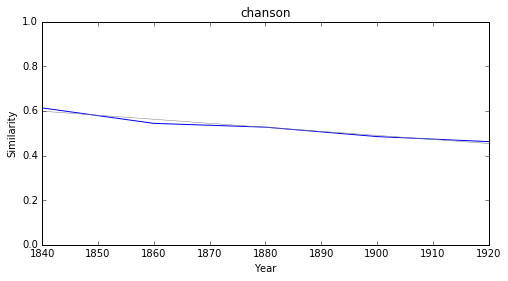

réforme


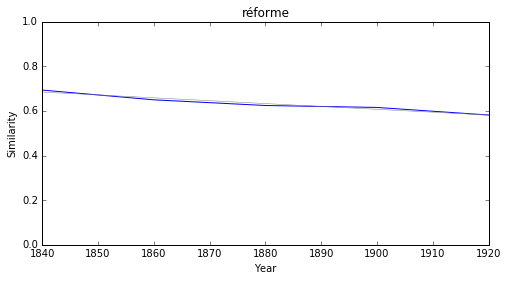

langue


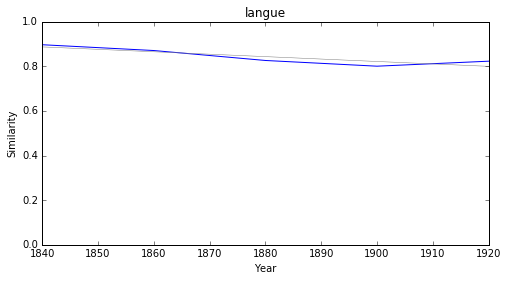

profondeur


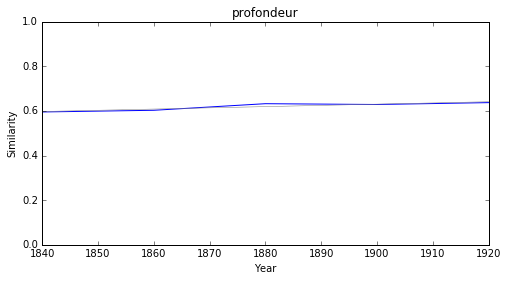

logique


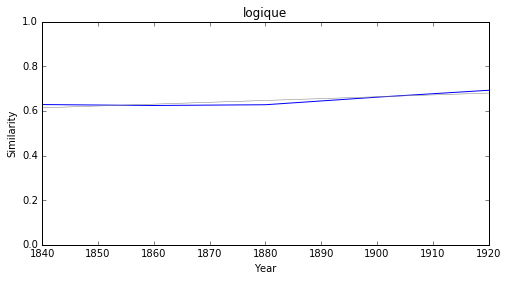

théorie


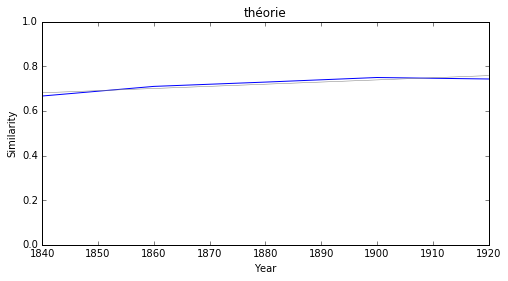

vie


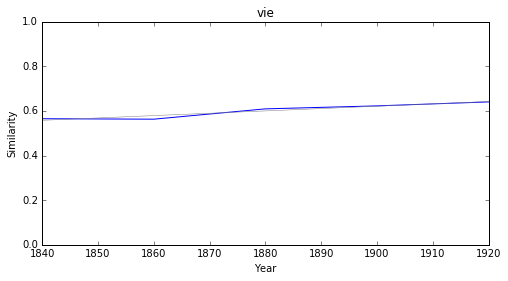

### <i><b>science</i></b>

           token     slope         p
26    galanterie -0.001155  0.014069
9       fatalité  0.000436  0.029242
19    prétention  0.000512  0.048638
11      création  0.000884  0.038008
14      doctrine  0.001362  0.020165
0      substance  0.001698  0.029607
4      sensation  0.001702  0.019472
24  scientifique  0.001876  0.007611
17    esthétique  0.002252  0.005272
22    conception  0.002494  0.000252



galanterie


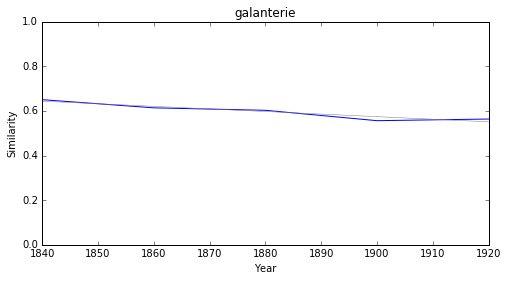

fatalité


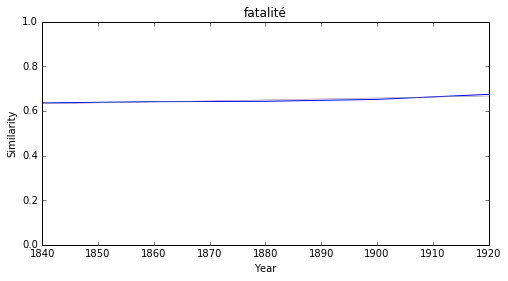

prétention


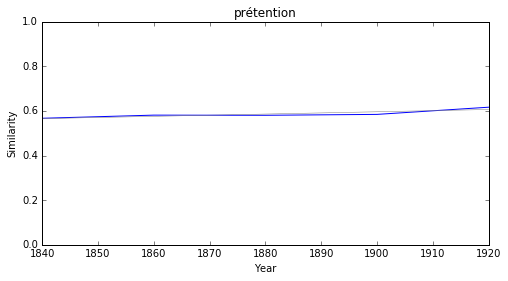

création


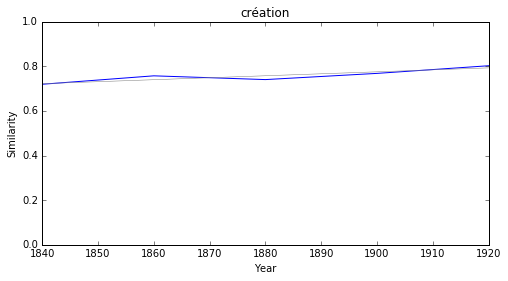

doctrine


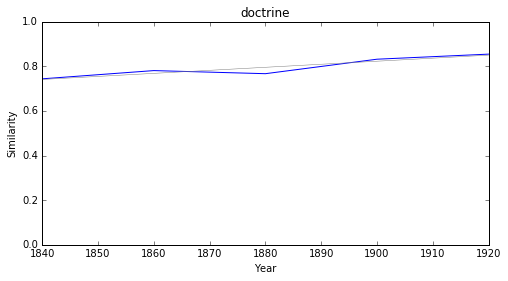

substance


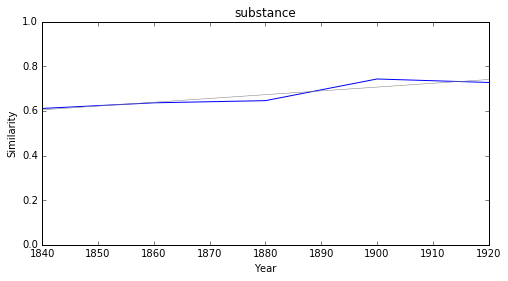

sensation


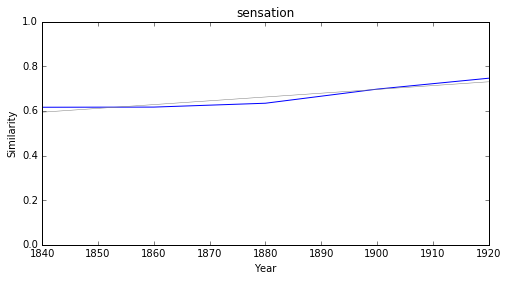

scientifique


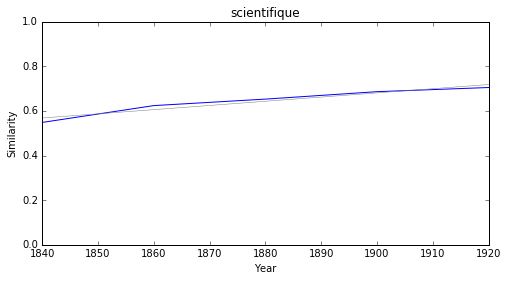

esthétique


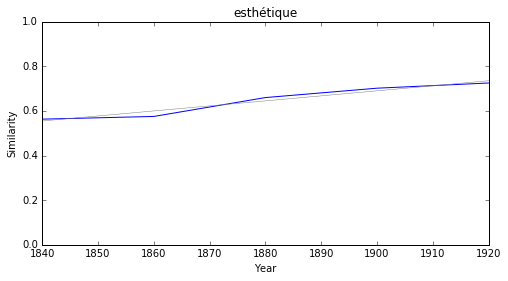

conception


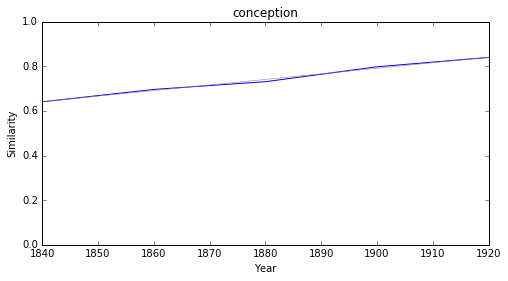

### <i><b>savoir</i></b>

           token     slope         p
5    attachement -0.004569  0.038724
3         mentir -0.003544  0.000159
1     ménagement -0.003308  0.009549
12          voir -0.002351  0.029663
4      démontrer  0.000885  0.038719
13     remarquer  0.000993  0.022142
2       signaler  0.001136  0.046401
6       rappeler  0.001346  0.007488
7   parfaitement  0.001714  0.023866
14     connaître  0.001879  0.010351



attachement


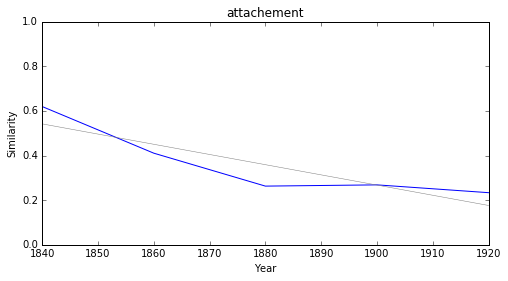

mentir


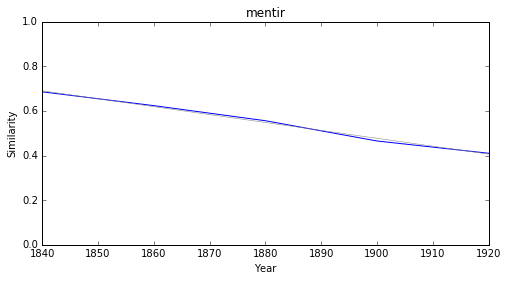

ménagement


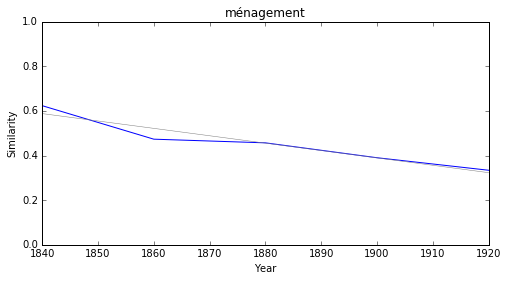

voir


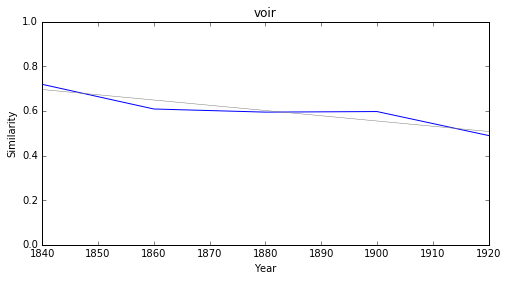

démontrer


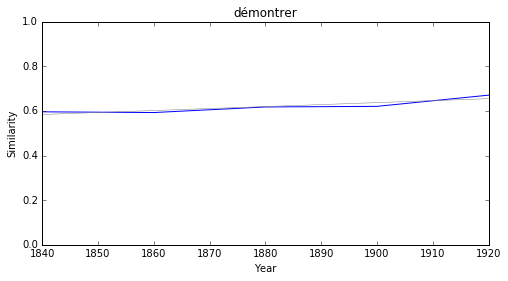

remarquer


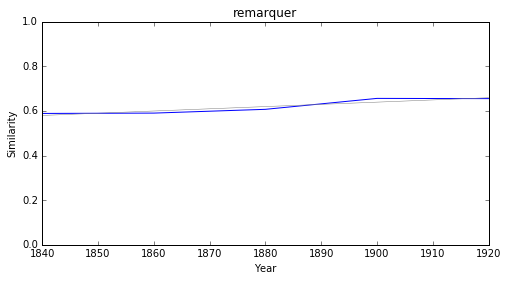

signaler


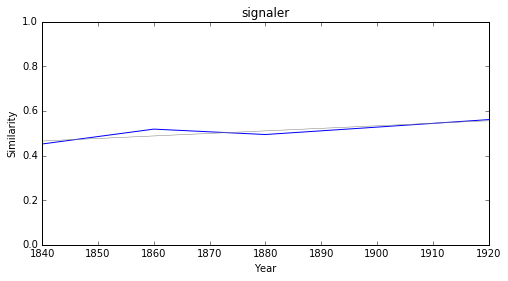

rappeler


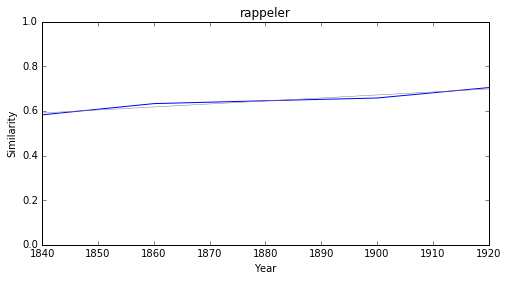

parfaitement


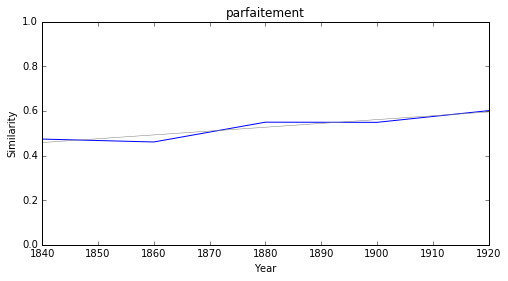

connaître


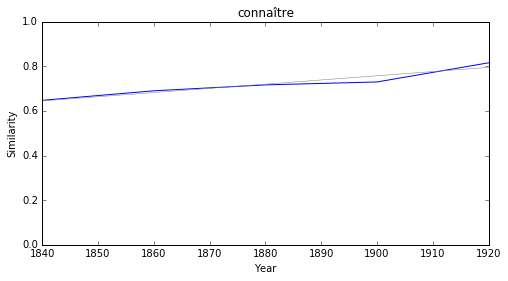

### <i><b>histoire</i></b>

          token     slope         p
6            sn -0.007286  0.024031
32    placerons -0.007197  0.006041
21        indus -0.006798  0.021847
14    historico -0.006653  0.014637
1    astrologie -0.004146  0.010706
33     original -0.002531  0.042796
35  abaissement -0.002528  0.029483
22     academie -0.002446  0.013117
41   achèvement -0.001670  0.029606
10       élégie -0.001432  0.023965



sn


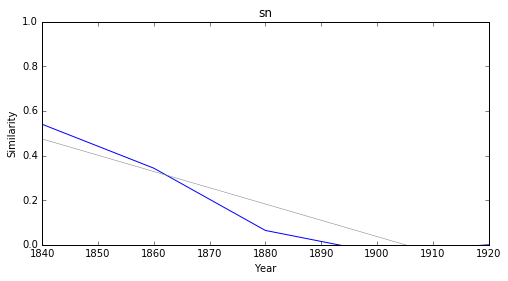

placerons


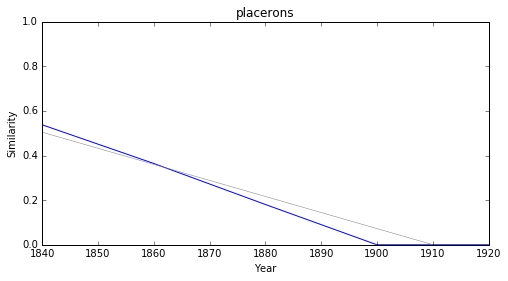

indus


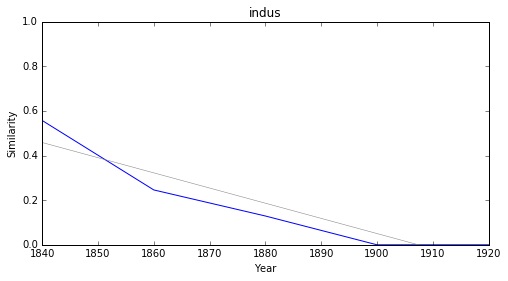

historico


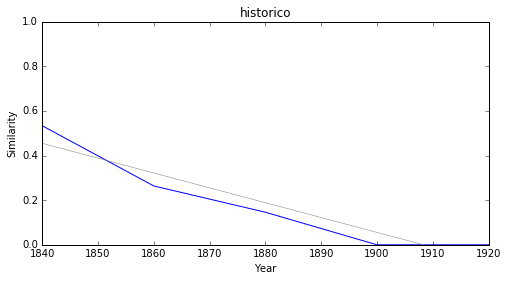

astrologie


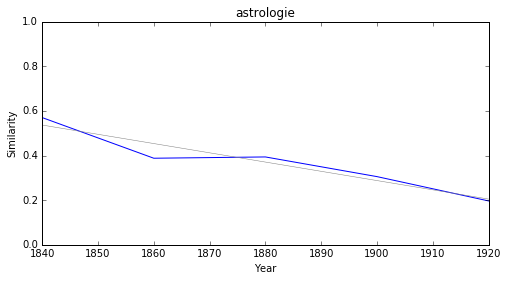

original


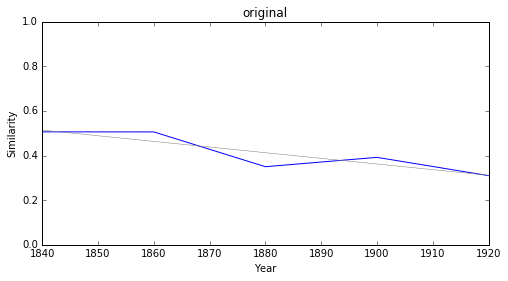

abaissement


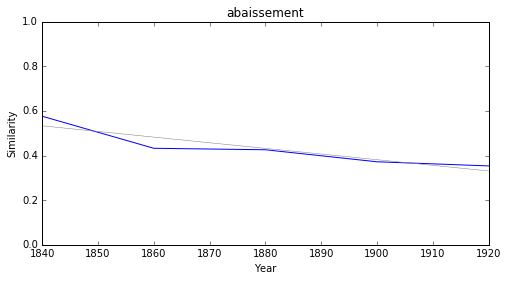

academie


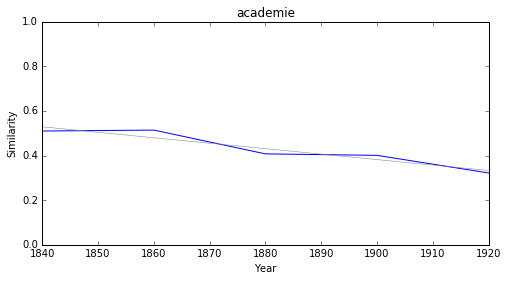

achèvement


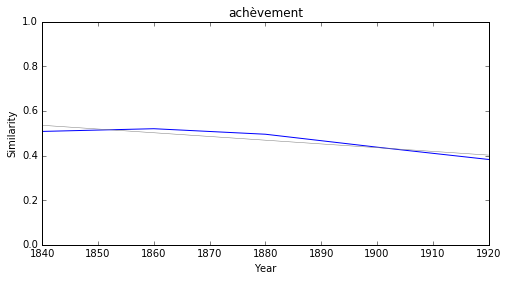

élégie


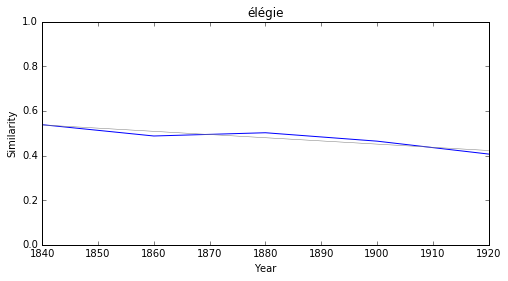

### <i><b>philosophie</i></b>

          token     slope         p
9    appropriée -0.004610  0.049694
2     éloquence -0.003474  0.029276
7     fondation -0.002343  0.022504
5         mœurs -0.001907  0.046230
13   perfection -0.001467  0.014655
10  littérature  0.000399  0.030672
24    grammaire  0.001052  0.043097
1        satire  0.001069  0.008690
21   conception  0.001454  0.018830
3   réalisation  0.001579  0.045394



appropriée


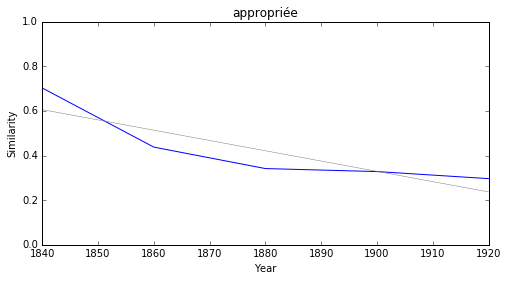

éloquence


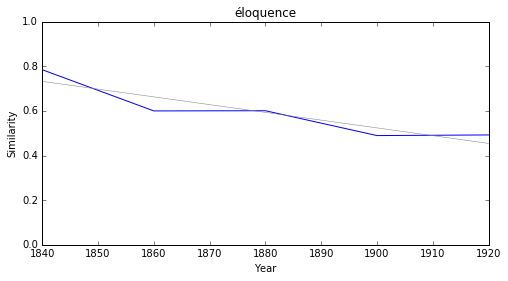

fondation


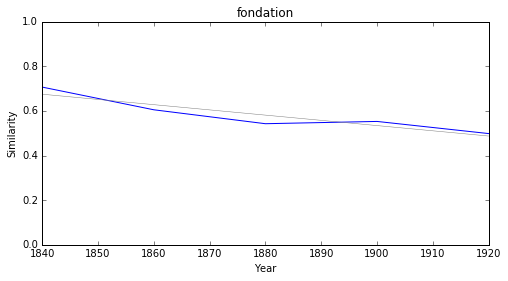

mœurs


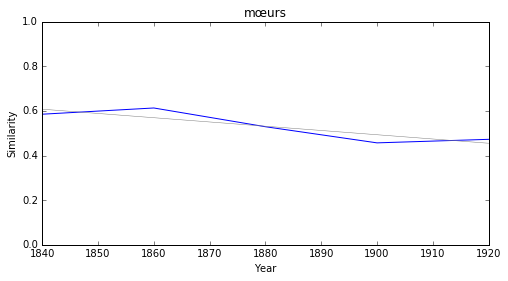

perfection


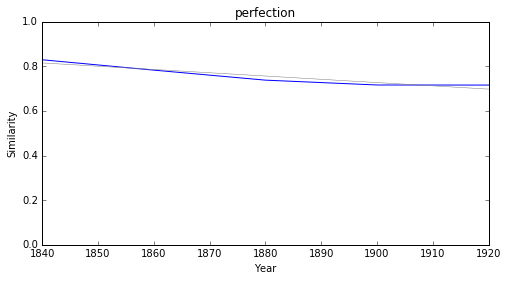

littérature


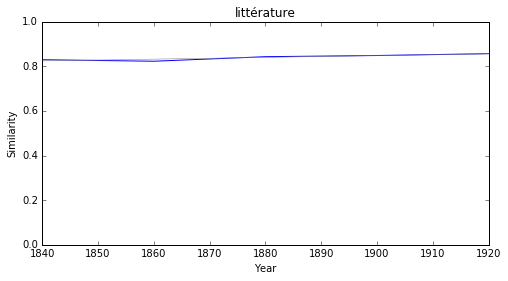

grammaire


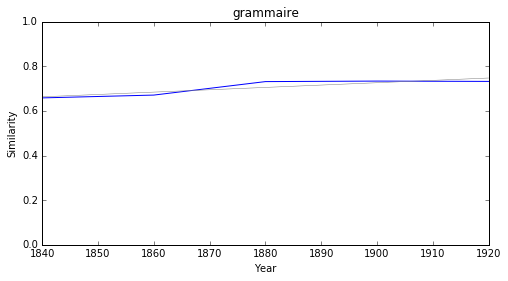

satire


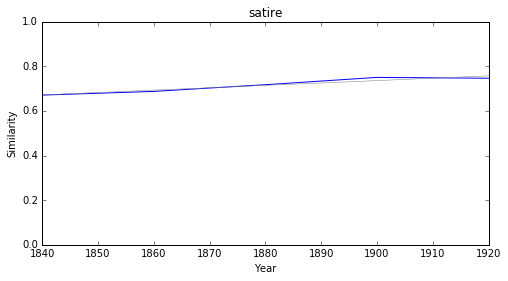

conception


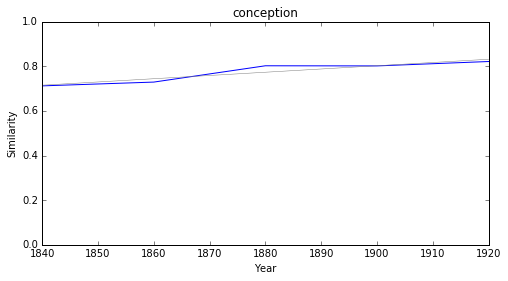

réalisation


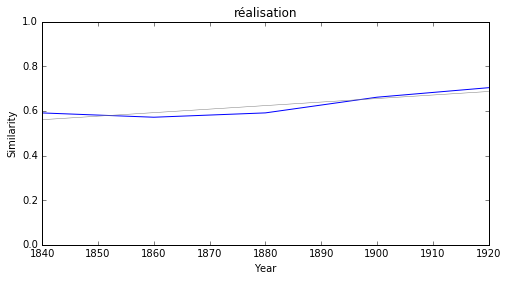

### <i><b>lettre</i></b>

          token     slope         p
10     argental -0.008342  0.022335
7    mickiewicz -0.007826  0.018540
5        luynes -0.007572  0.006580
26  procuration -0.007457  0.010132
17      grignan -0.004665  0.014998
36        nière -0.003416  0.027301
30       victor -0.003277  0.048118
32        scène -0.003036  0.035950
19    promotion -0.003015  0.035897
21        sablé -0.002940  0.022537



argental


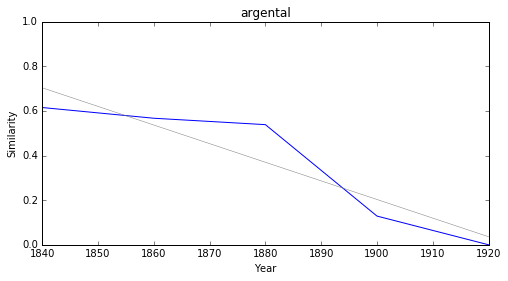

mickiewicz


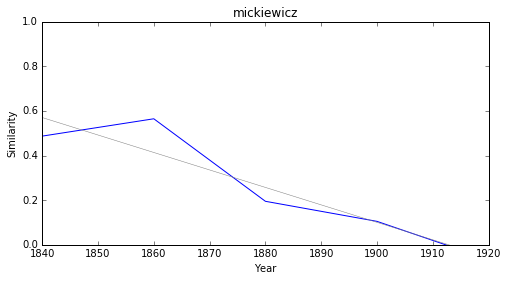

luynes


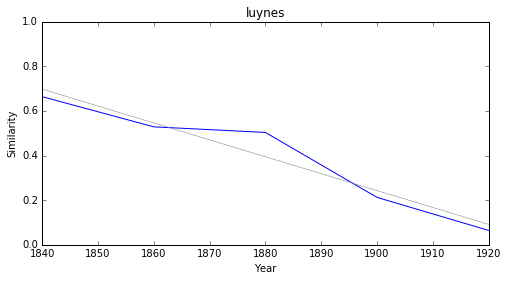

procuration


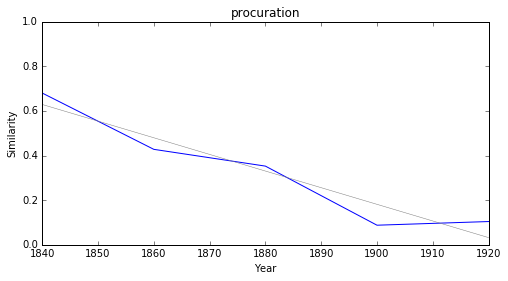

grignan


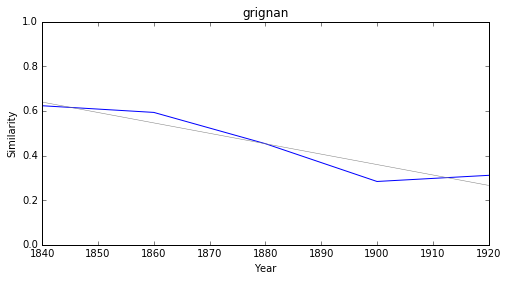

nière


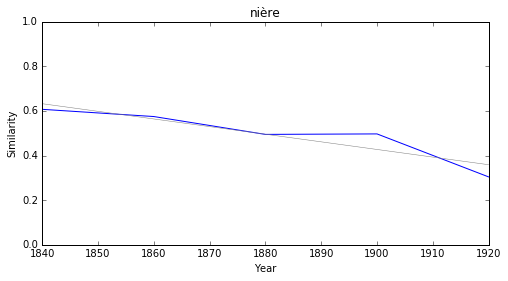

victor


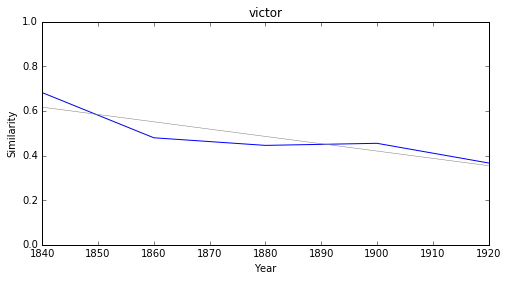

scène


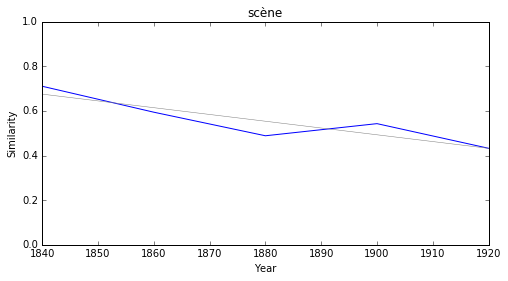

promotion


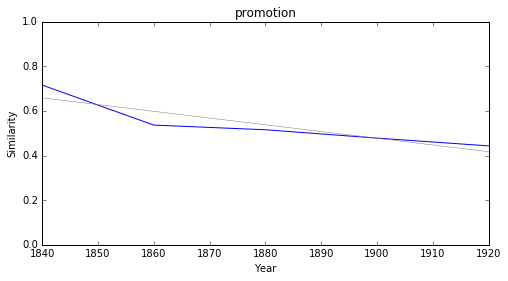

sablé


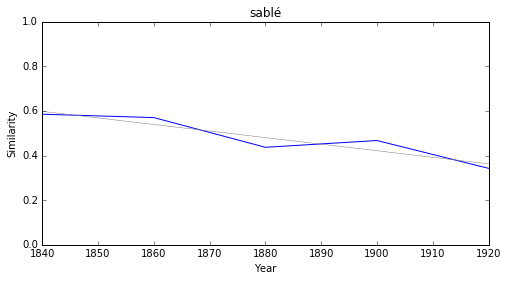

### <i><b>critique</i></b>

           token     slope         p
0     efficacité -0.003629  0.023371
9       sobriété -0.003547  0.029374
11        mérite -0.002626  0.001216
28       fiction -0.002374  0.023838
8      situation -0.002165  0.002838
15       bruyère -0.002143  0.008799
24        succès -0.001831  0.041369
20    discussion -0.001797  0.021269
22  circonstance -0.001767  0.046500
25         tâche -0.001658  0.022336



efficacité


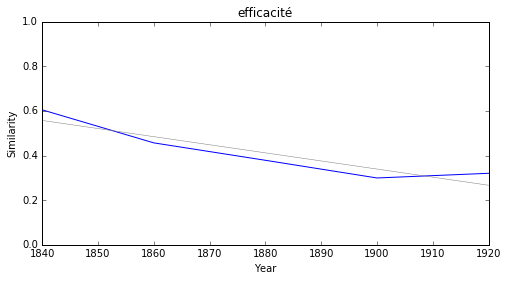

sobriété


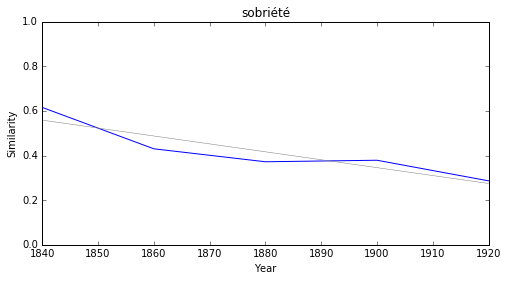

mérite


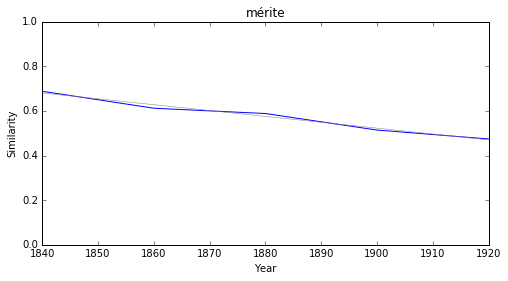

fiction


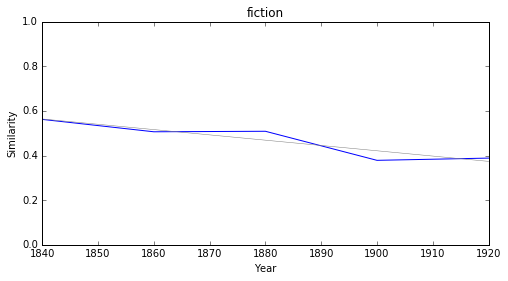

situation


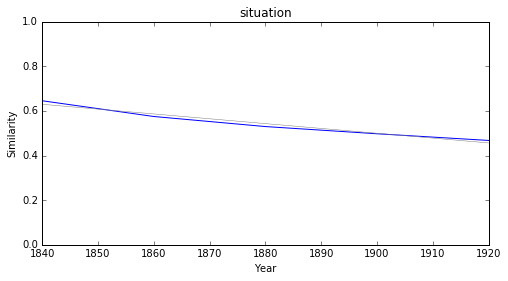

bruyère


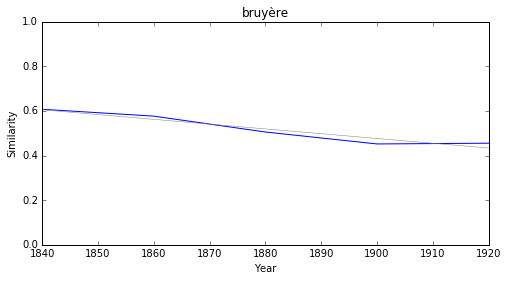

succès


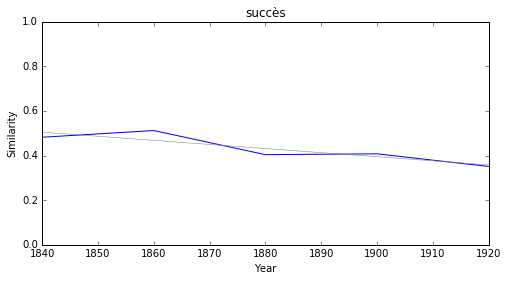

discussion


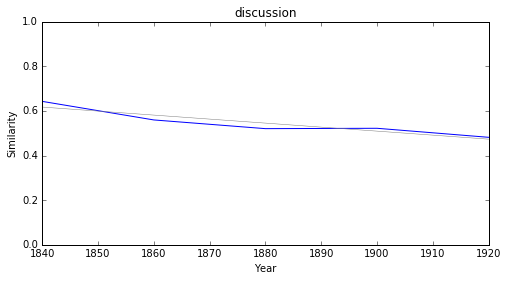

circonstance


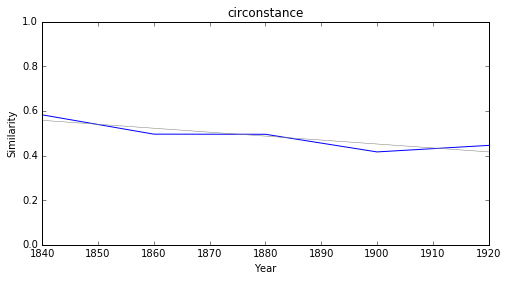

tâche


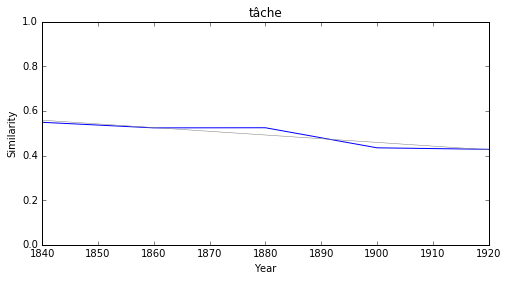

### <i><b>roman</i></b>

         token     slope         p
13       siége -0.008835  0.021894
28       titon -0.008705  0.045327
19    sanscrit -0.008248  0.011666
30      manant -0.008150  0.031749
21        nerf -0.006123  0.006929
0       ciseau -0.004600  0.045779
9      chantre -0.003659  0.030184
1   traducteur -0.003458  0.005768
14     recueil -0.002447  0.035884
7   feuilleton -0.000750  0.044895



siége


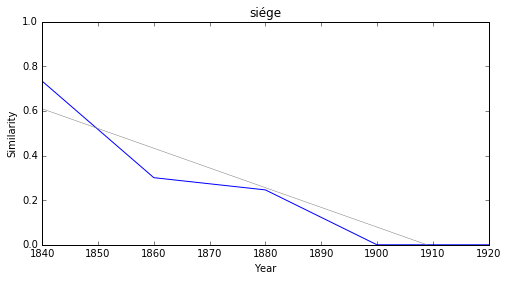

titon


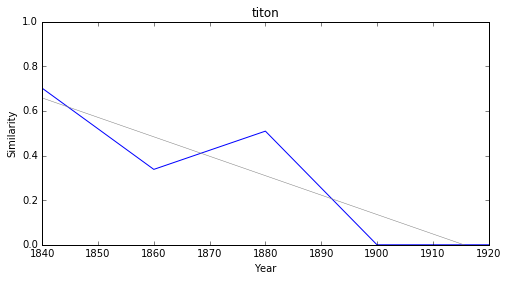

sanscrit


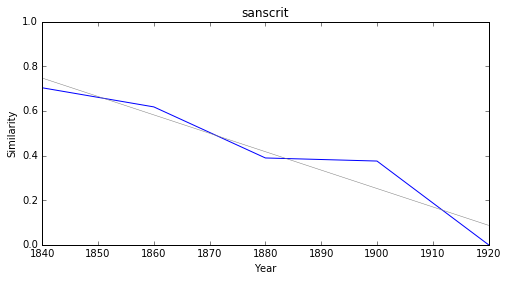

manant


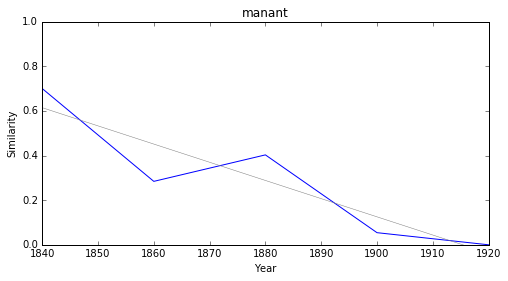

nerf


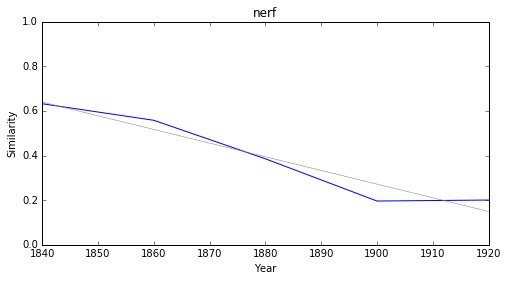

ciseau


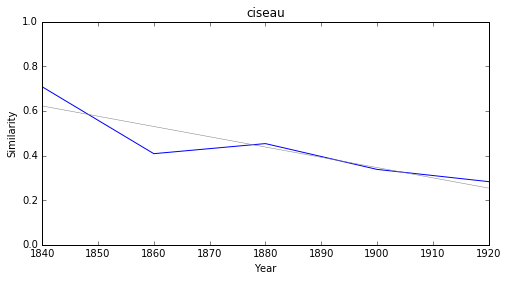

chantre


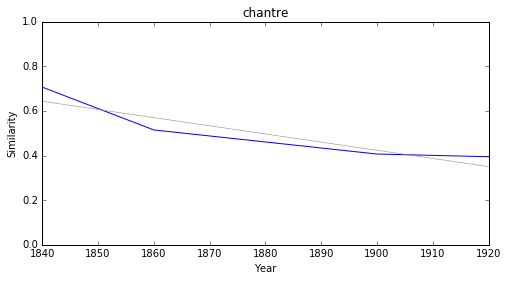

traducteur


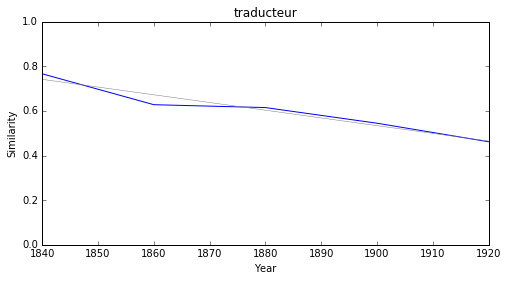

recueil


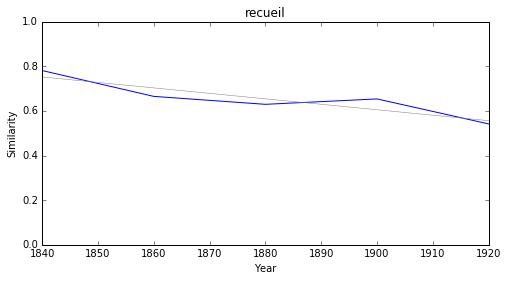

feuilleton


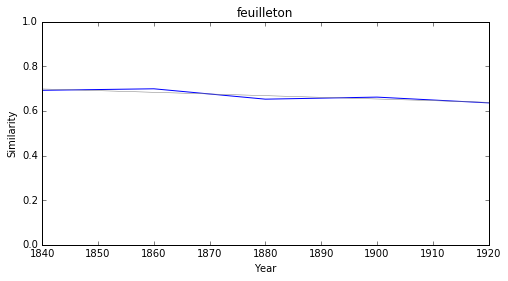

### <i><b>théâtre</i></b>

         token     slope         p
26     collége -0.010591  0.010271
25     épernon -0.009540  0.017229
17       siége -0.009413  0.005698
3       cassin -0.009190  0.005192
21    sanscrit -0.007461  0.009315
13        doge -0.006707  0.029670
19  machiniste -0.005381  0.017228
34   dénoûment -0.002871  0.010485
10   continent -0.002721  0.033021
33     procédé -0.001319  0.026754



collége


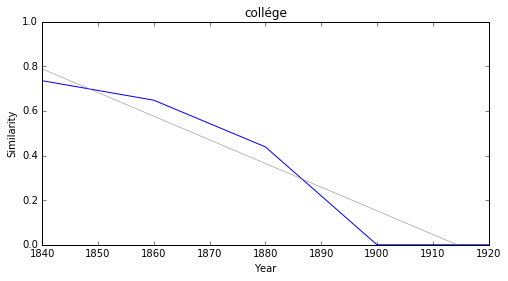

épernon


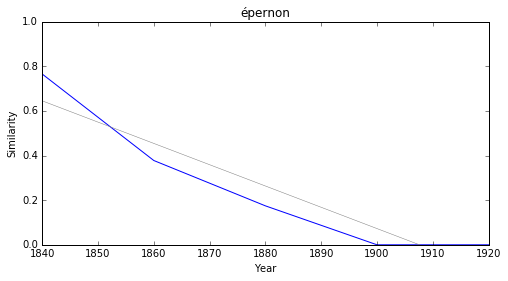

siége


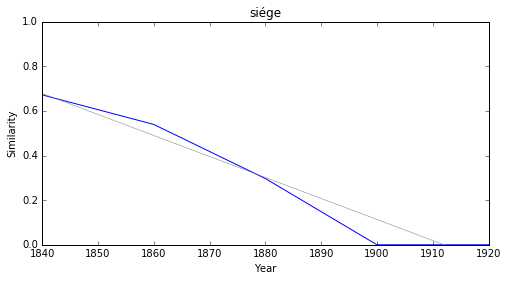

cassin


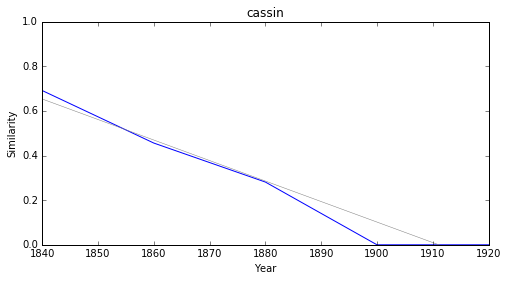

sanscrit


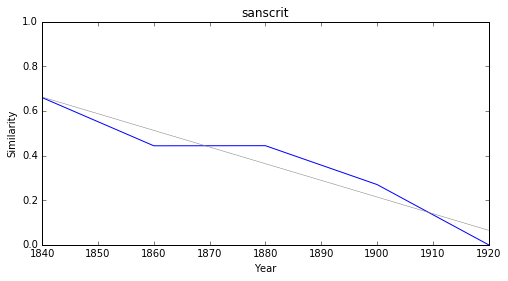

doge


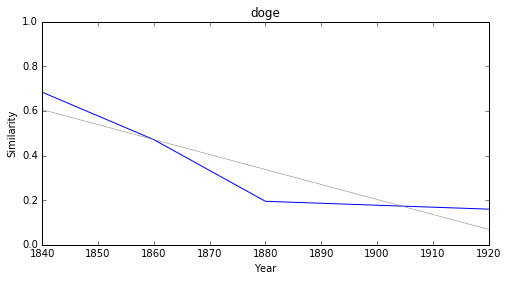

machiniste


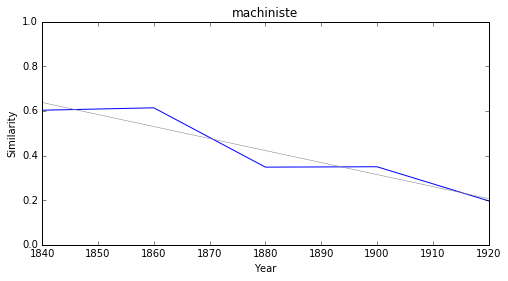

dénoûment


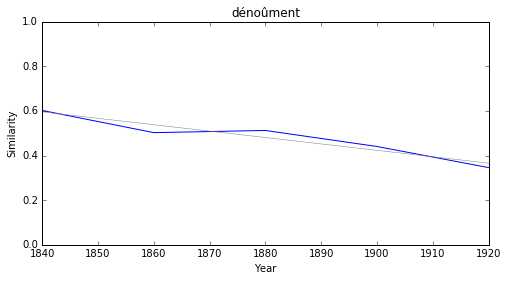

continent


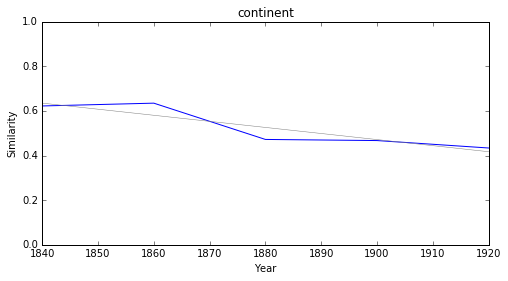

procédé


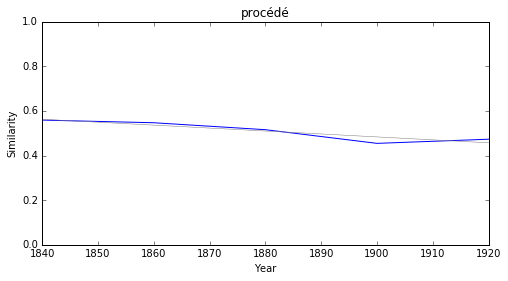

### <i><b>drame</i></b>

         token     slope         p
5         lied -0.009484  0.049625
27      manant -0.009047  0.033844
15    sanscrit -0.008948  0.005644
6         tube -0.008722  0.011720
16        nerf -0.007154  0.000540
19     rhythme -0.004629  0.029054
9    coloriste -0.004565  0.027580
26    celtique -0.004563  0.024563
1   traducteur -0.004251  0.011396
24   dénoûment -0.002323  0.015324



lied


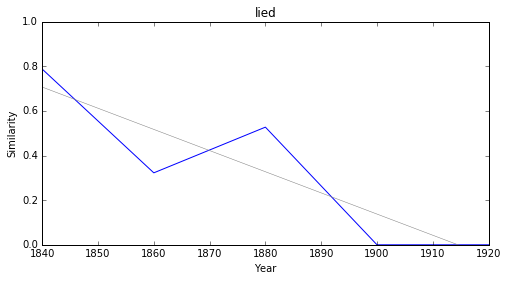

manant


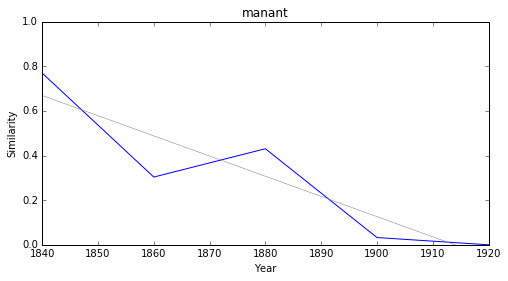

sanscrit


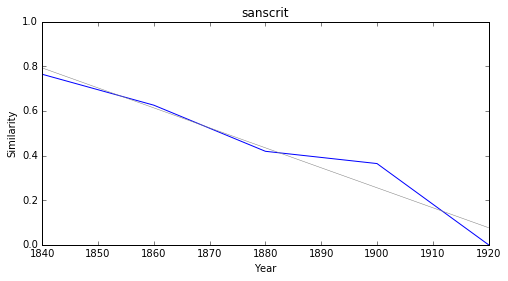

tube


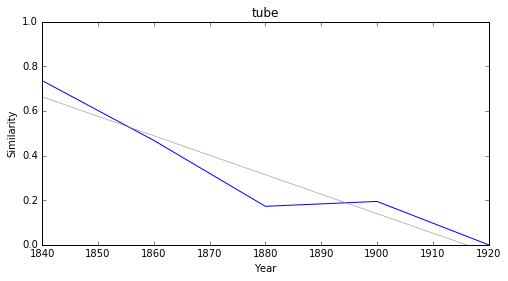

nerf


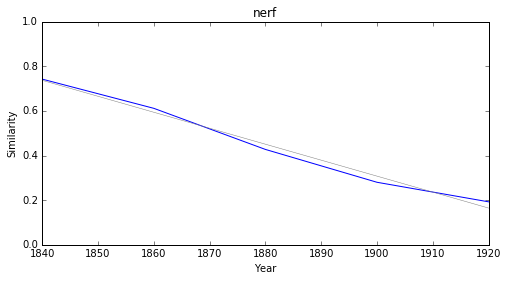

rhythme


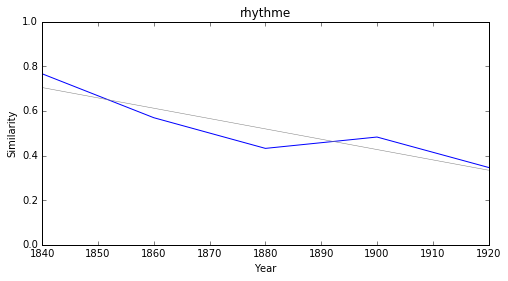

coloriste


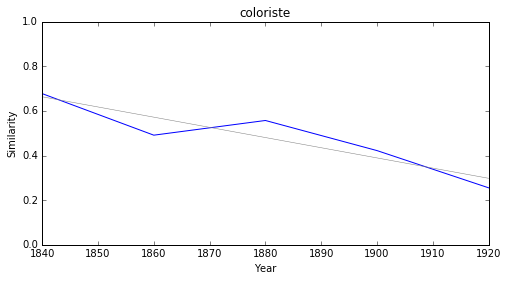

celtique


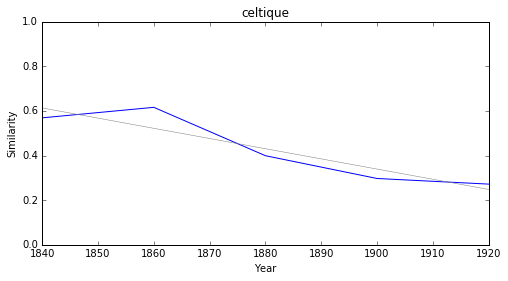

traducteur


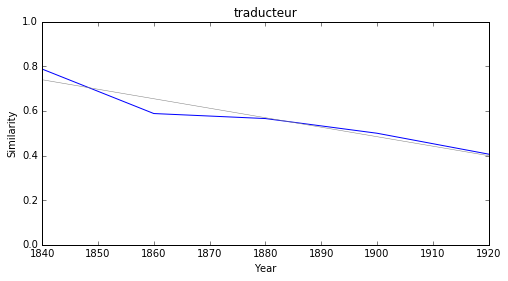

dénoûment


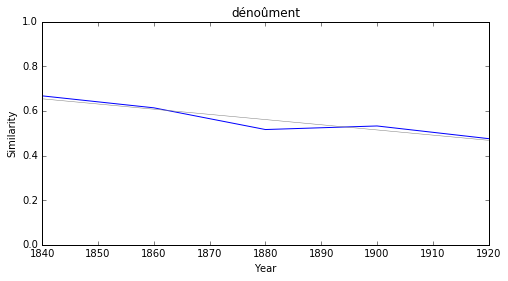

### <i><b>esprit</i></b>

           token     slope         p
44   épicuréisme -0.007174  0.007711
24       apanage -0.004314  0.021296
28     abondance -0.003486  0.002885
29        estime -0.002585  0.043190
21        axiome -0.002407  0.015972
4      éloquence -0.002227  0.046692
8   entraînement -0.001996  0.003548
1       habileté -0.001840  0.003514
23   emportement -0.001219  0.021060
10   patriotisme -0.001109  0.048200



épicuréisme


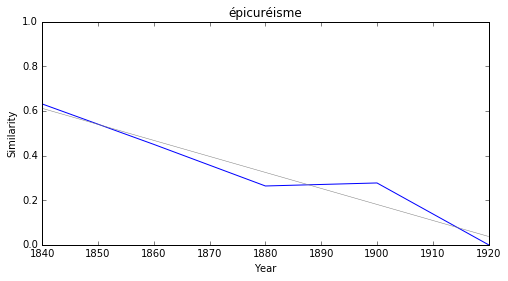

apanage


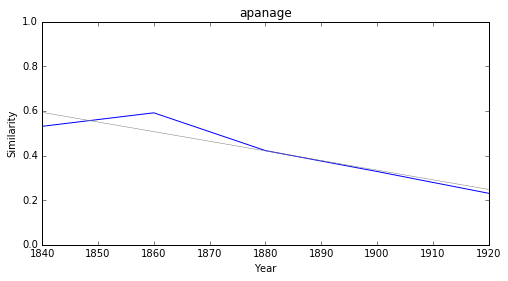

abondance


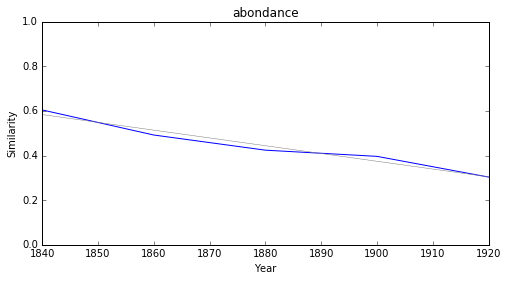

estime


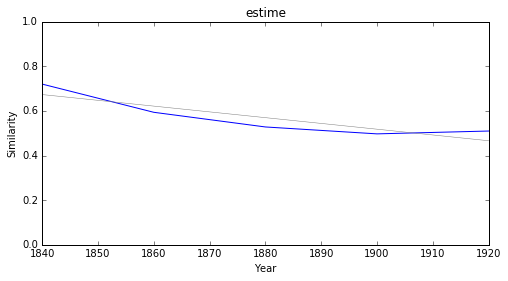

axiome


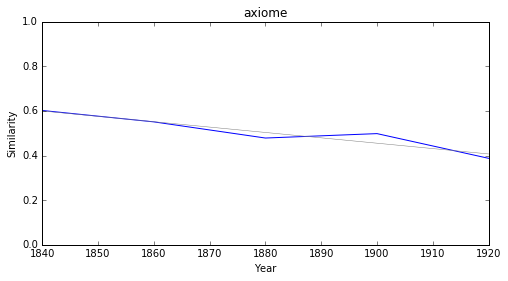

éloquence


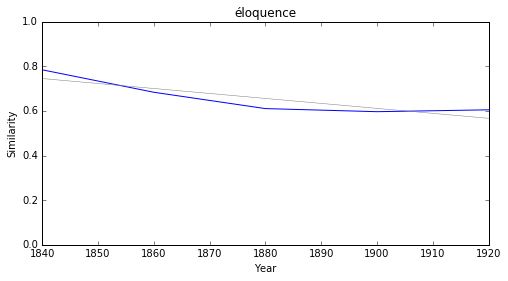

entraînement


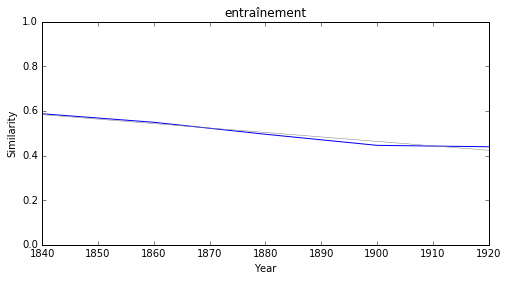

habileté


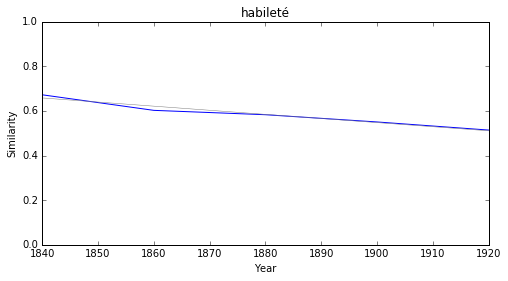

emportement


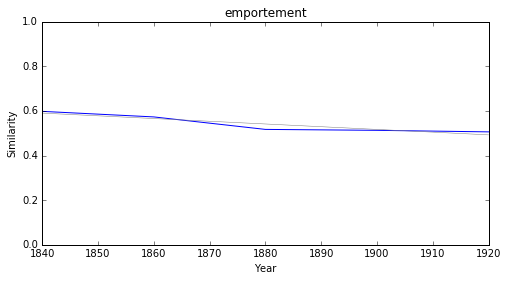

patriotisme


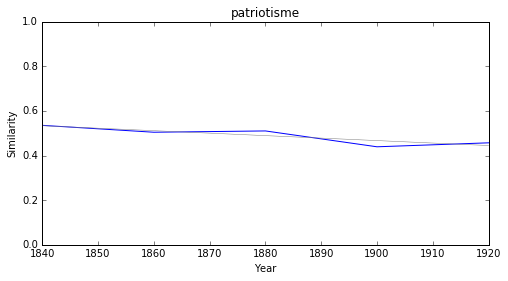

### <i><b>langue</i></b>

          token     slope         p
4   relâchement -0.006483  0.017256
12       tourbe -0.005383  0.017770
2     éloquence -0.004066  0.002585
9     fondation -0.002956  0.004706
30      gravité -0.002700  0.003314
6     érudition -0.002627  0.011065
5        source -0.002386  0.006650
32  physionomie -0.002233  0.043933
14   perfection -0.002217  0.024249
1    expression -0.002029  0.045731



relâchement


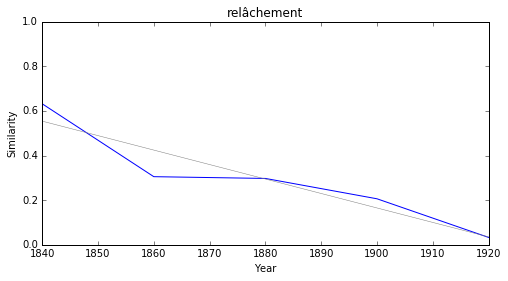

tourbe


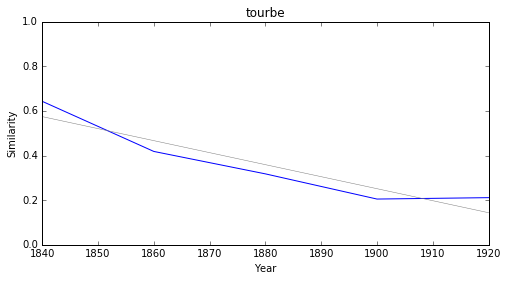

éloquence


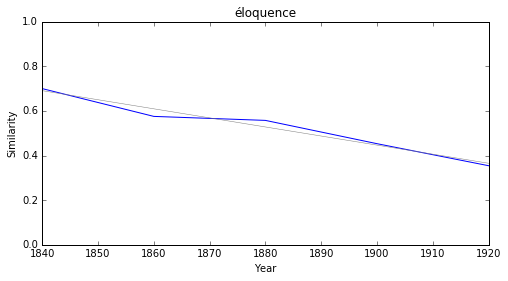

fondation


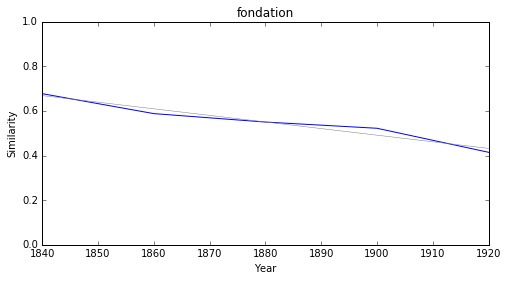

gravité


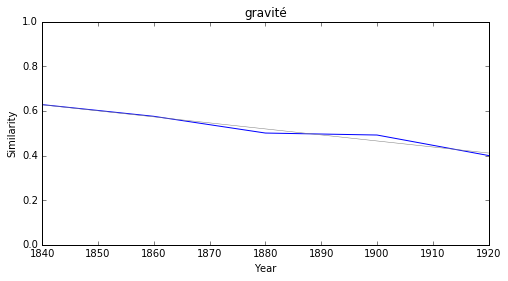

érudition


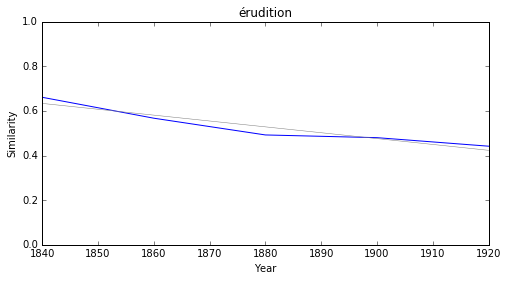

source


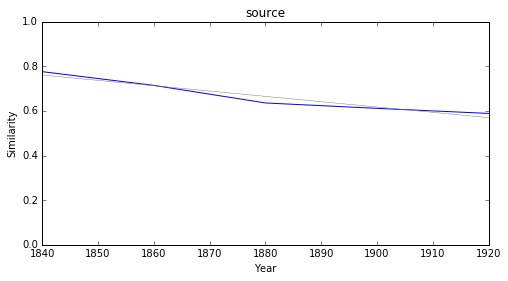

physionomie


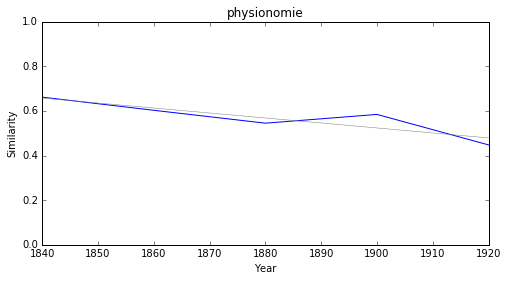

perfection


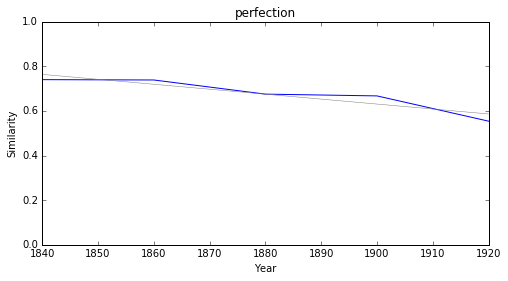

expression


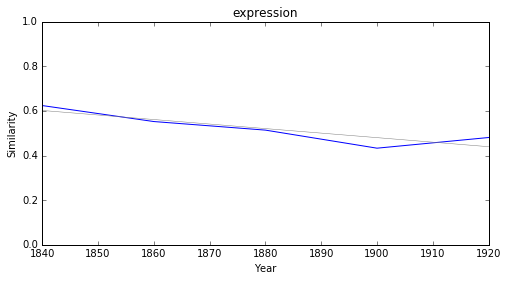

### <i><b>diplomatie</i></b>

        token     slope         p
5      glande -0.011139  0.023178
11     rabais -0.010886  0.043367
7      cavité -0.010804  0.006400
3         zan -0.010704  0.049746
9      salive -0.009029  0.034231
17      rohan -0.008145  0.036139
16  psalmodie -0.007681  0.030132
20  condillac -0.004654  0.042203
6     stature -0.002990  0.019196
19   tactique -0.002850  0.026037



glande


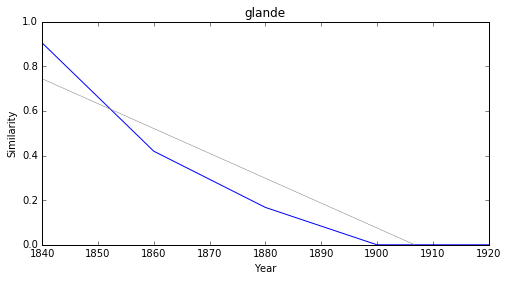

rabais


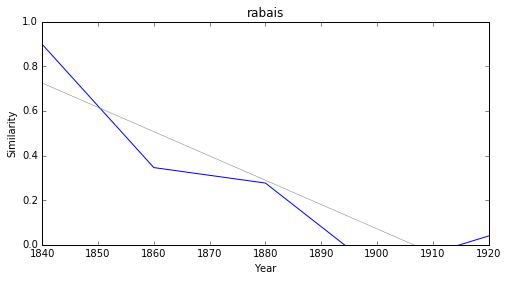

cavité


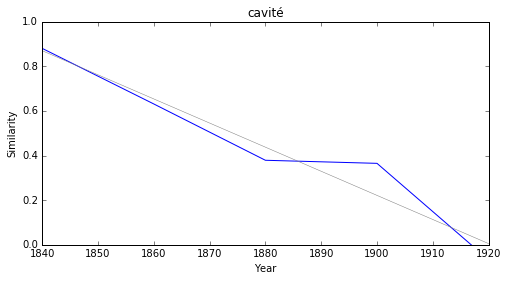

zan


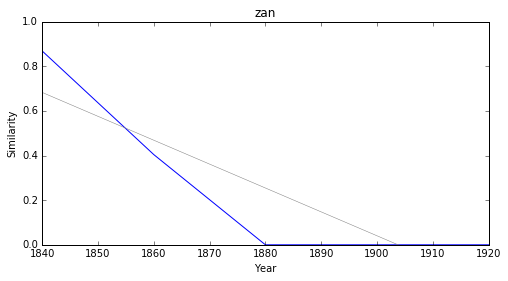

salive


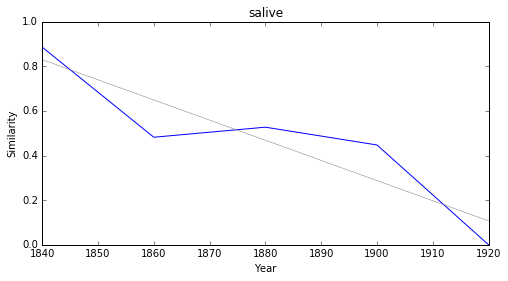

rohan


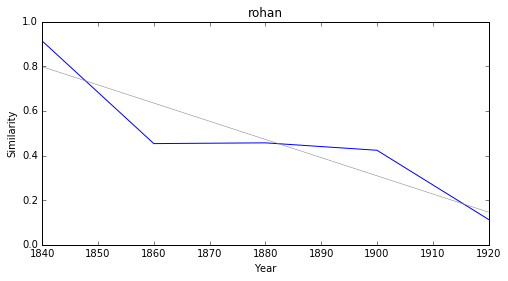

psalmodie


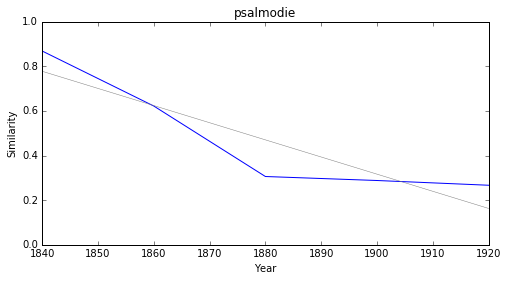

condillac


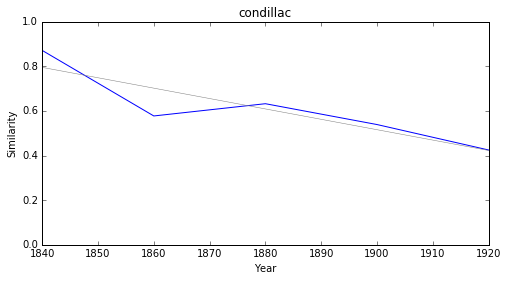

stature


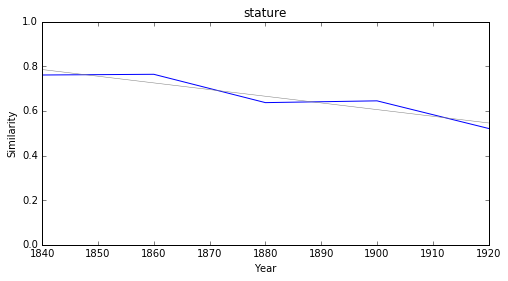

tactique


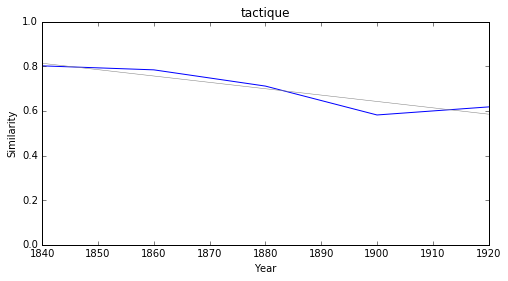

### <i><b>politique</i></b>

           token     slope         p
19      élective -0.007002  0.016166
8       outragée -0.006119  0.046677
0      éloquence -0.003073  0.020250
3      fondation -0.002840  0.001278
29       surtout -0.002651  0.006839
9        système -0.002269  0.028334
25  gouvernement -0.002051  0.010773
30  aristocratie -0.001429  0.026900
22       progrès -0.001186  0.008928
26       qualité  0.001292  0.026292



élective


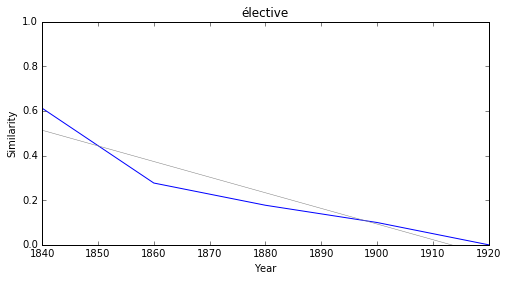

outragée


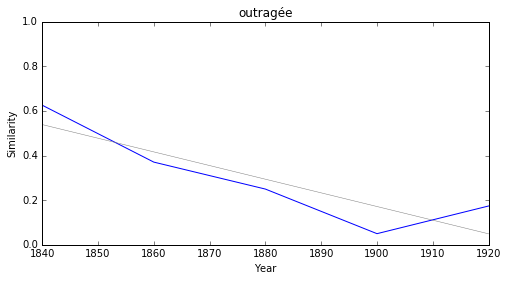

éloquence


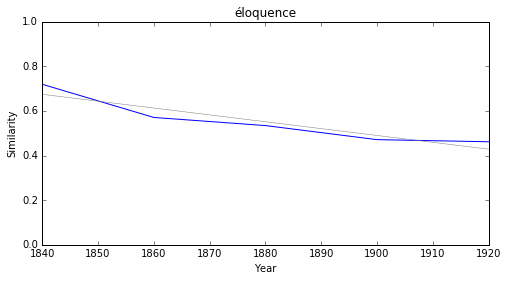

fondation


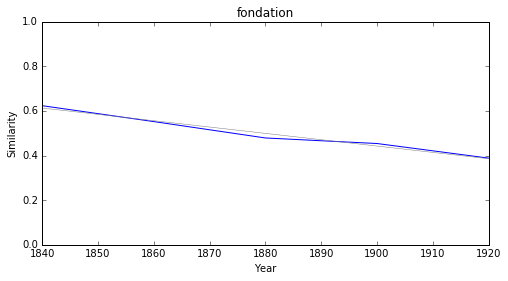

surtout


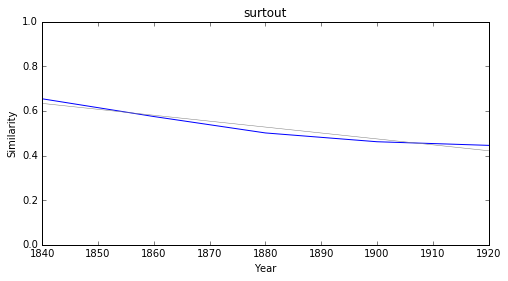

système


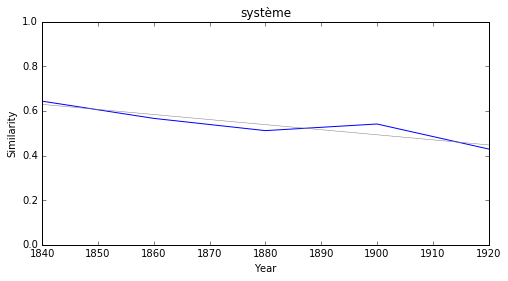

gouvernement


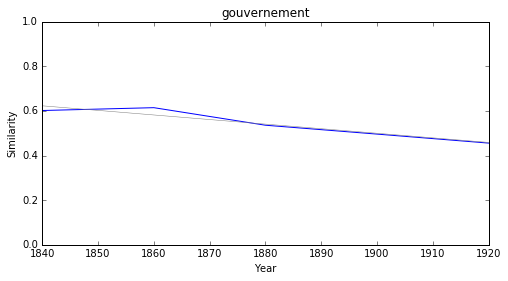

aristocratie


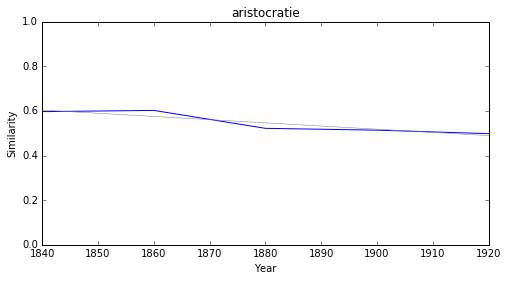

progrès


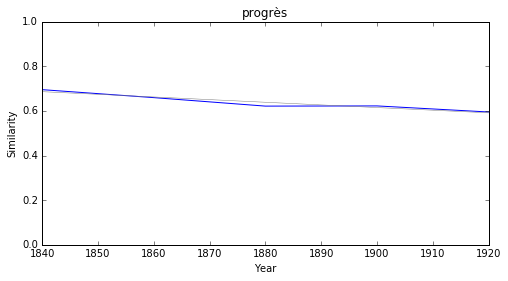

qualité


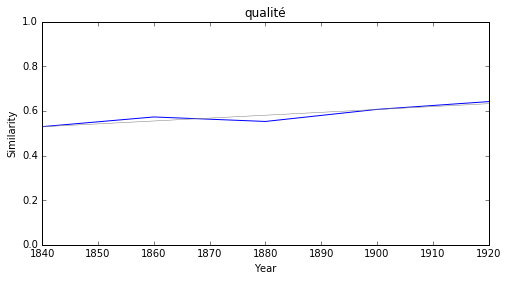

### <i><b>morale</i></b>

          token     slope         p
27  raisonneuse -0.007397  0.013857
9    philologie -0.005353  0.032819
2     concision -0.002824  0.045873
36   galanterie -0.001814  0.016830
22      progrès -0.001184  0.032244
23     solution  0.000940  0.035632
1       absolue  0.001102  0.021167
12    invention  0.001365  0.012424
5       logique  0.001375  0.027691
30      sociale  0.001389  0.013346



raisonneuse


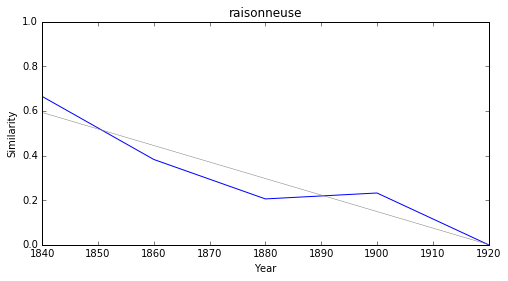

philologie


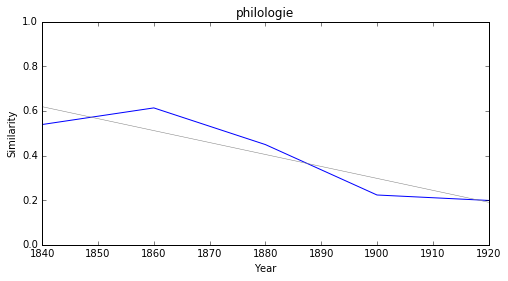

concision


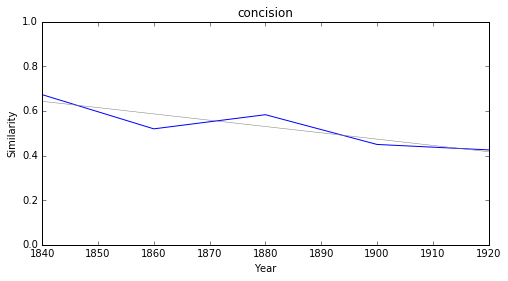

galanterie


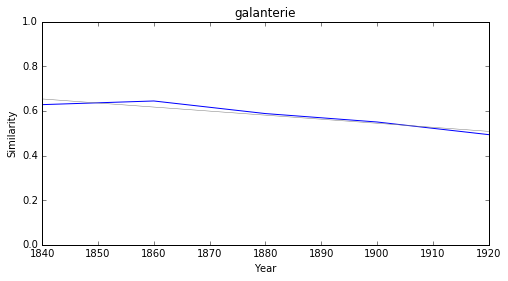

progrès


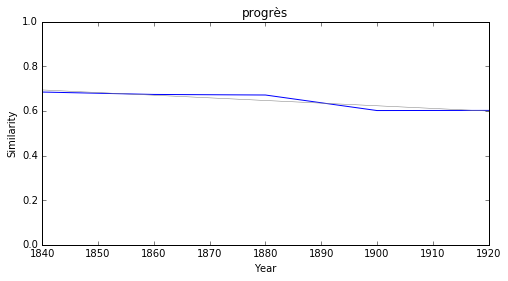

solution


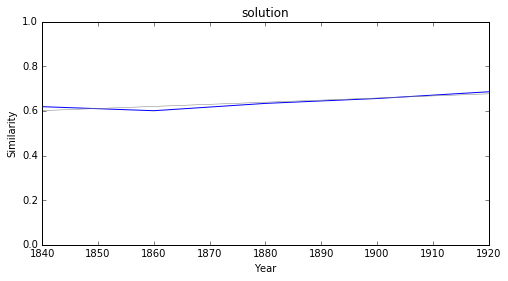

absolue


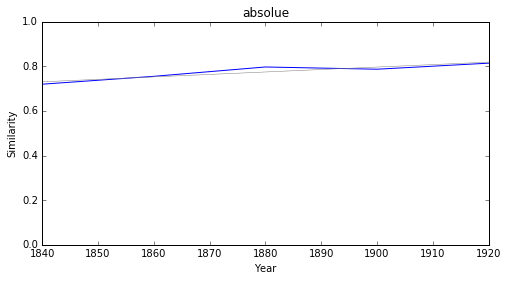

invention


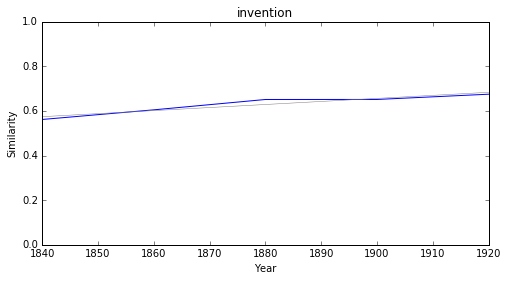

logique


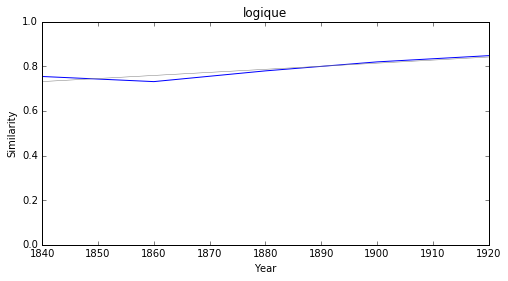

sociale


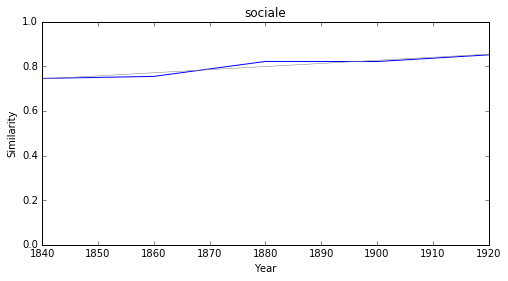

### <i><b>société</i></b>

         token     slope         p
53     réalité -0.004068  0.017173
40      parole -0.003927  0.043994
58  conviction -0.003924  0.014604
8   popularité -0.003911  0.020829
12      source -0.003834  0.037721
32    position -0.003782  0.038764
44   influence -0.003765  0.018275
25      espèce -0.003617  0.049879
36     rupture -0.003613  0.036260
24   publicité -0.003548  0.035295



réalité


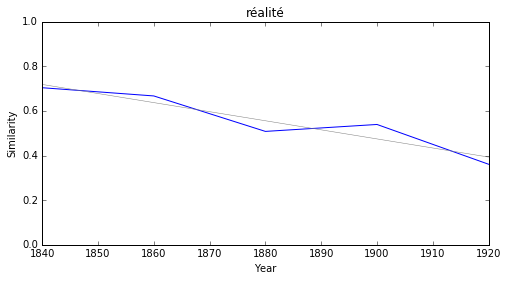

parole


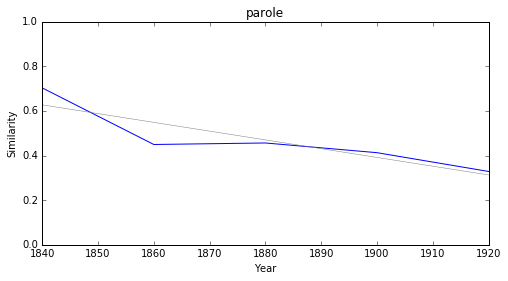

conviction


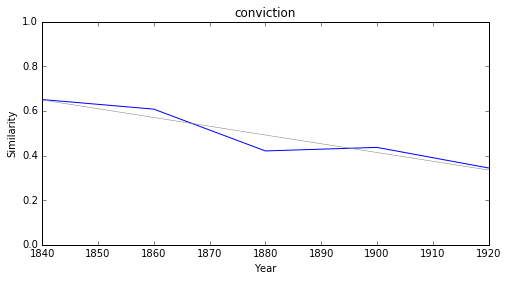

popularité


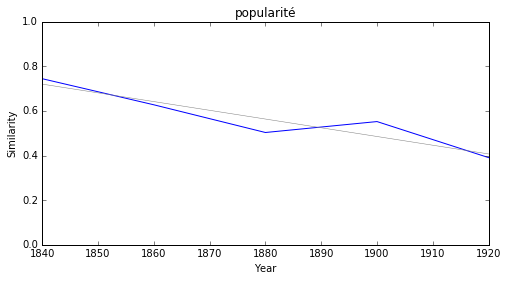

source


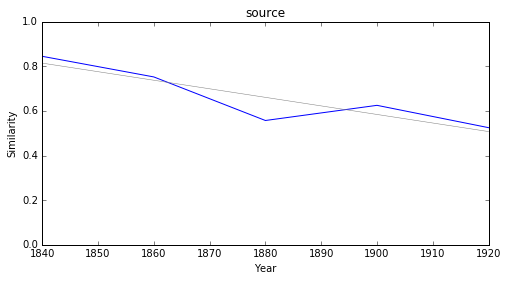

position


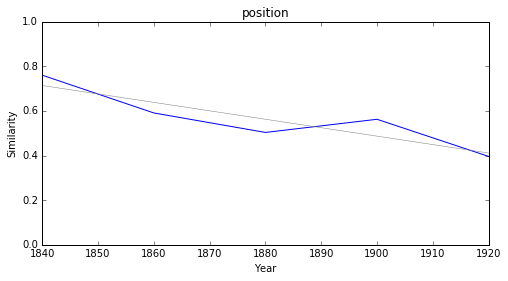

influence


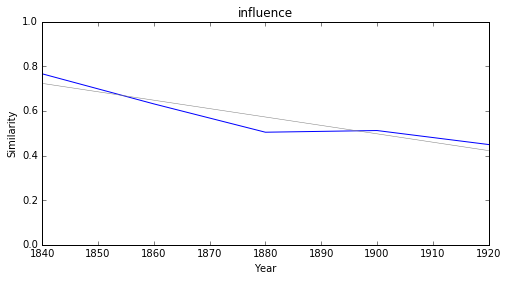

espèce


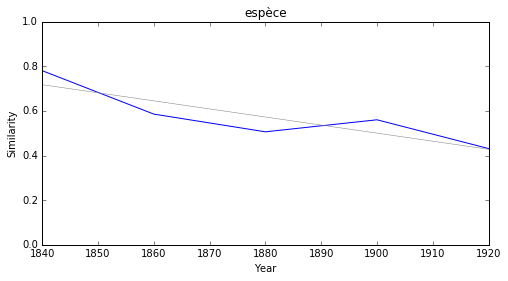

rupture


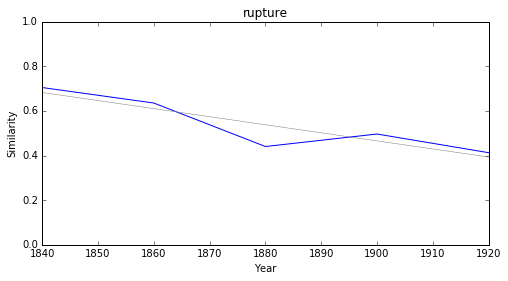

publicité


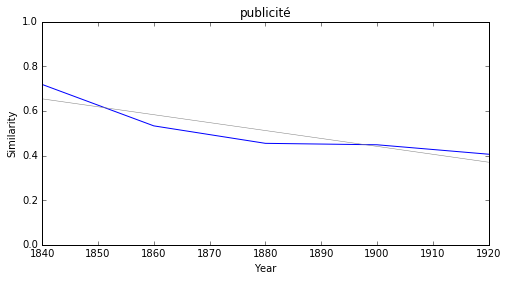

### <i><b>pouvoir</i></b>

           token     slope         p
17     privilége -0.008647  0.009878
8     mandataire -0.007293  0.041974
7   dissentiment -0.006546  0.046316
0     concurrent -0.006072  0.044438
14        ennemi -0.001649  0.018012
11       liberté -0.001433  0.008069
21  gouvernement -0.001131  0.035680
13       peuvent  0.000851  0.037946
9      nécessité  0.001350  0.028021
5      sacrifice  0.001501  0.042706



privilége


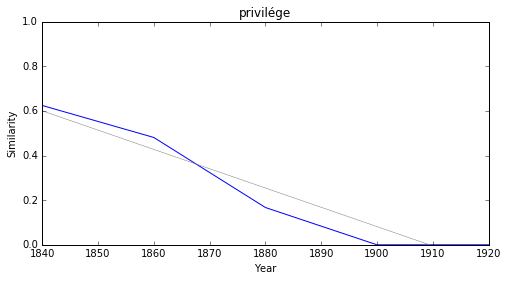

mandataire


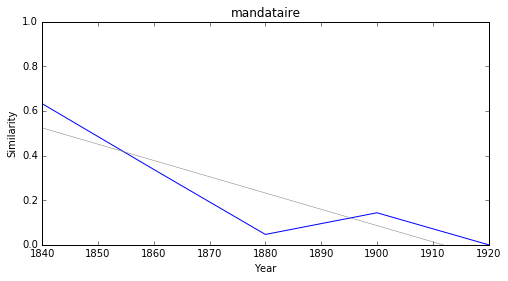

dissentiment


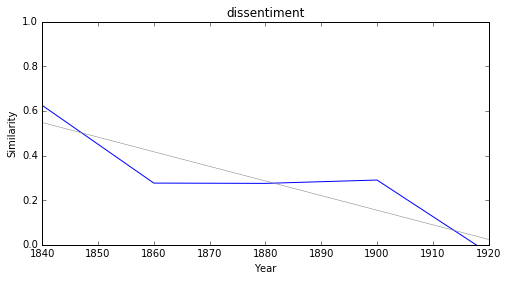

concurrent


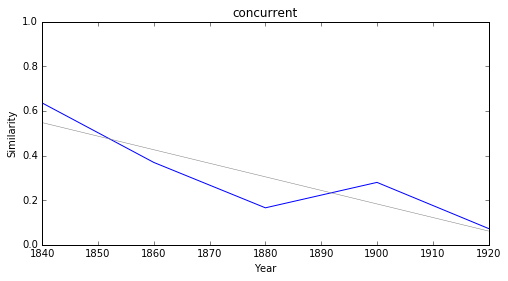

ennemi


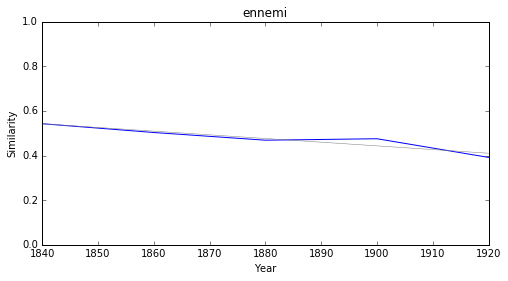

liberté


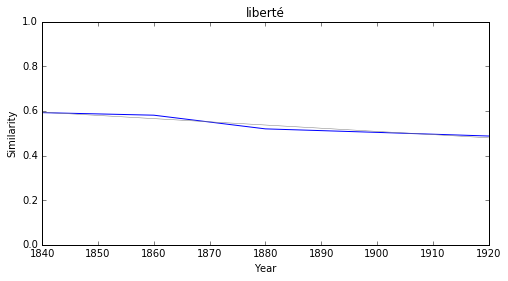

gouvernement


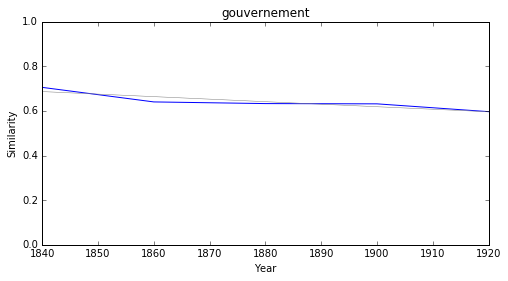

peuvent


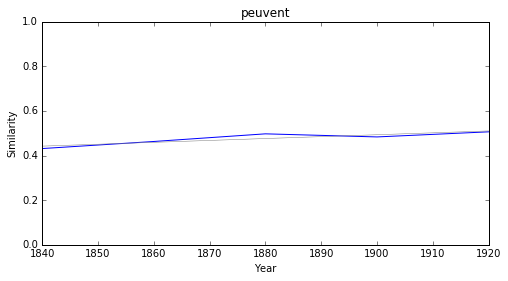

nécessité


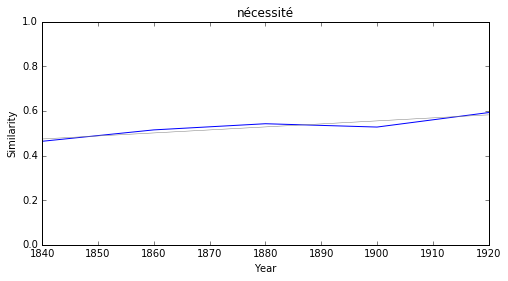

sacrifice


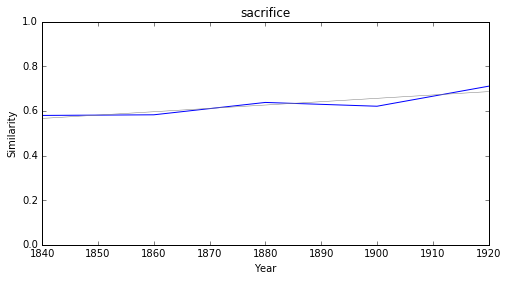

### <i><b>théologie</i></b>

             token     slope         p
19       sanscrite -0.011583  0.034452
20      théocratie -0.010634  0.008290
21     scandinavie -0.009478  0.010539
14      westphalie -0.008751  0.018108
5        nutrition -0.008326  0.035633
26        pruderie -0.003889  0.004236
15       orientale -0.002723  0.033226
0   classification -0.002607  0.017029
24        diatribe -0.002518  0.004887
8       philologie -0.002381  0.029770



sanscrite


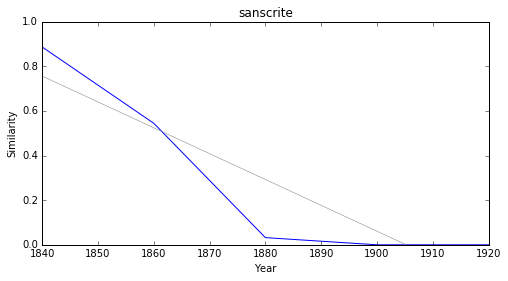

théocratie


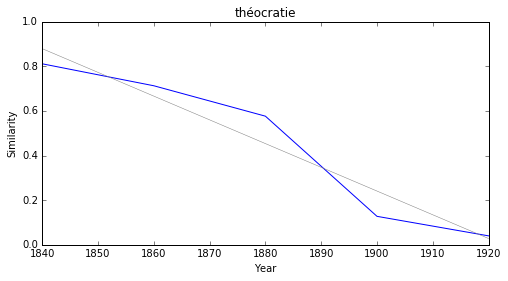

scandinavie


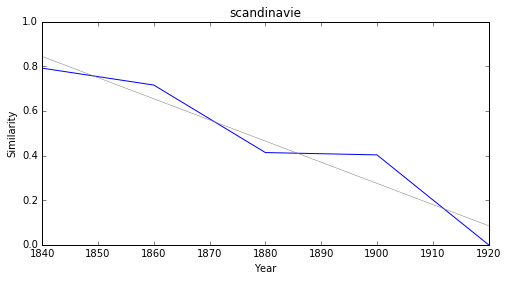

westphalie


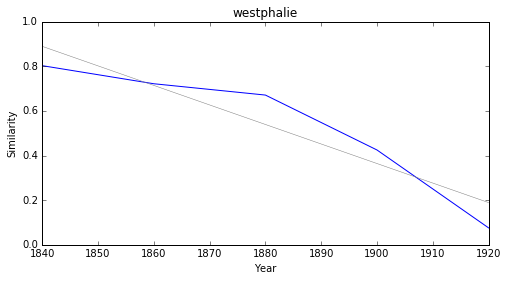

nutrition


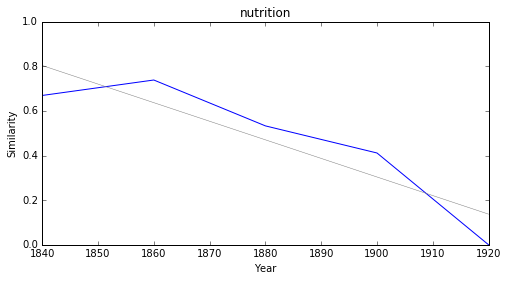

pruderie


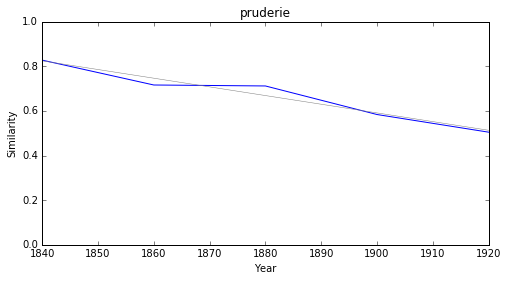

orientale


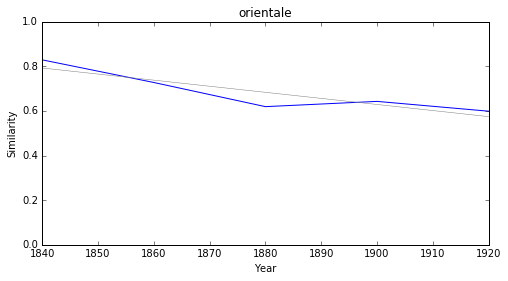

classification


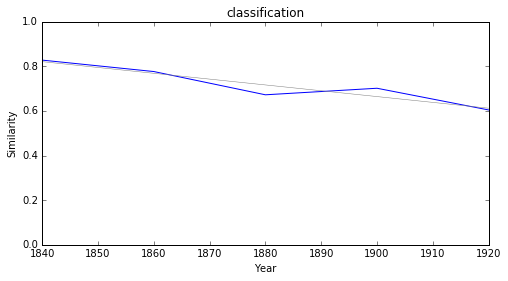

diatribe


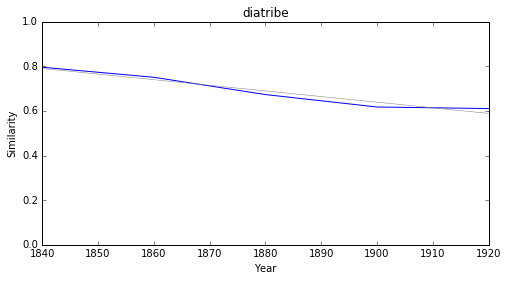

philologie


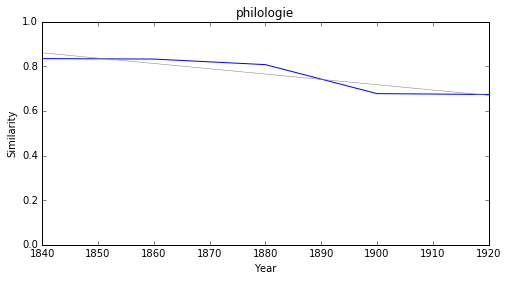

### <i><b>droit</i></b>

           token     slope         p
16     privilége -0.009152  0.021491
8   dissentiment -0.007573  0.033656
10    mandataire -0.006954  0.041141
19        imputé -0.006936  0.042626
9       régenter -0.005316  0.033413
7           haïr -0.003788  0.002320
3            osé -0.002635  0.031445
21       serment -0.001811  0.020634
20         voulu -0.000752  0.008756
1           état  0.001545  0.026463



privilége


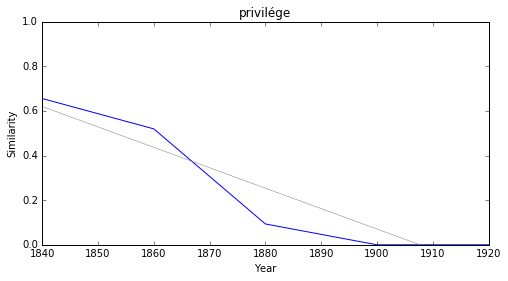

dissentiment


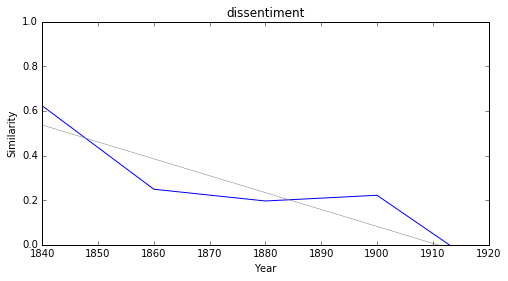

mandataire


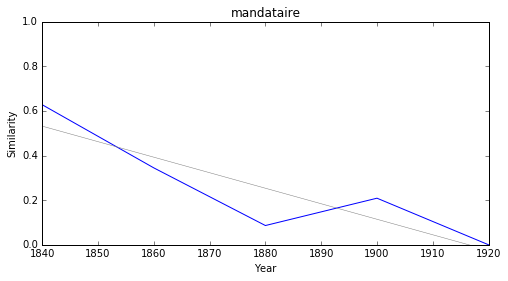

imputé


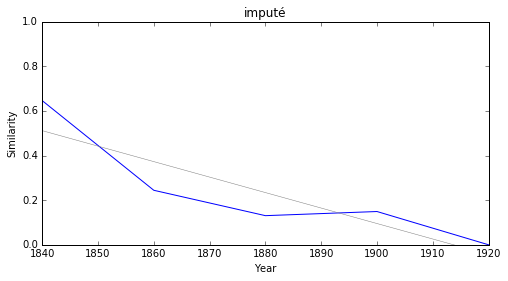

régenter


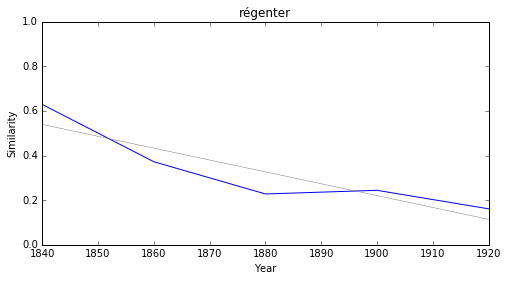

haïr


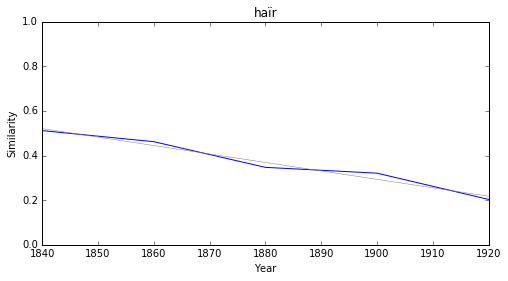

osé


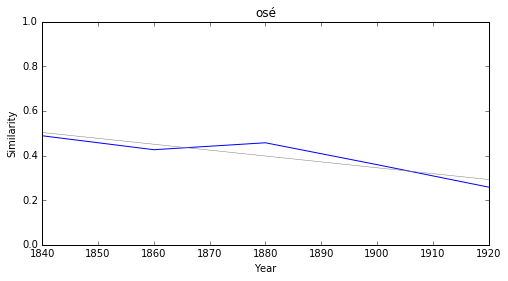

serment


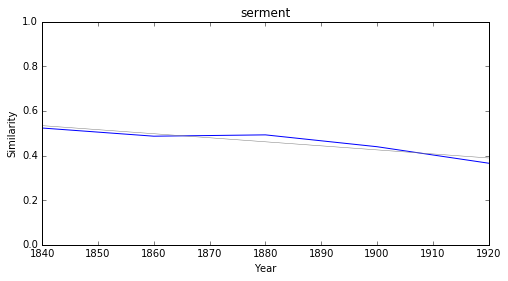

voulu


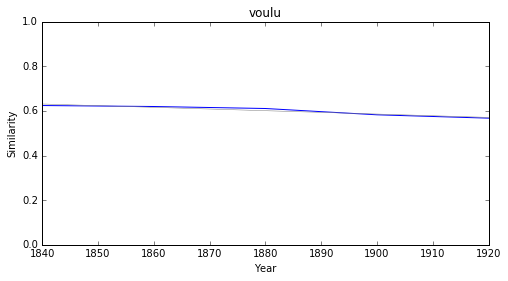

état


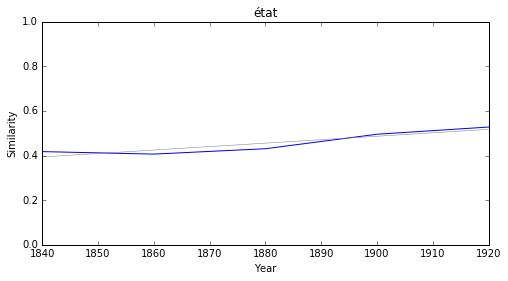

### <i><b>loi</i></b>

           token     slope         p
7      mascarade -0.008669  0.031859
5      nutrition -0.008317  0.029405
23       fiction -0.001857  0.005347
14   institution -0.001834  0.042873
9   souveraineté -0.001379  0.012380
3      sensation  0.000804  0.031680
10     hypothèse  0.001467  0.032280
12    hiérarchie  0.001851  0.003401
1      diversité  0.002072  0.009459
21         lutte  0.002305  0.016250



mascarade


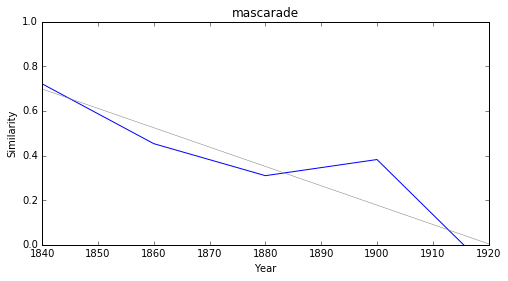

nutrition


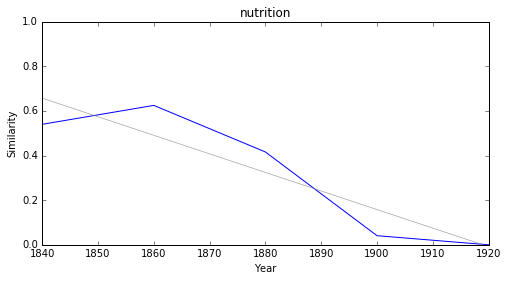

fiction


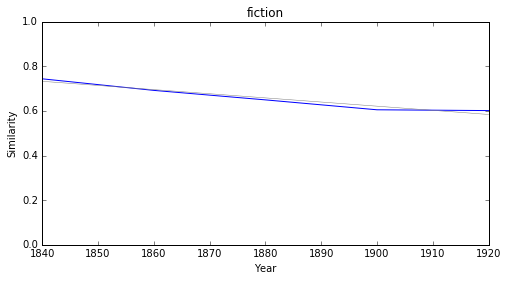

institution


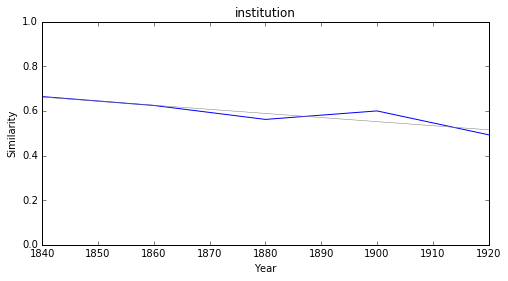

souveraineté


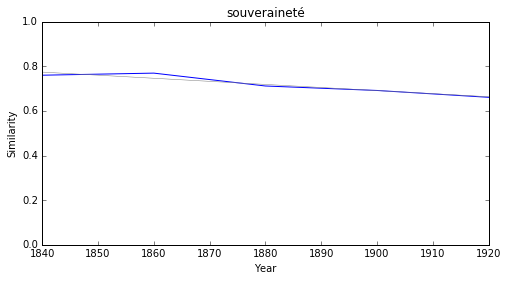

sensation


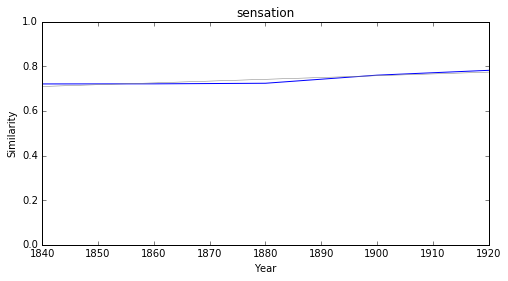

hypothèse


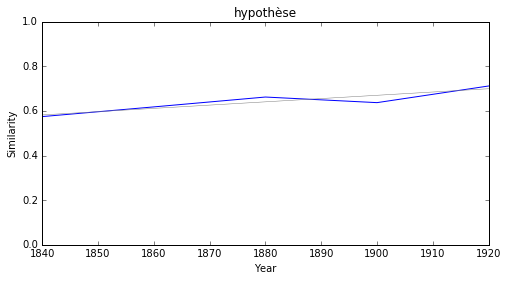

hiérarchie


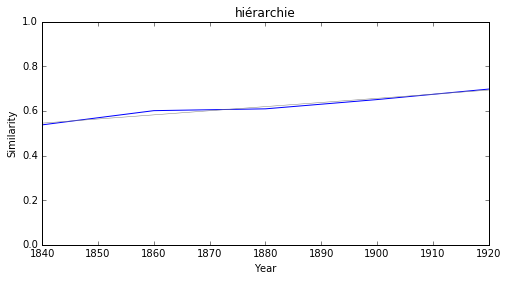

diversité


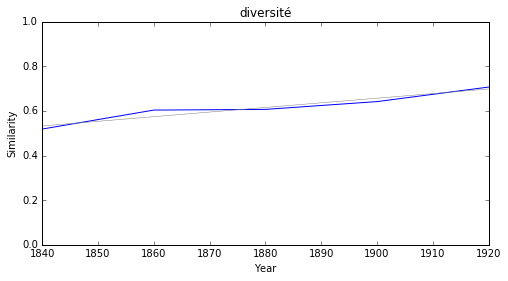

lutte


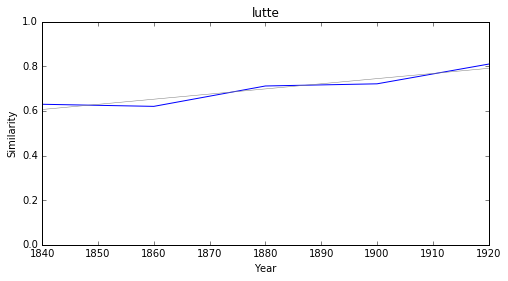

### <i><b>méthode</i></b>

              token     slope         p
8          liturgie -0.005194  0.042849
1     expérimentale -0.003741  0.036923
21          fiction -0.003183  0.034998
7       physiologie -0.002335  0.036919
11          sottise  0.001882  0.047740
15       prétention  0.001995  0.016466
20         réussite  0.003263  0.013639
3          notation  0.003413  0.036215
9        complexion  0.003963  0.040732
0   différenciation  0.008294  0.023483



liturgie


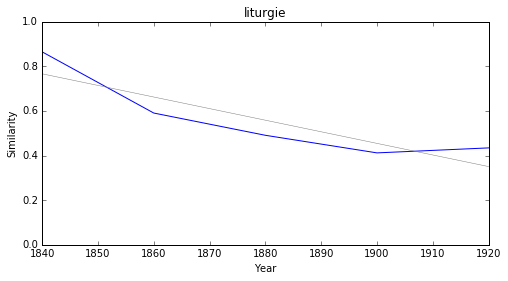

expérimentale


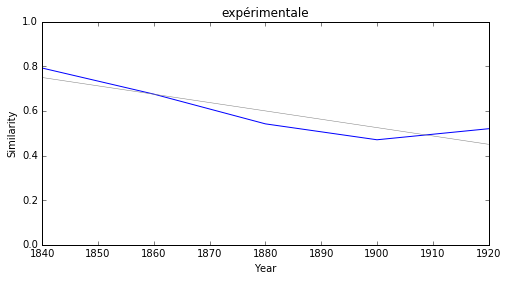

fiction


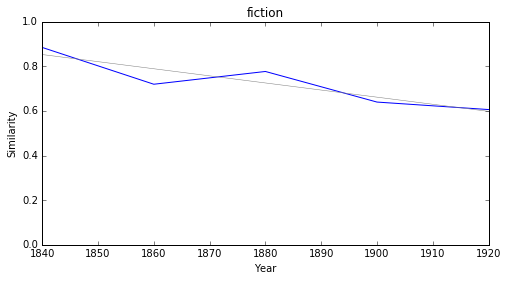

physiologie


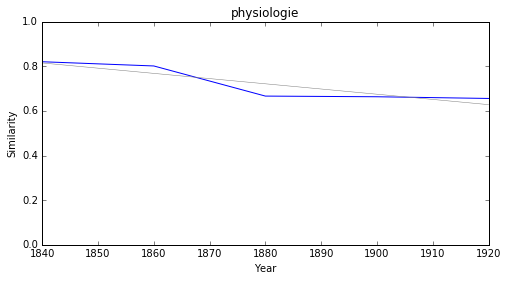

sottise


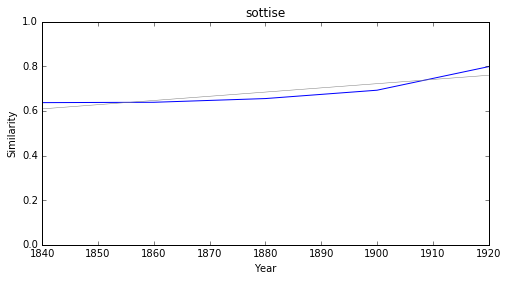

prétention


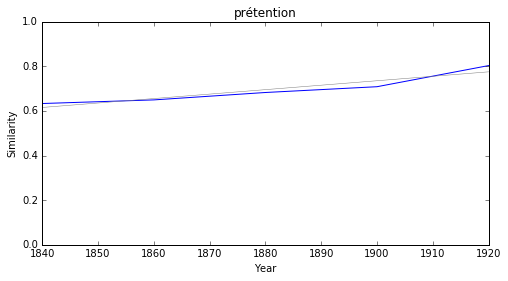

réussite


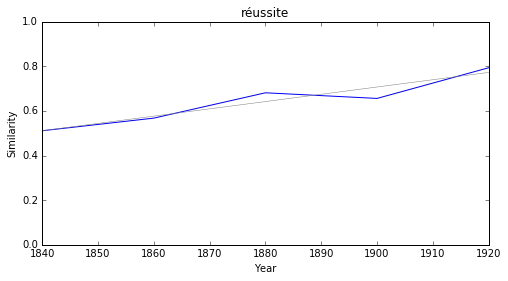

notation


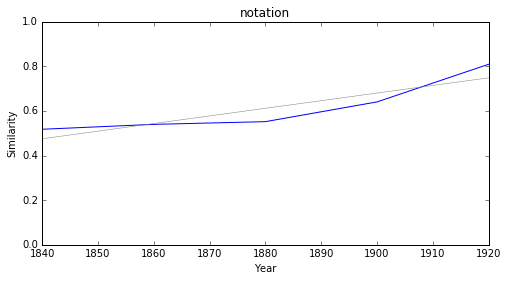

complexion


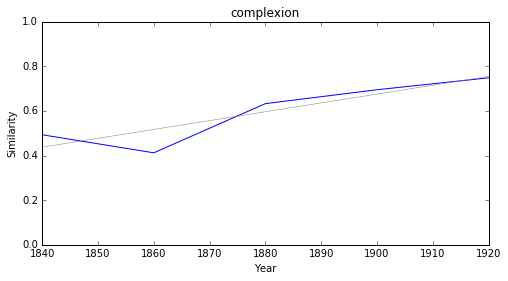

différenciation


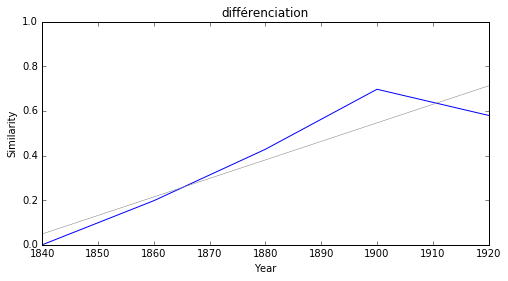

### <i><b>génie</i></b>

        token     slope         p
35   dialecte -0.005701  0.031817
29    rhythme -0.005636  0.016821
1   éloquence -0.003546  0.004075
34    penseur  0.001278  0.022789
16      poème  0.001573  0.017877
28      poète  0.001659  0.023242
24    peintre  0.001710  0.004822
6      mépris  0.001718  0.016128
23  romancier  0.001811  0.046962
9    créateur  0.001899  0.027459



dialecte


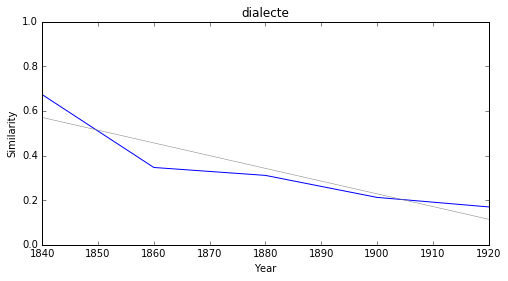

rhythme


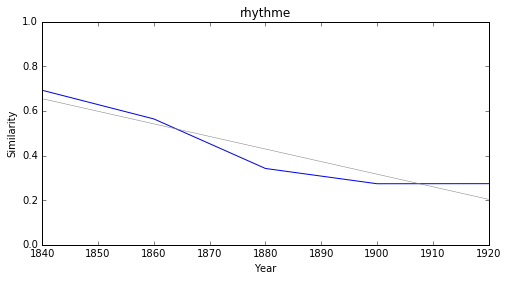

éloquence


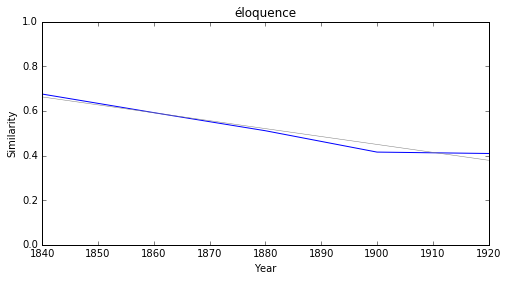

penseur


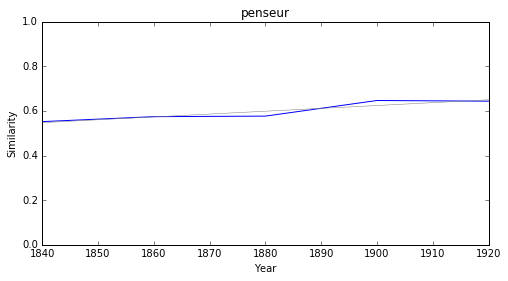

poème


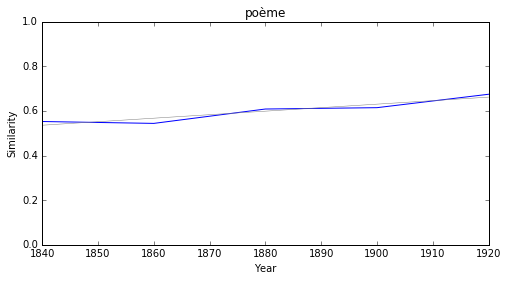

poète


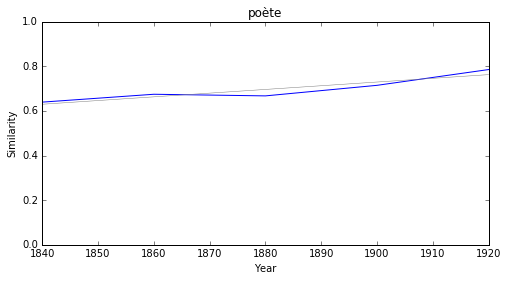

peintre


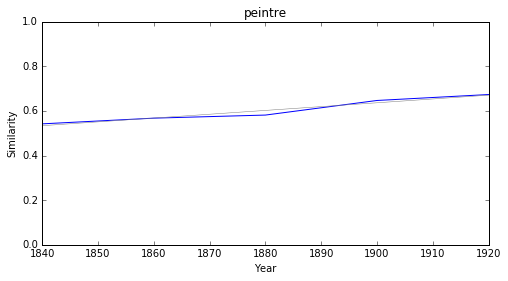

mépris


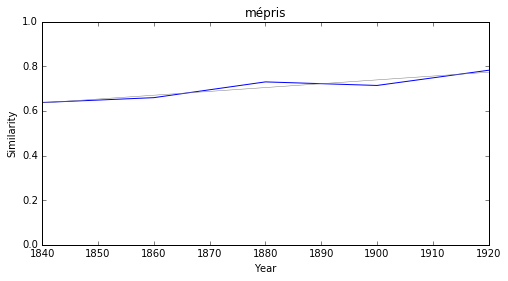

romancier


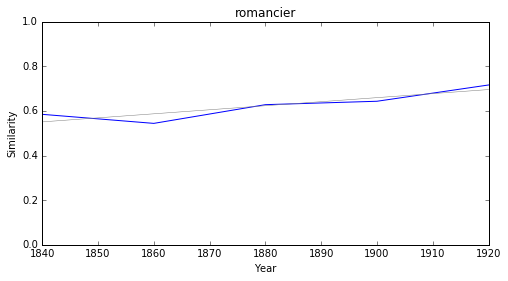

créateur


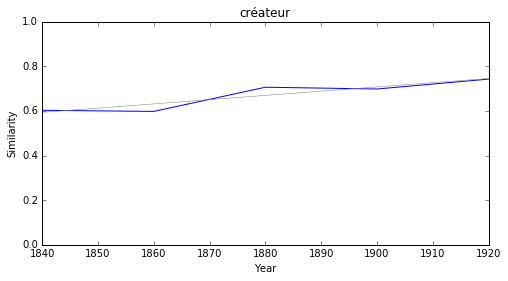

### <i><b>romantisme</i></b>

        token     slope         p
46    collége -0.011572  0.010799
6      cassin -0.011390  0.014406
10  menuisier -0.011139  0.049786
13  ménétrier -0.010965  0.006405
54     manant -0.010849  0.018529
45       pond -0.010379  0.022501
44       fisc -0.010233  0.024268
37   sanscrit -0.009482  0.020502
47    rejeton -0.007154  0.018645
34     lustre -0.006914  0.006243



collége


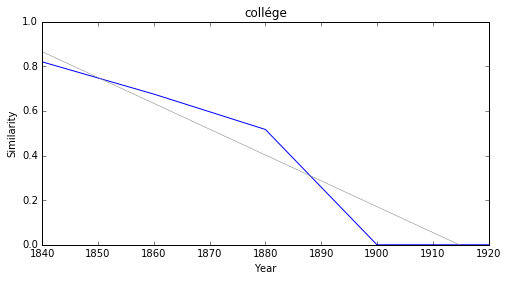

cassin


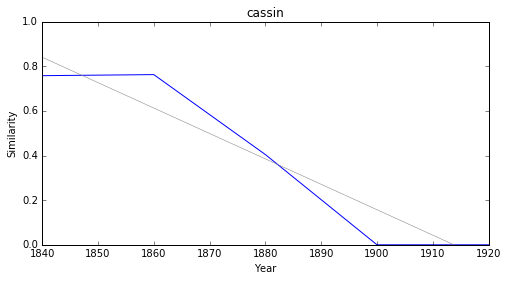

menuisier


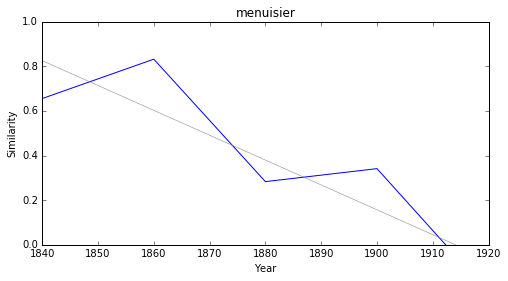

ménétrier


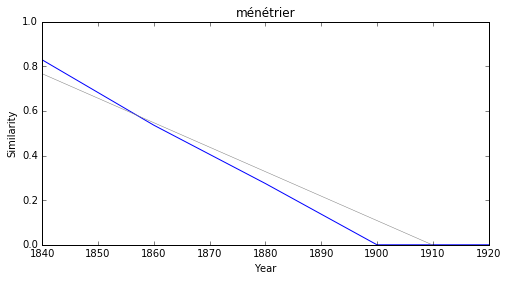

manant


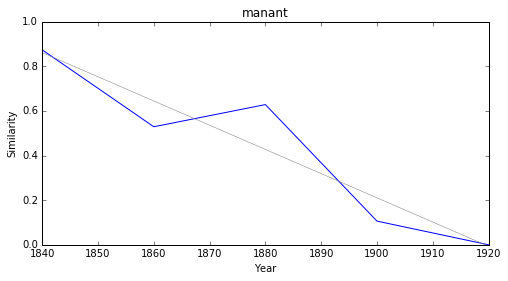

pond


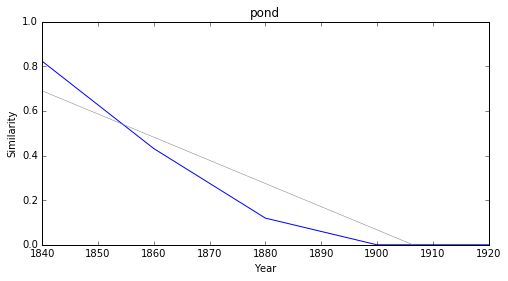

fisc


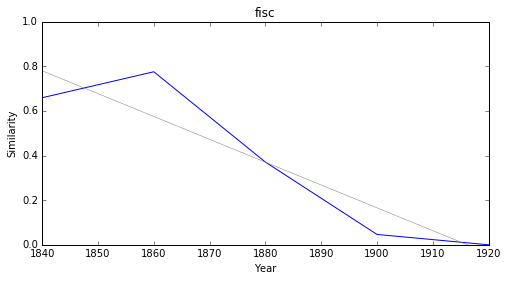

sanscrit


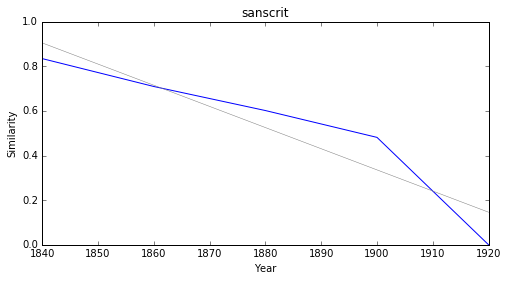

rejeton


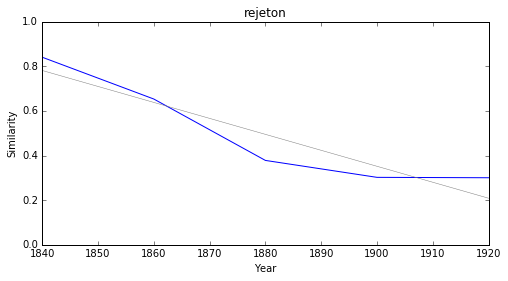

lustre


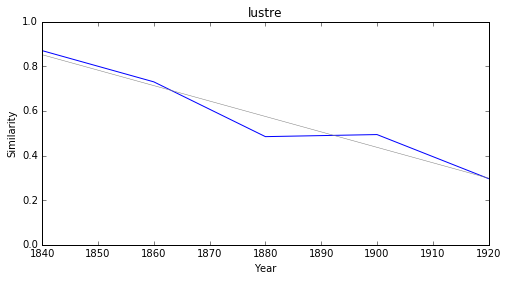

### <i><b>réalisme</i></b>

          token     slope         p
51   adulateurs -0.011622  0.023688
50         fisc -0.011310  0.024431
44      carrick -0.011252  0.035674
54        knout -0.011247  0.040734
36  mahâbhârata -0.010728  0.041588
5        filtre -0.010623  0.001503
28    jefferson -0.010614  0.040703
29      gredins -0.010610  0.049246
31      bugeaud -0.010423  0.011374
47        titré -0.010084  0.003147



adulateurs


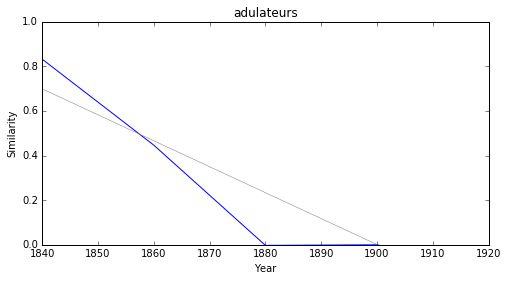

fisc


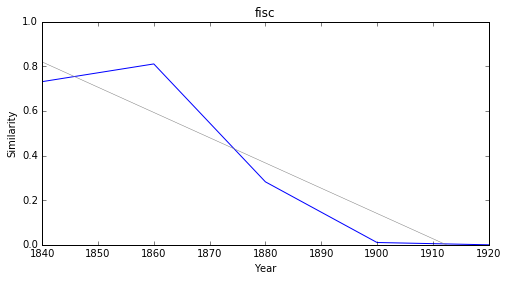

carrick


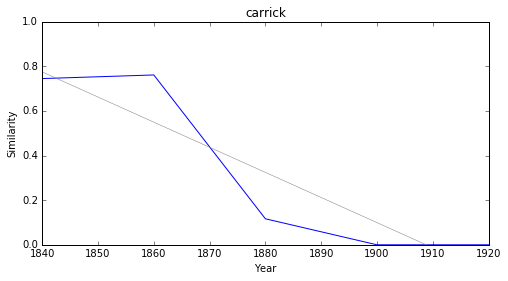

knout


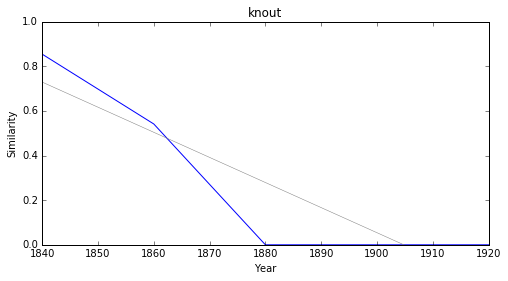

mahâbhârata


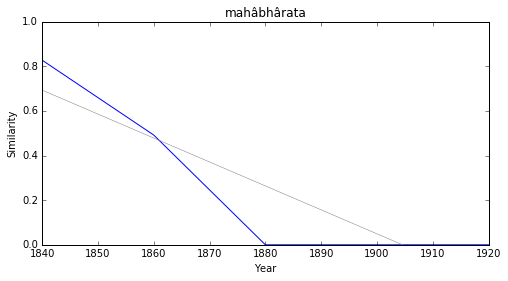

filtre


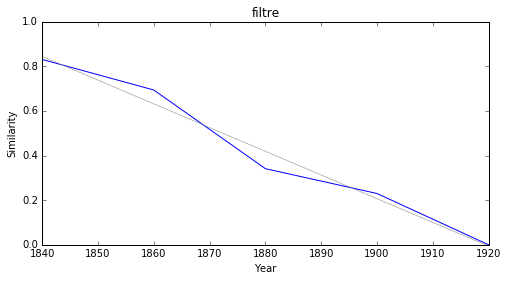

jefferson


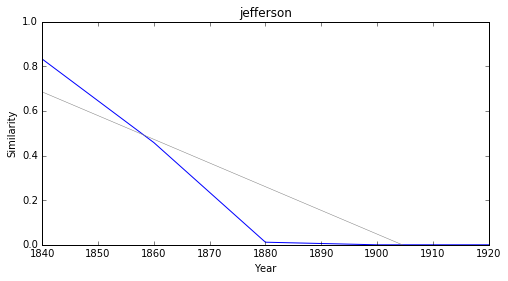

gredins


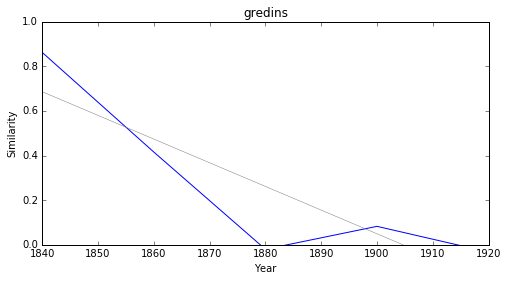

bugeaud


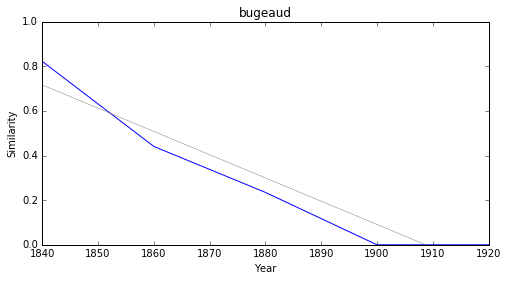

titré


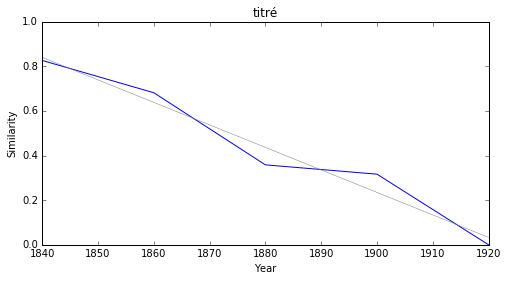

### <i><b>symbolisme</i></b>

            token     slope         p
19          triom -0.011300  0.008907
2          filtre -0.011089  0.000351
23         tellus -0.010725  0.024491
34           fisc -0.010077  0.023898
32      roncevaux -0.008854  0.017877
21     épithalame -0.008506  0.013976
38  pathologiques -0.008399  0.041235
44    expérimenté -0.008396  0.035855
11            bre -0.007542  0.016206
36        aveuglé -0.006900  0.034238



triom


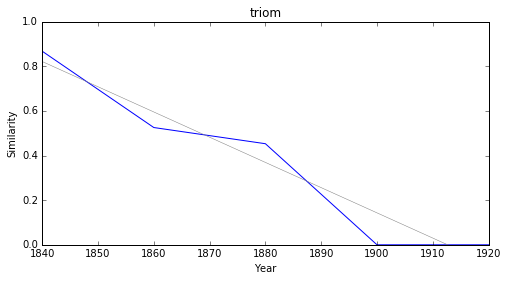

filtre


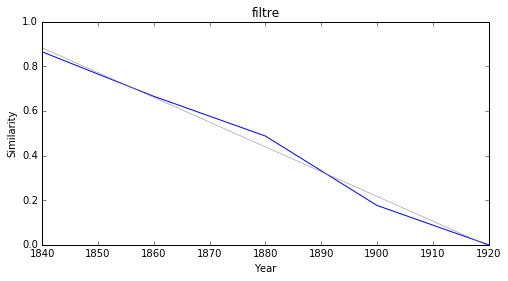

tellus


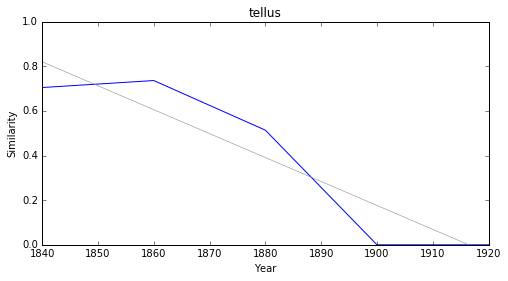

fisc


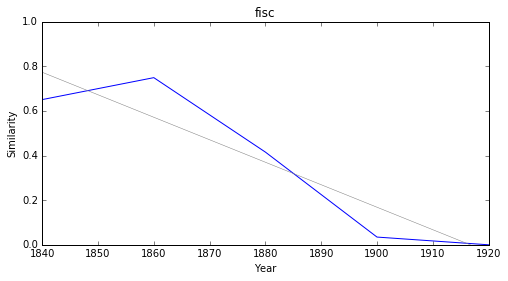

roncevaux


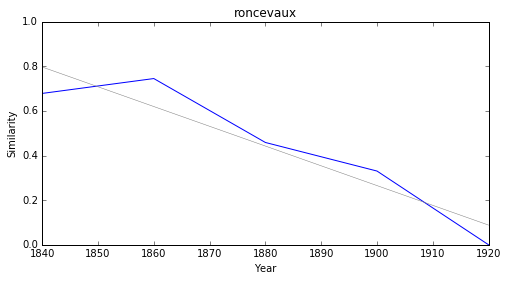

épithalame


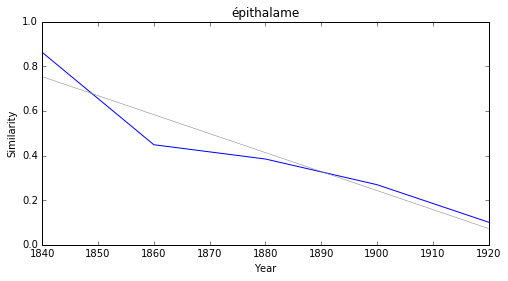

pathologiques


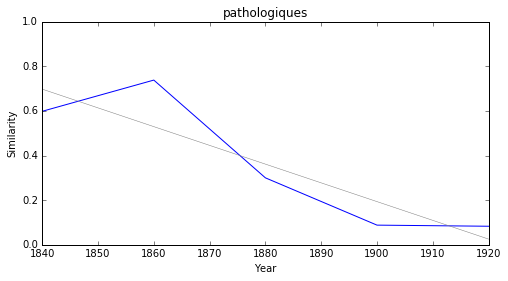

expérimenté


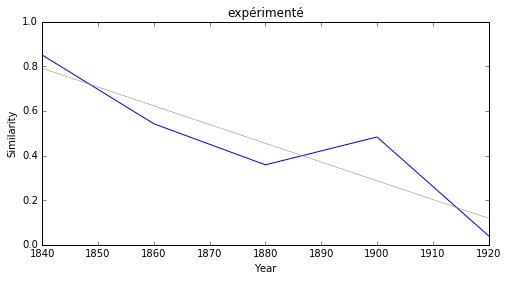

bre


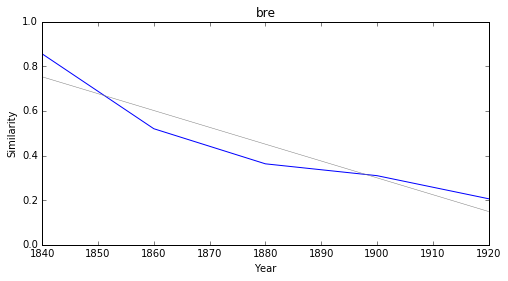

aveuglé


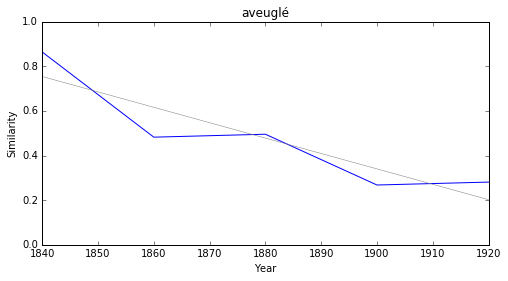

### <i><b>naturalisme</i></b>

             token     slope         p
123           prol -0.011353  0.047232
72         walther -0.011311  0.000662
70          franks -0.011179  0.025268
15   diffamatoires -0.010706  0.024056
113         goëthe -0.010597  0.008224
85         fénélon -0.010442  0.005182
131        pousses -0.010428  0.030023
6             quin -0.010236  0.036488
61      reconquise -0.010221  0.002686
73      maxillaire -0.009526  0.046822



prol


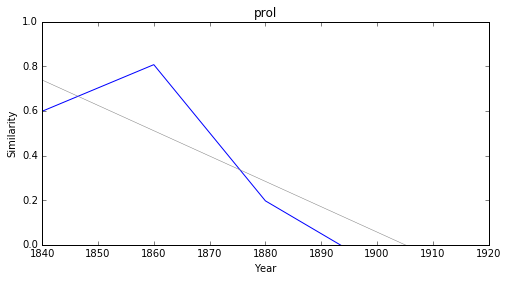

walther


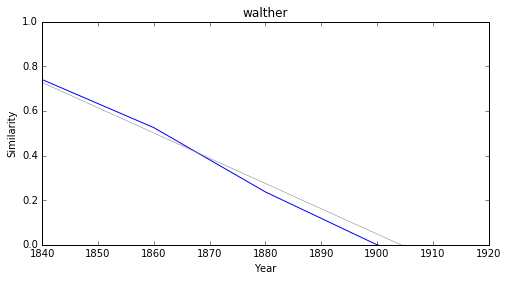

franks


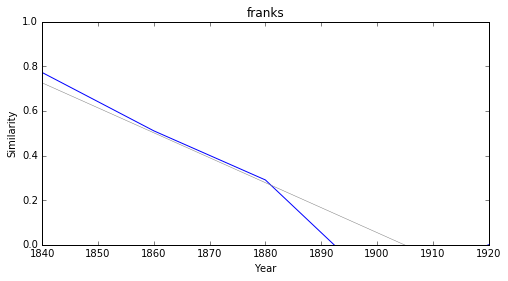

diffamatoires


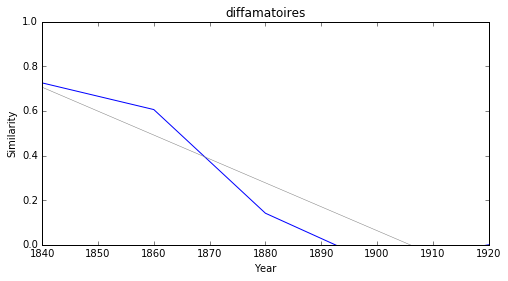

goëthe


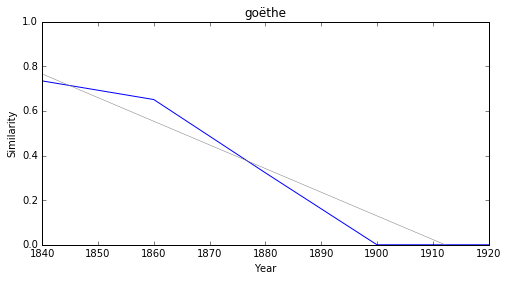

fénélon


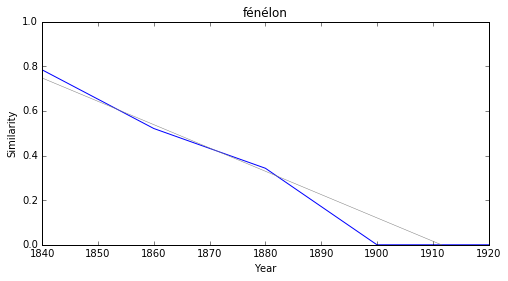

pousses


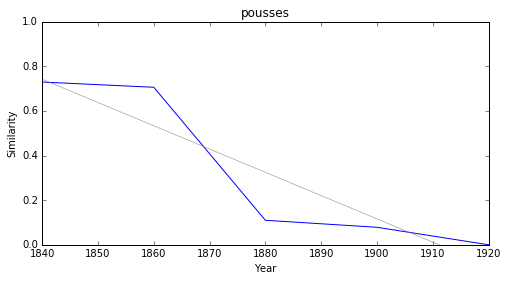

quin


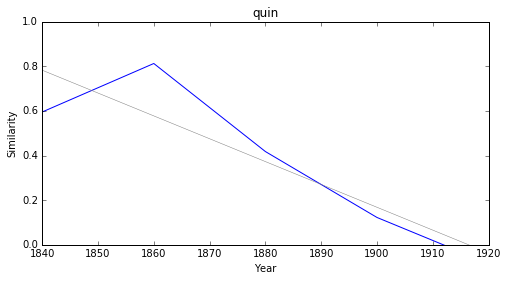

reconquise


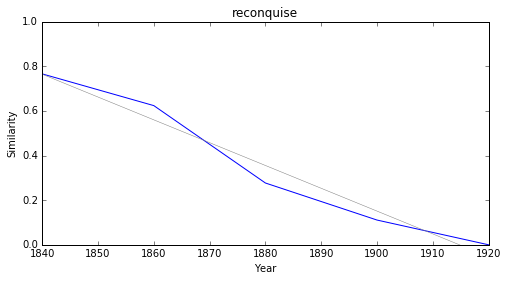

maxillaire


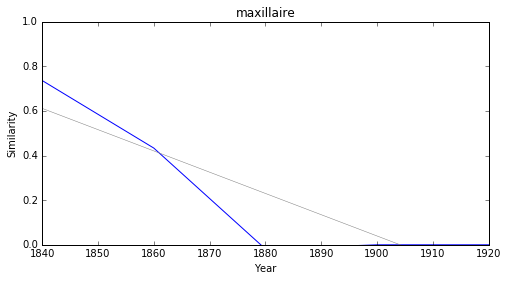

In [11]:
for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df2 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df2.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df2.sort_values('slope', ascending=True).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Intersected neighbors

In this part, we show which significant terms tend to be, throughout time, the nearest neighbours to the main entry. That is to say that these vectors follow the same evolution through time as the main entry and are very near to the "littérature" vector. At this stage, we only ask for significant terms (filter above : "if fit.pvalues[1] < 0.05").

In [12]:
def intersect_neighbor_vocab(anchor, topn=2000):
    
    vocabs = []
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocabs.append(set([s[0] for s in similar]))
        
    return set.intersection(*vocabs)

In [13]:
entries={}

for word in testList:
    data = []
    for token in intersect_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

In [14]:
import pandas as pd

### <i><b>littérature</i></b>

           token     slope         p
15   psychologie  0.003538  0.043415
1      éducation  0.002680  0.004759
23    conception  0.002491  0.010397
27  scientifique  0.002246  0.032609
18    rhétorique  0.002164  0.042701
2       majorité  0.002141  0.016374
24         masse  0.002118  0.047794
10         durée  0.002087  0.009640
11       théâtre  0.002066  0.021459
9      classique  0.002006  0.032990



psychologie


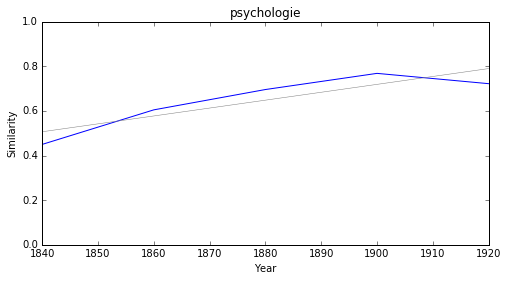

éducation


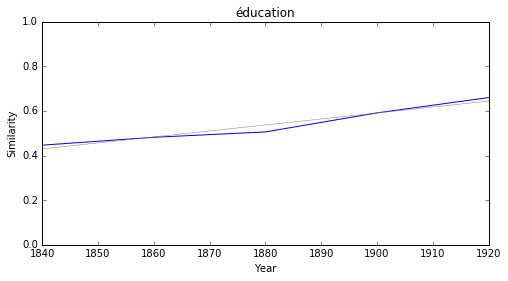

conception


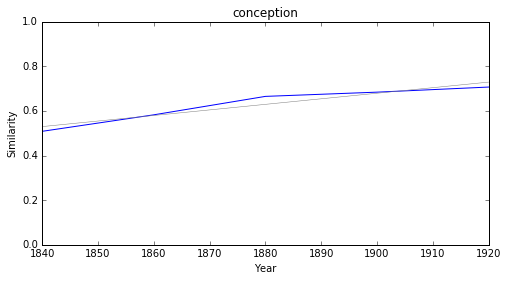

scientifique


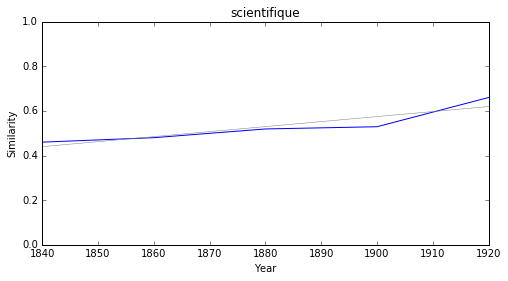

rhétorique


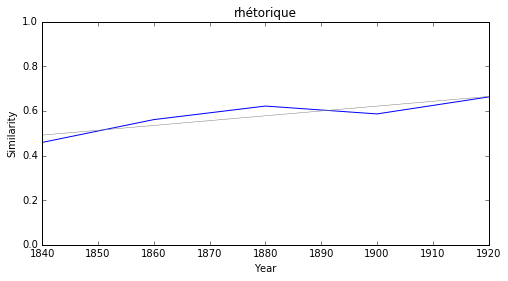

majorité


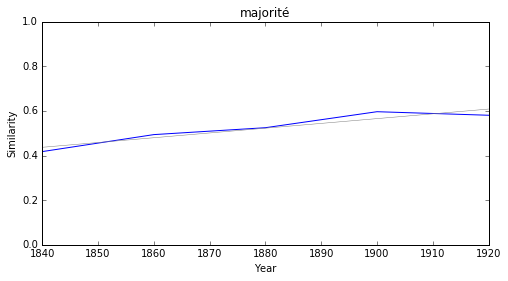

masse


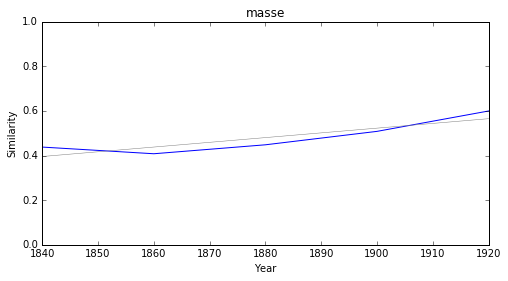

durée


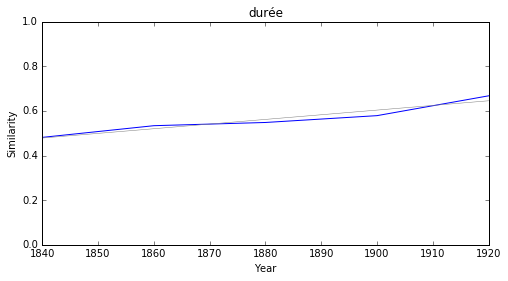

théâtre


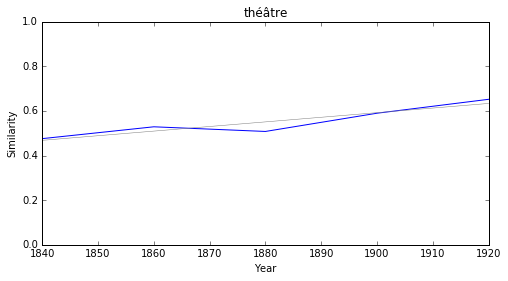

classique


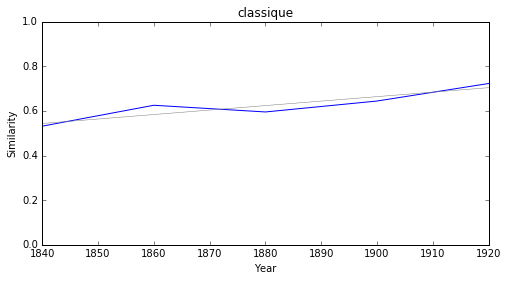

### <i><b>poésie</i></b>

           token     slope         p
35  scientifique  0.003247  0.046221
0         vision  0.003232  0.018529
9          durée  0.003228  0.006078
26     géométrie  0.002758  0.029702
24     communion  0.002750  0.023790
2    réalisation  0.002705  0.000147
33       qualité  0.002688  0.001867
27    conception  0.002593  0.022080
3         notion  0.002344  0.006907
8        probité  0.002174  0.005853



scientifique


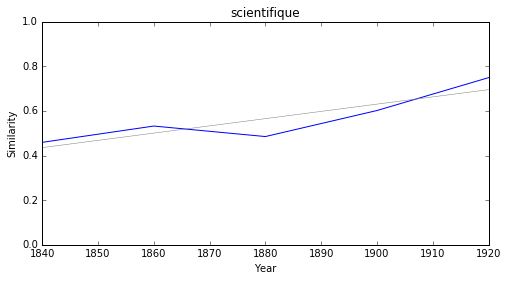

vision


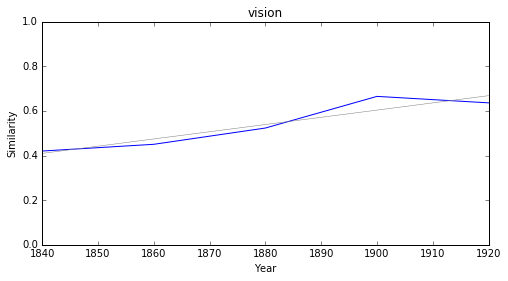

durée


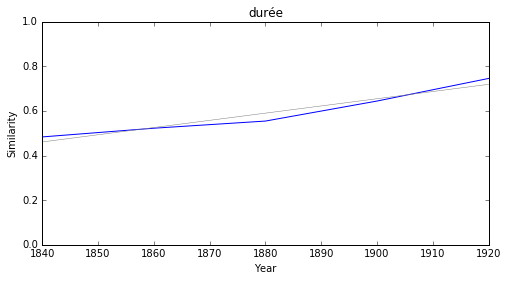

géométrie


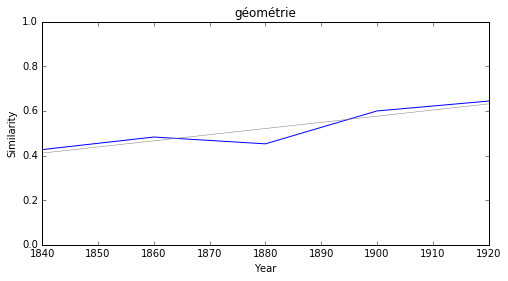

communion


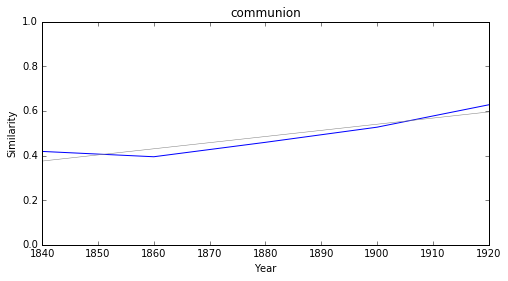

réalisation


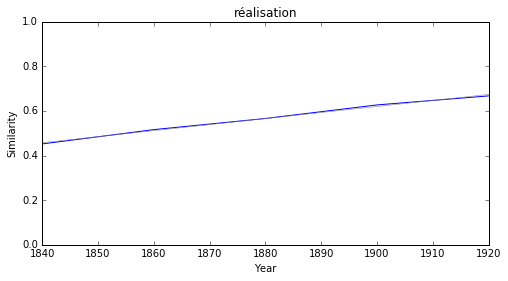

qualité


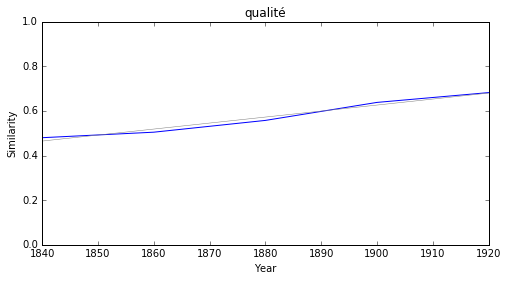

conception


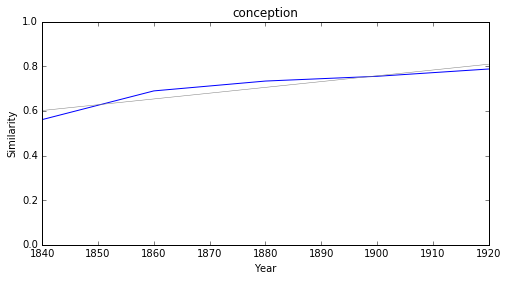

notion


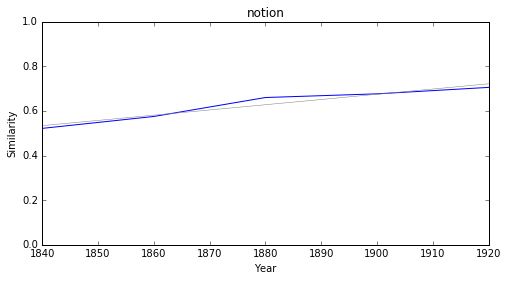

probité


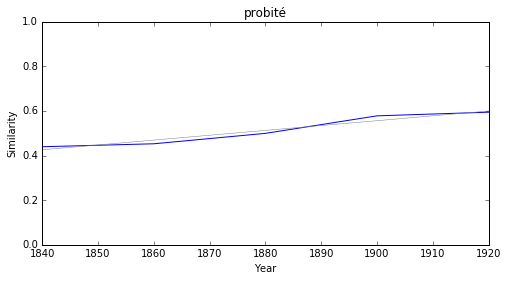

### <i><b>science</i></b>

           token     slope         p
1         notion  0.002534  0.023405
8     conception  0.002494  0.000252
6     esthétique  0.002252  0.005272
9   scientifique  0.001876  0.007611
2      sensation  0.001702  0.019472
0      substance  0.001698  0.029607
5       doctrine  0.001362  0.020165
10      aptitude  0.001147  0.014859
4       création  0.000884  0.038008
7     prétention  0.000512  0.048638



notion


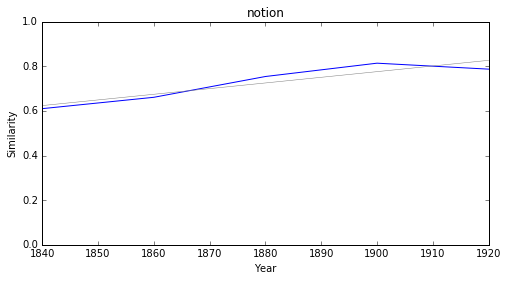

conception


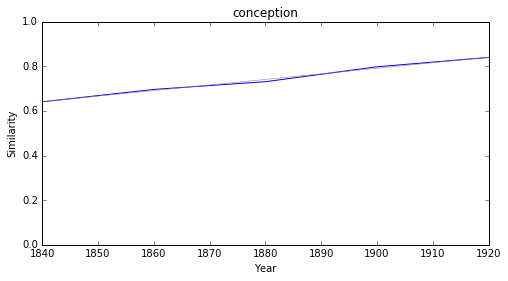

esthétique


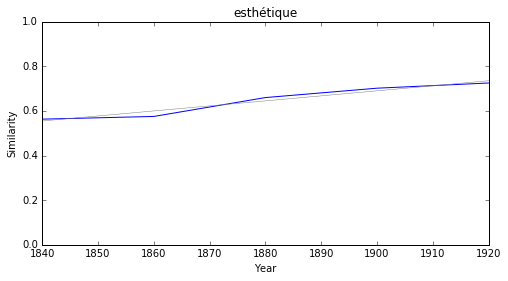

scientifique


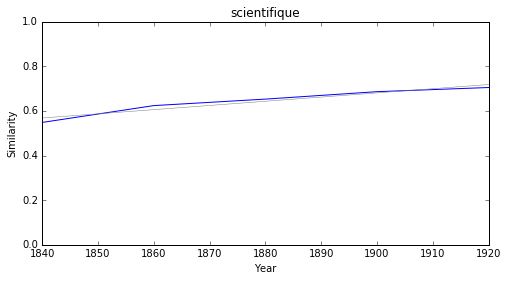

sensation


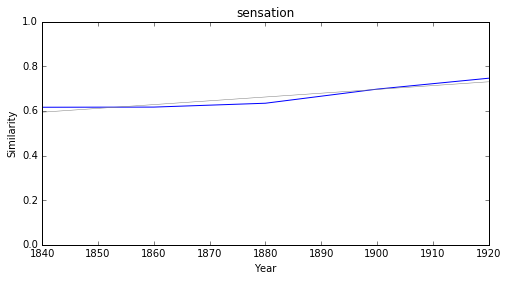

substance


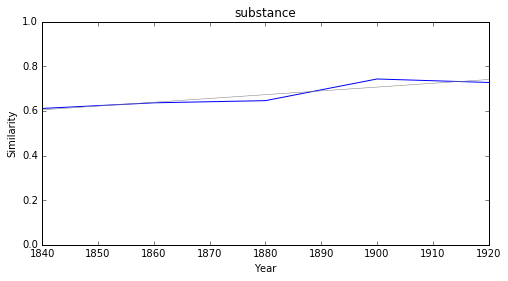

doctrine


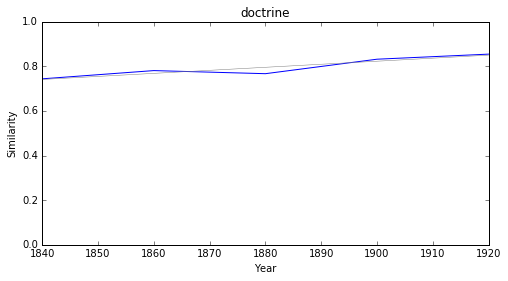

aptitude


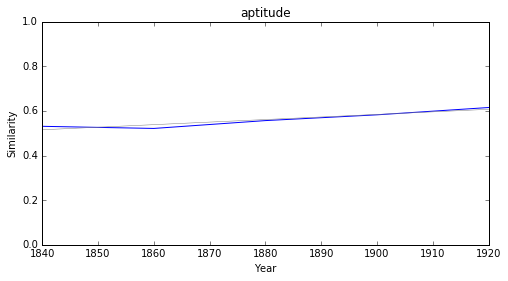

création


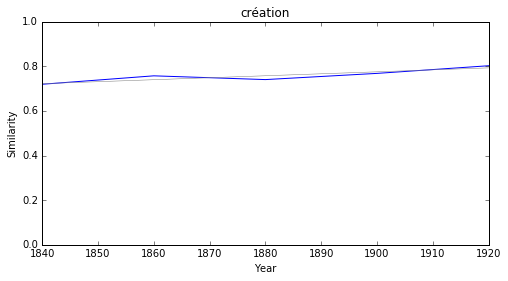

prétention


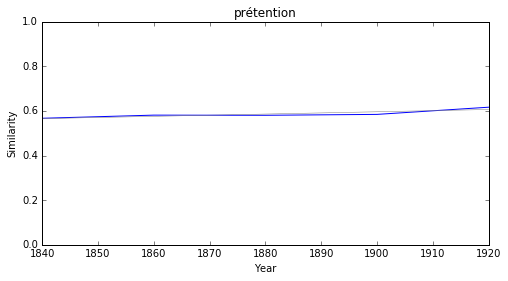

### <i><b>savoir</i></b>

          token     slope         p
0      réaliser  0.002163  0.029873
5         utile  0.001950  0.043704
8     connaître  0.001879  0.010351
4  parfaitement  0.001714  0.023866
3      rappeler  0.001346  0.007488
1      signaler  0.001136  0.046401
7     remarquer  0.000993  0.022142
2     démontrer  0.000885  0.038719
6          voir -0.002351  0.029663



réaliser


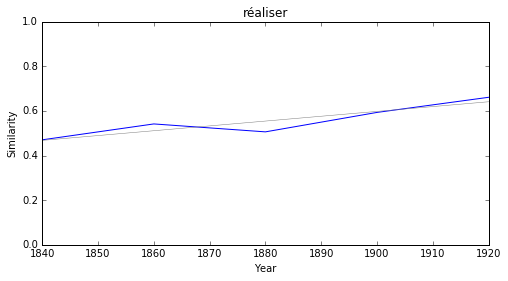

utile


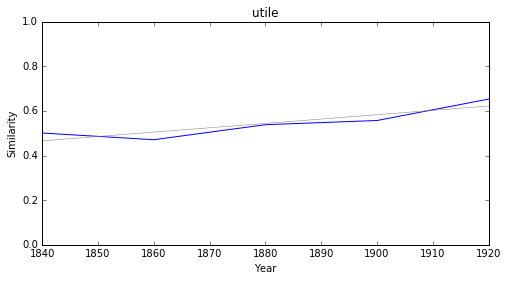

connaître


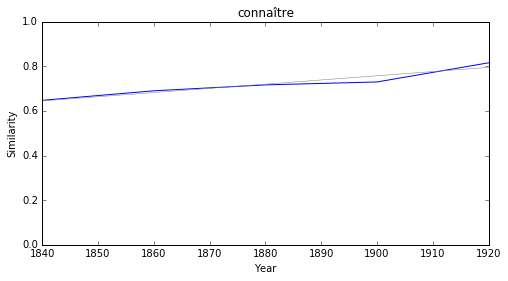

parfaitement


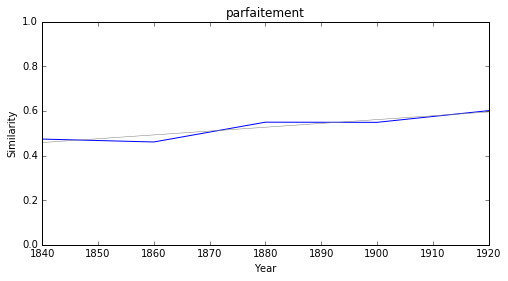

rappeler


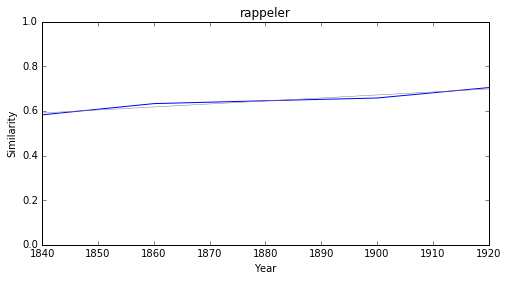

signaler


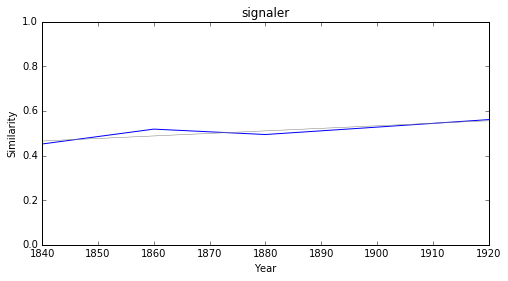

remarquer


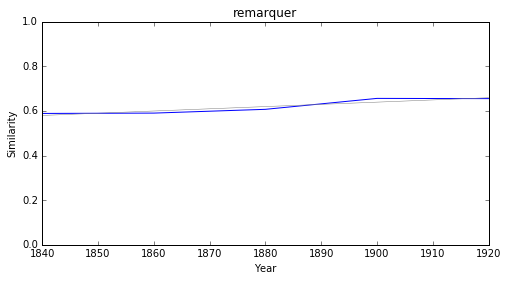

démontrer


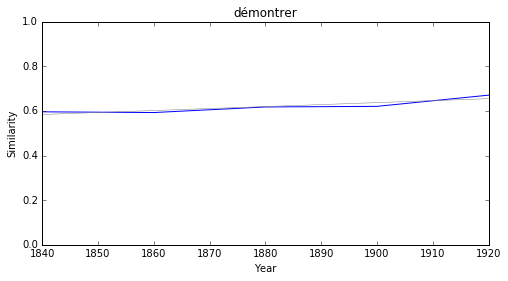

voir


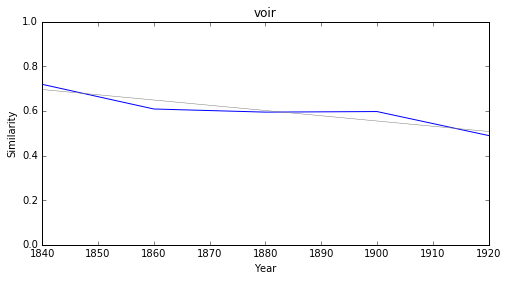

### <i><b>histoire</i></b>

           token     slope         p
11   association  0.002763  0.036591
0      éducation  0.002748  0.030090
21     grammaire  0.002518  0.046676
12       culture  0.002502  0.036982
10   renaissance  0.002303  0.020712
17     tradition  0.002109  0.038020
25  enseignement  0.002099  0.008107
6       intrigue  0.001963  0.015546
22       société  0.001947  0.010065
8     république  0.001915  0.048509



association


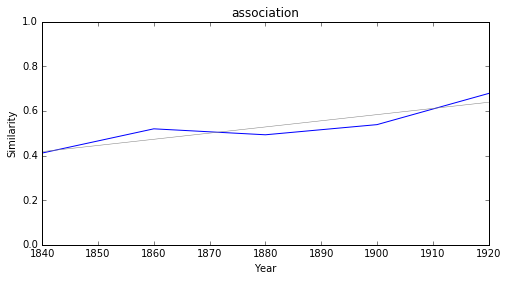

éducation


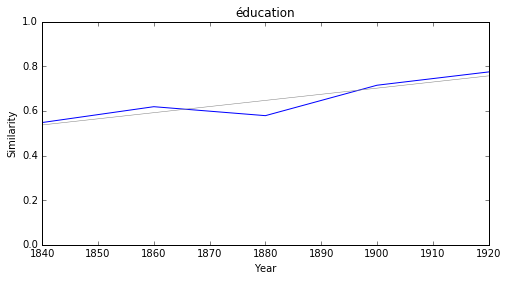

grammaire


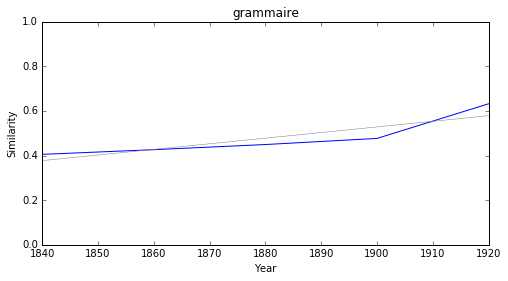

culture


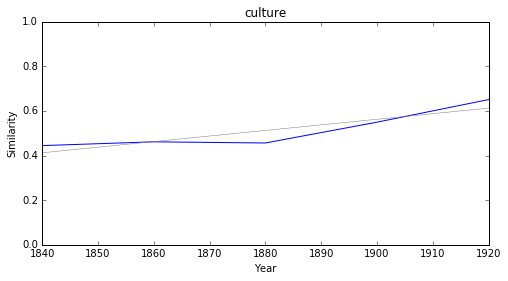

renaissance


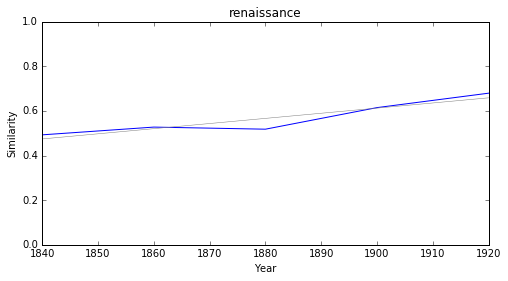

tradition


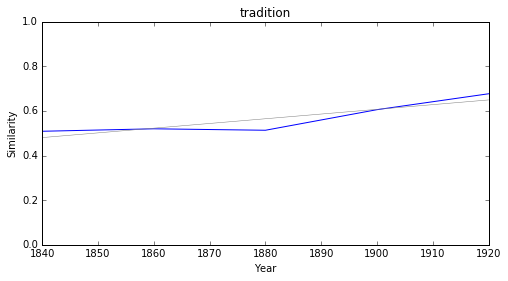

enseignement


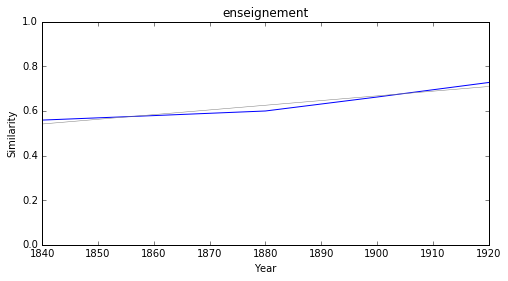

intrigue


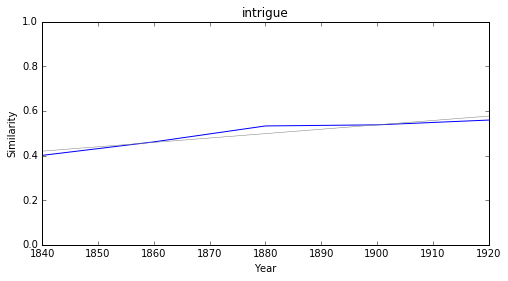

société


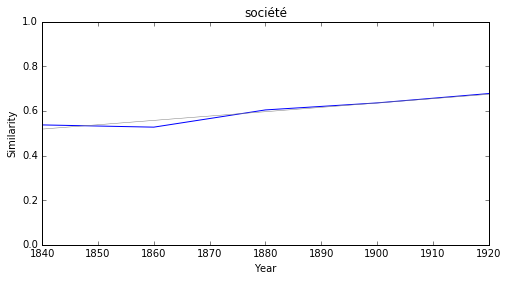

république


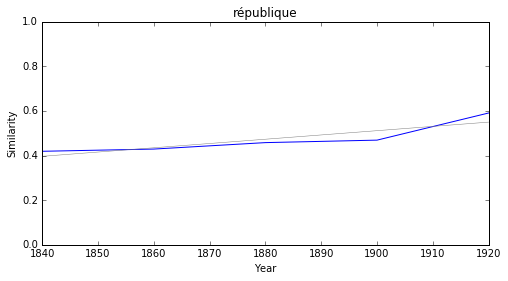

### <i><b>philosophie</i></b>

          token     slope         p
2        notion  0.002088  0.002145
5    convention  0.002012  0.035185
6    historique  0.001742  0.027927
8          dite  0.001717  0.036054
1   réalisation  0.001579  0.045394
7    conception  0.001454  0.018830
0        satire  0.001069  0.008690
10    grammaire  0.001052  0.043097
9     frivolité  0.000889  0.018952
3   littérature  0.000399  0.030672



notion


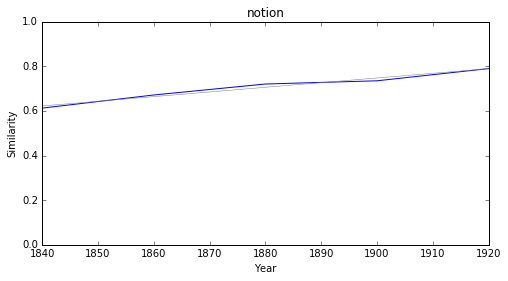

convention


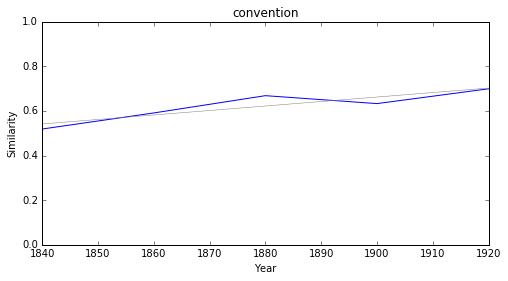

historique


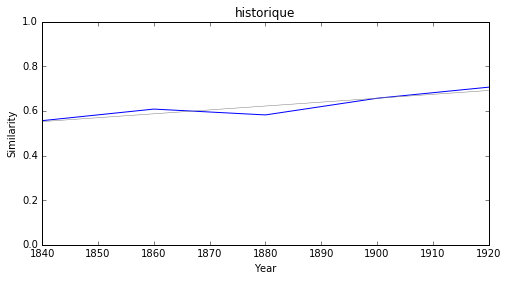

dite


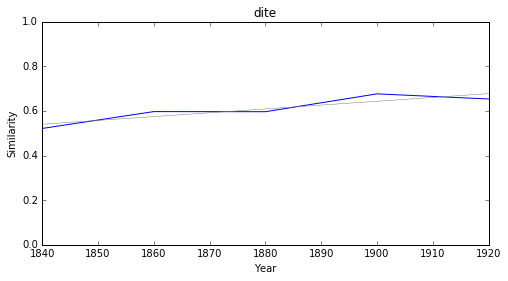

réalisation


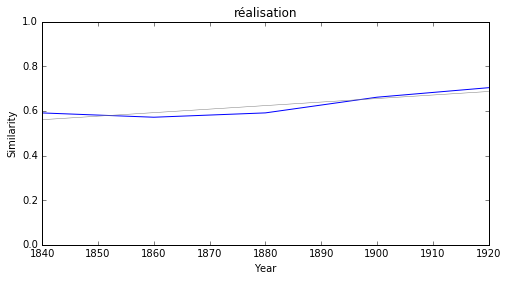

conception


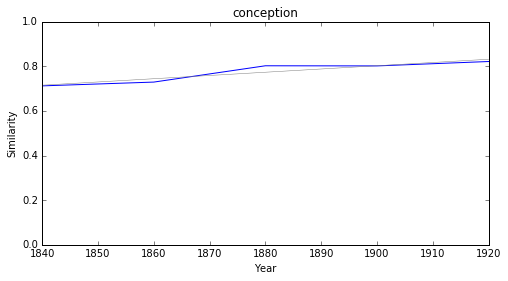

satire


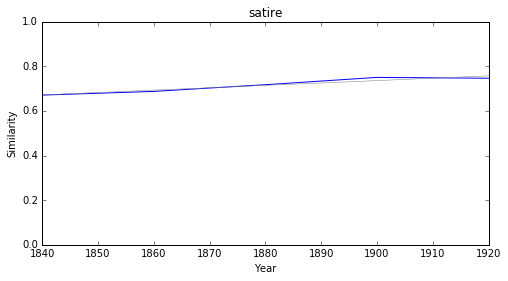

grammaire


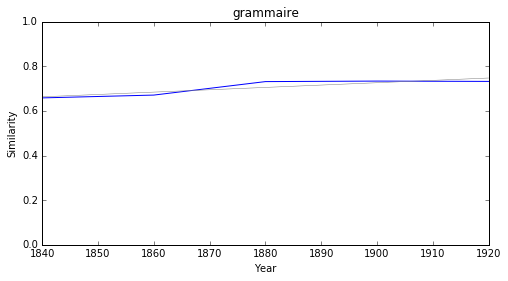

frivolité


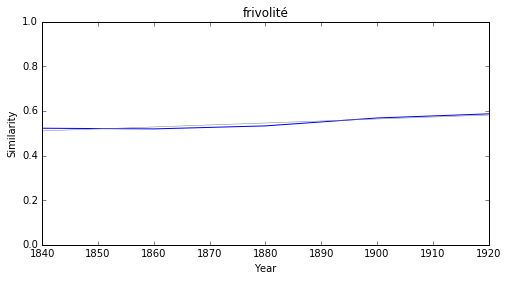

littérature


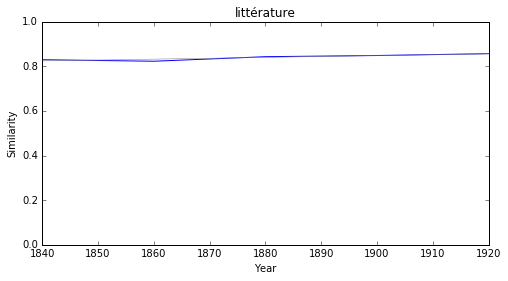

### <i><b>lettre</i></b>

            token     slope         p
1          soirée  0.001934  0.042696
6       septembre  0.001446  0.026820
4      conférence  0.001274  0.008117
2          séance -0.001011  0.031333
5  représentation -0.001249  0.025311
3    bibliothèque -0.001577  0.007085
0        chapelle -0.001596  0.012033



soirée


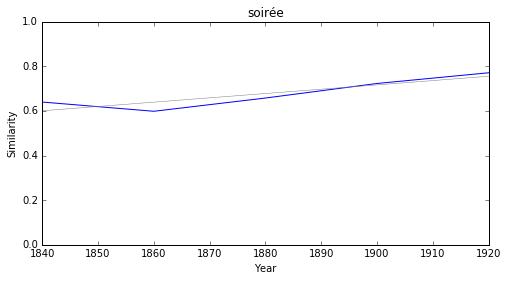

septembre


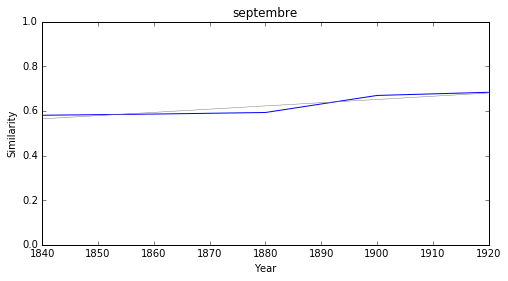

conférence


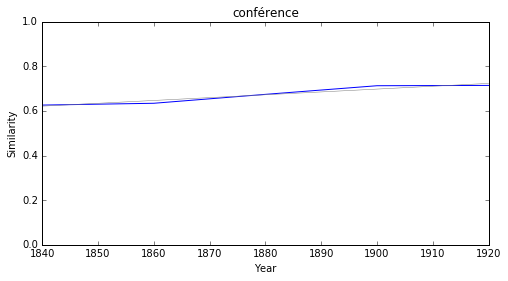

séance


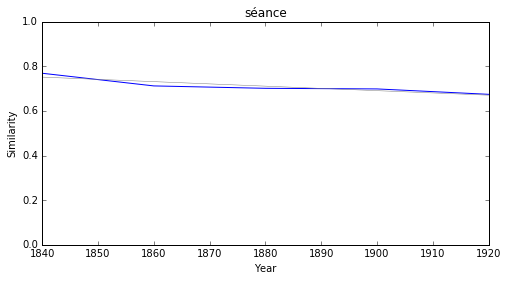

représentation


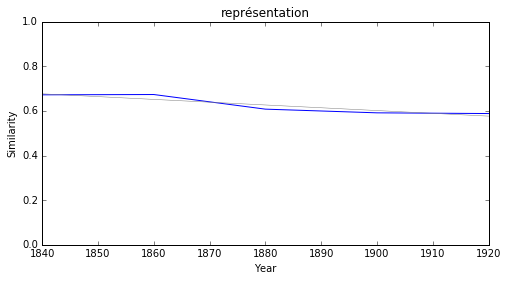

bibliothèque


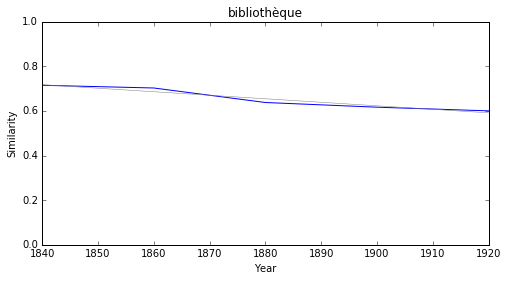

chapelle


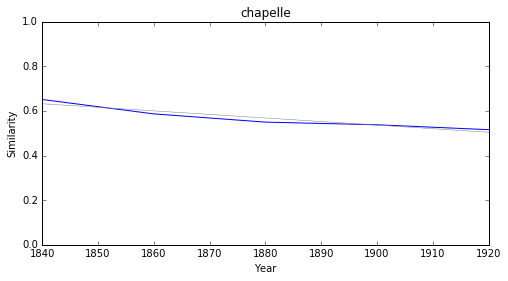

### <i><b>critique</i></b>

          token     slope         p
0      écrivain -0.001427  0.049980
1       mission -0.001493  0.000666
4   distinction -0.001577  0.007913
8         tâche -0.001658  0.022336
7  circonstance -0.001767  0.046500
6    discussion -0.001797  0.021269
5       bruyère -0.002143  0.008799
2     situation -0.002165  0.002838
3        mérite -0.002626  0.001216



écrivain


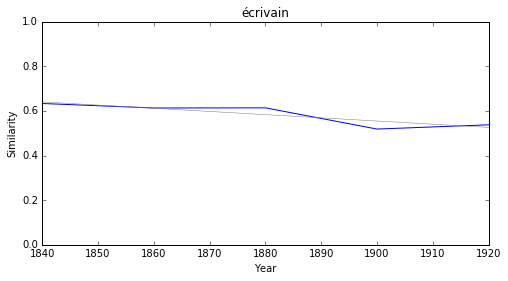

mission


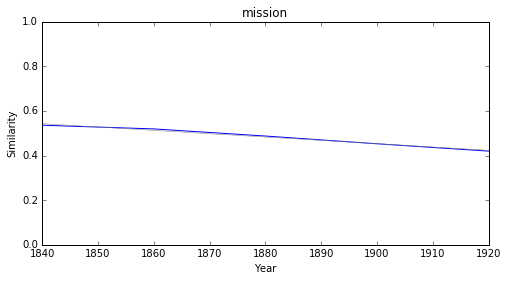

distinction


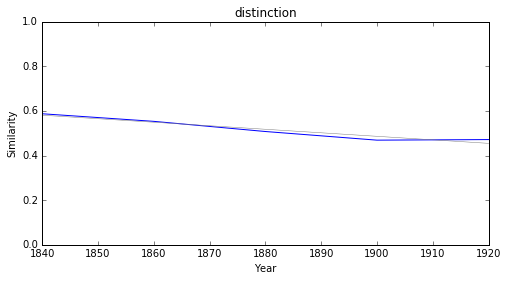

tâche


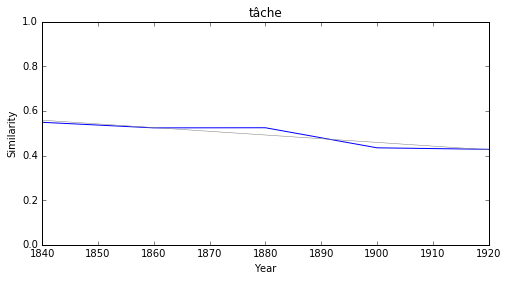

circonstance


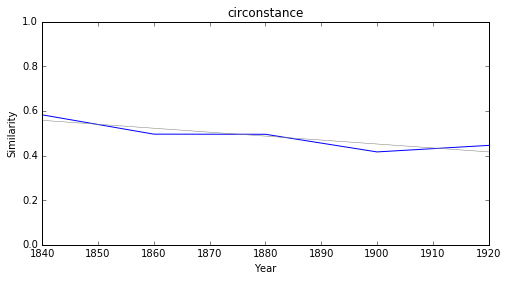

discussion


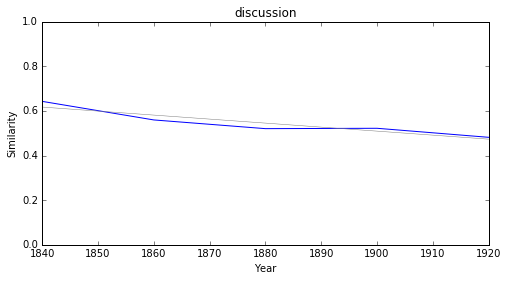

bruyère


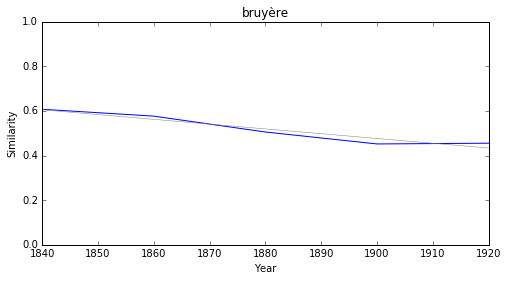

situation


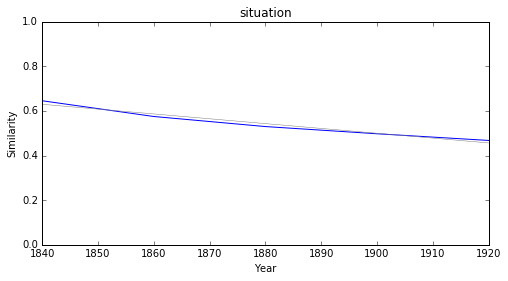

mérite


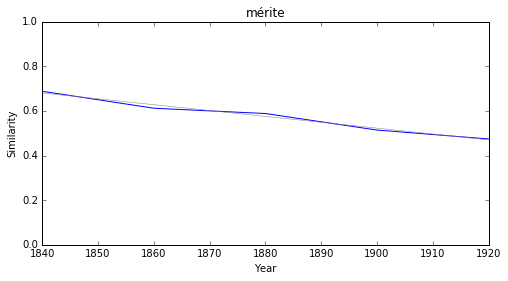

### <i><b>roman</i></b>

        token     slope         p
3   classique  0.001715  0.046661
1     lyrique  0.001445  0.044917
2  feuilleton -0.000750  0.044895
0     recueil -0.002447  0.035884



classique


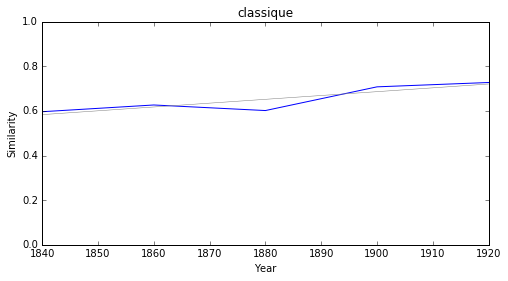

lyrique


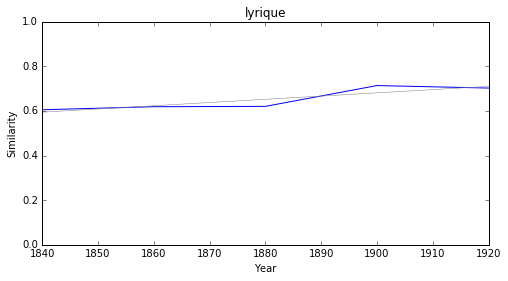

feuilleton


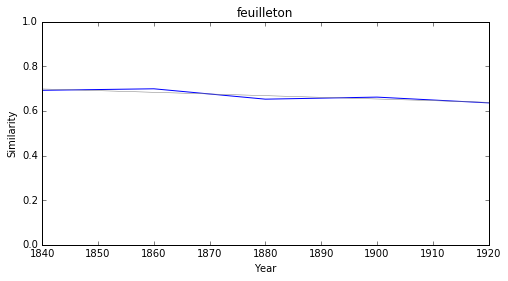

recueil


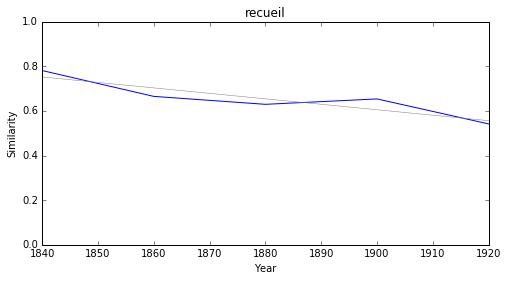

### <i><b>théâtre</i></b>

         token     slope         p
1  littérature  0.002066  0.021459
3   vaudeville  0.002036  0.019293
0   romantisme  0.001519  0.049423
2     parnasse  0.001369  0.026373
4      gymnase  0.001048  0.039934
5      procédé -0.001319  0.026754



littérature


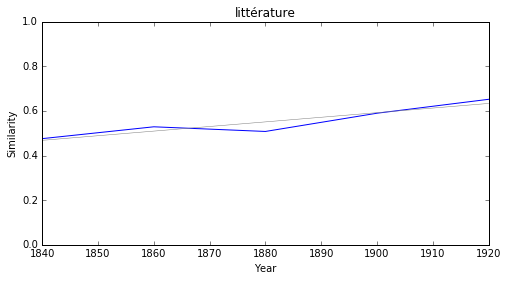

vaudeville


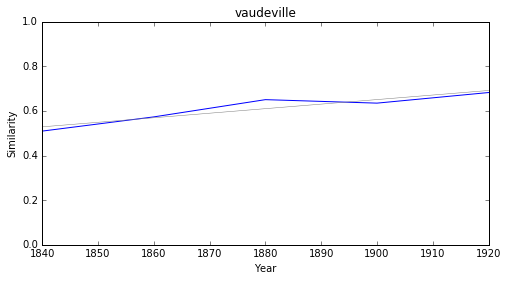

romantisme


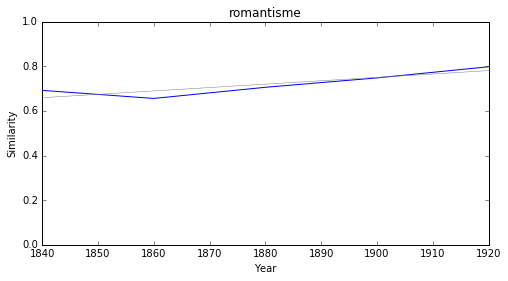

parnasse


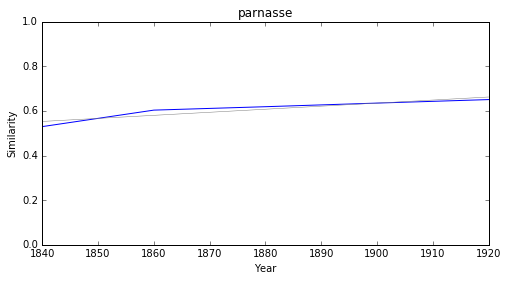

gymnase


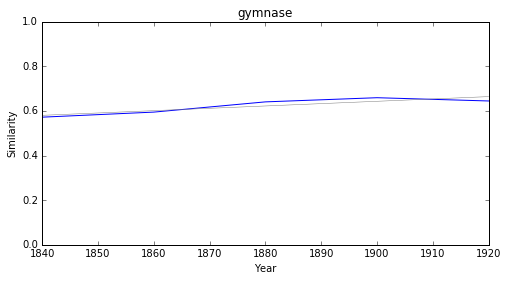

procédé


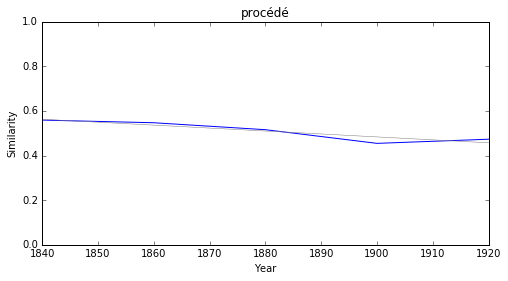

### <i><b>drame</i></b>

         token     slope         p
1   romantique  0.001852  0.046630
2      procédé -0.000873  0.008166
0  commentaire -0.002064  0.033224
3        texte -0.002116  0.020189



romantique


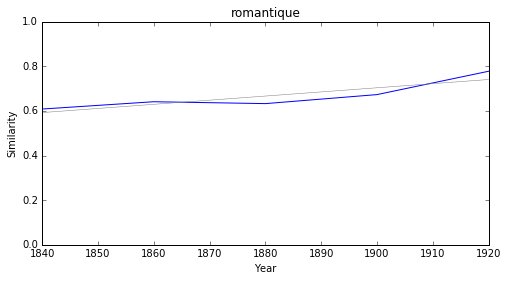

procédé


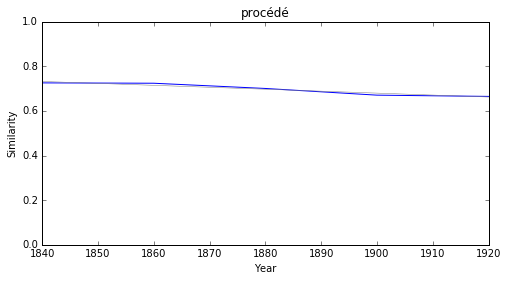

commentaire


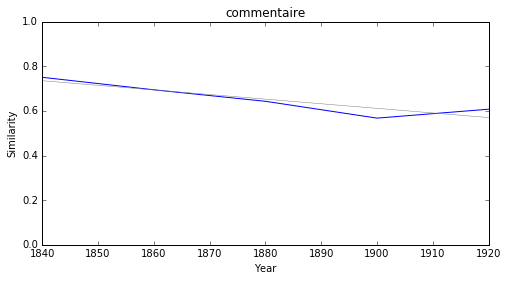

texte


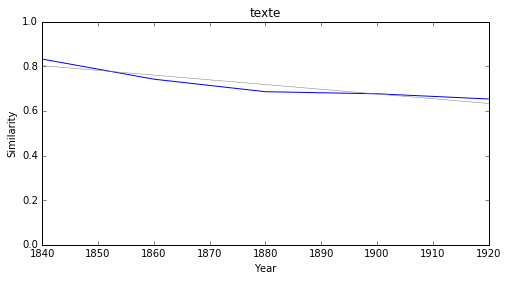

### <i><b>esprit</i></b>

          token     slope         p
9        métier  0.003814  0.006212
5        absolu  0.003455  0.005811
25         rêve  0.003446  0.047949
27    intuition  0.003354  0.018160
15       effort  0.003299  0.027200
17    essentiel  0.003008  0.036520
22  sensibilité  0.002984  0.042814
3      héritage  0.002841  0.019398
7      éternité  0.002743  0.002132
16   exaltation  0.002714  0.017570



métier


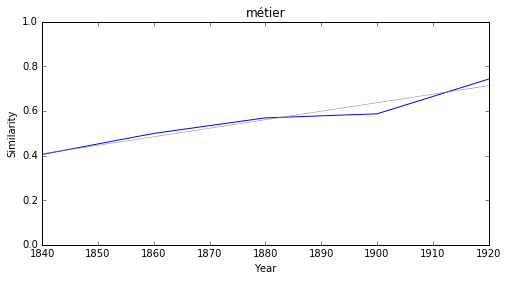

absolu


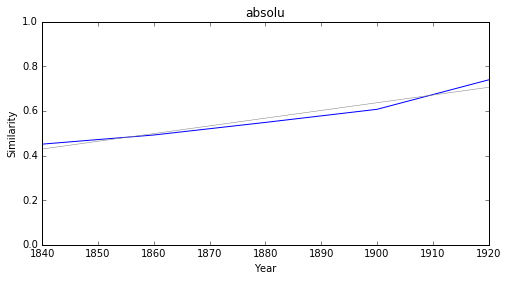

rêve


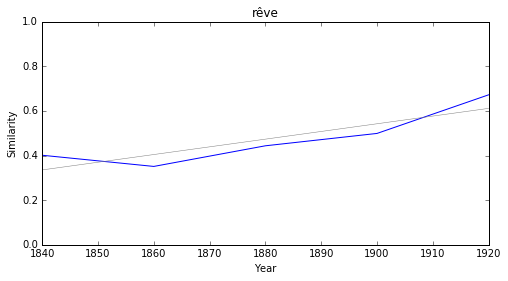

intuition


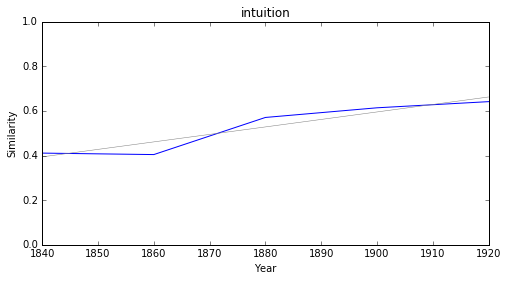

effort


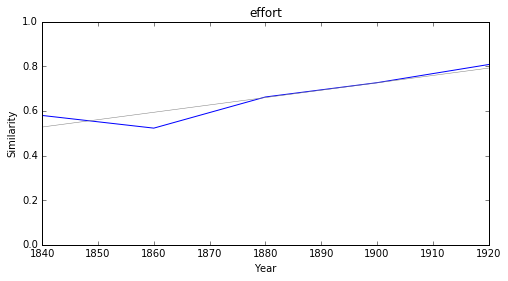

essentiel


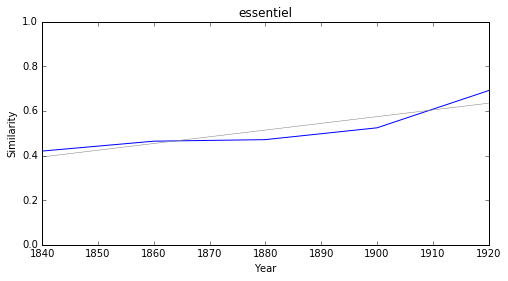

sensibilité


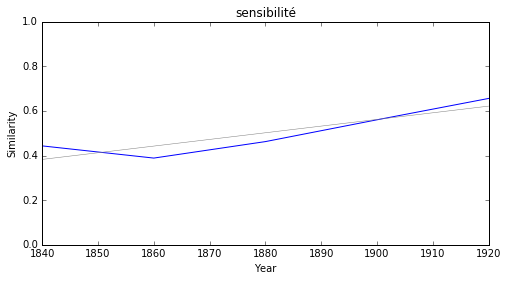

héritage


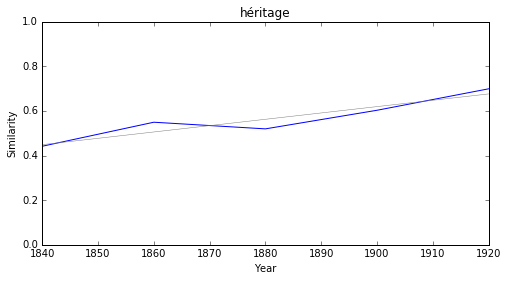

éternité


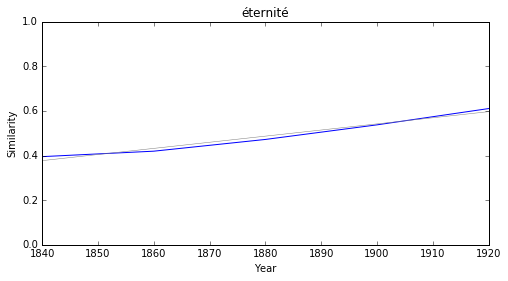

exaltation


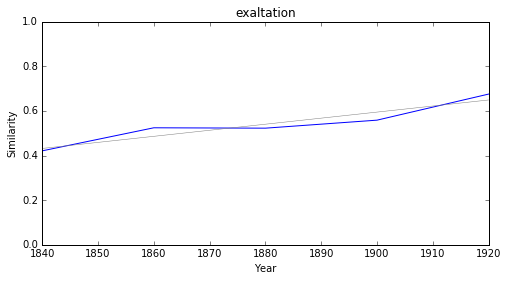

### <i><b>langue</i></b>

          token     slope         p
17       france  0.002677  0.010503
26     français  0.002281  0.045964
11     province  0.001669  0.047874
15      culture  0.001570  0.018409
10  renaissance  0.001308  0.009649
22        masse  0.001262  0.048634
18      strophe  0.000863  0.019722
24    grammaire  0.000754  0.027517
6        chimie  0.000725  0.008757
13  supériorité -0.000818  0.007530



france


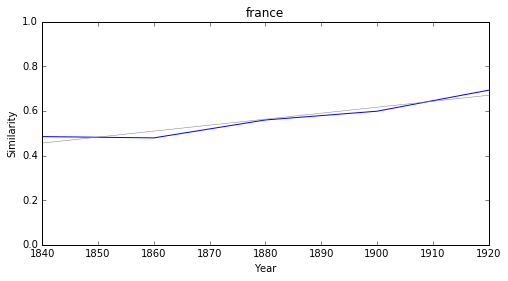

français


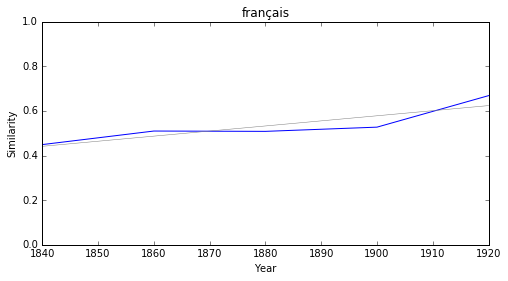

province


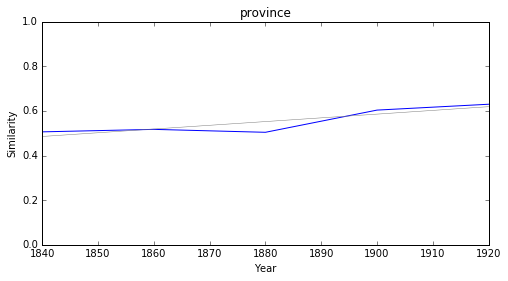

culture


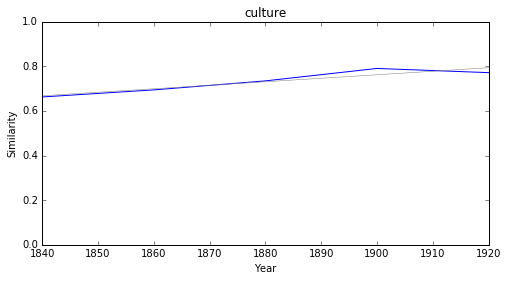

renaissance


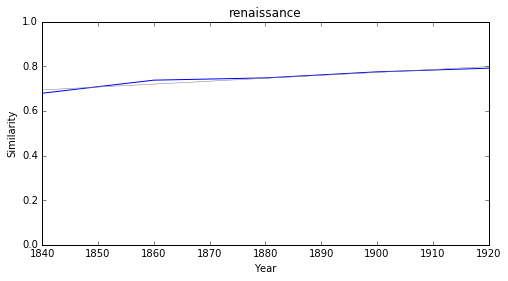

masse


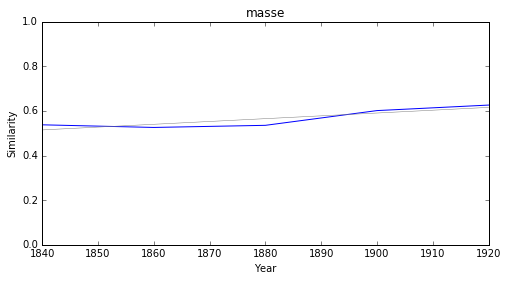

strophe


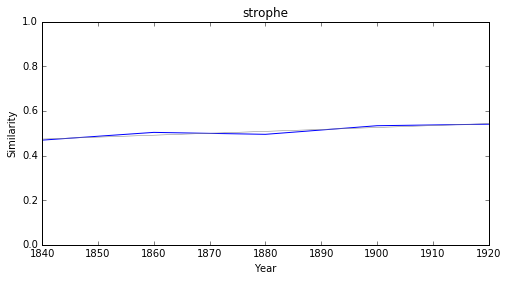

grammaire


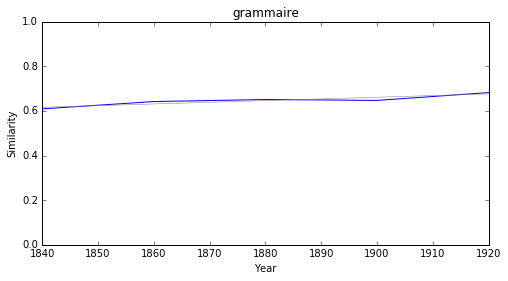

chimie


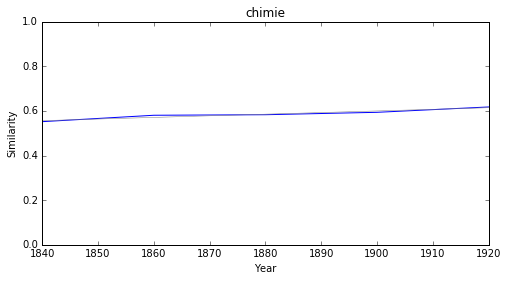

supériorité


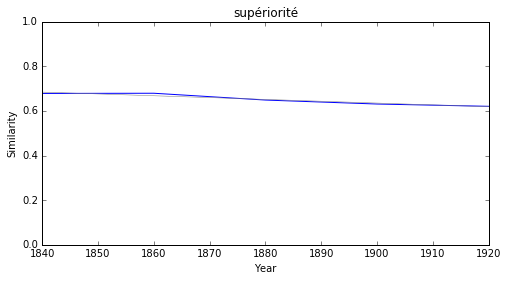

### <i><b>diplomatie</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>politique</i></b>

           token     slope         p
6     esthétique  0.002748  0.007862
11  scientifique  0.002746  0.010161
1         notion  0.002559  0.009287
3      classique  0.002027  0.020140
8     conception  0.001893  0.004453
13  métaphysique  0.001675  0.031945
14       païenne  0.001594  0.044957
9       négation  0.001473  0.003176
4      théologie  0.001440  0.045902
5        justice  0.001373  0.002176



esthétique


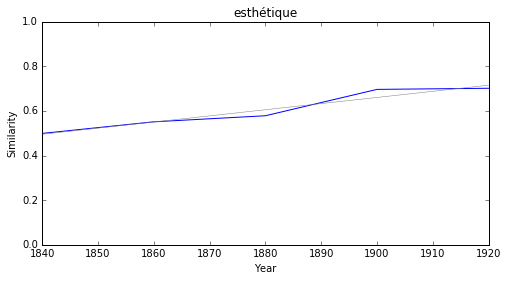

scientifique


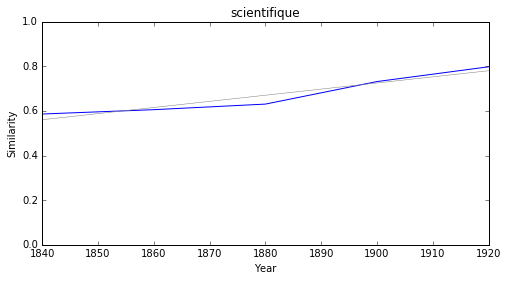

notion


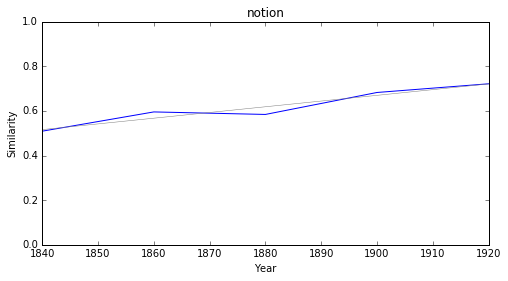

classique


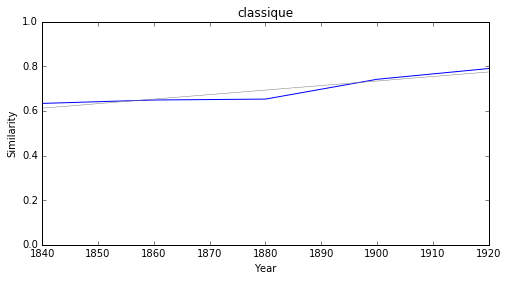

conception


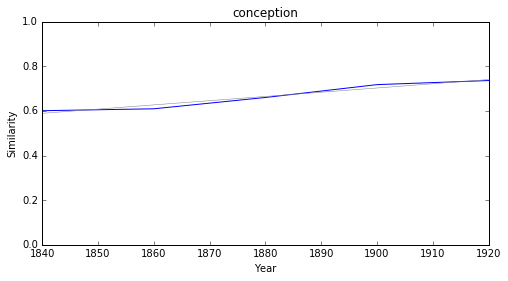

métaphysique


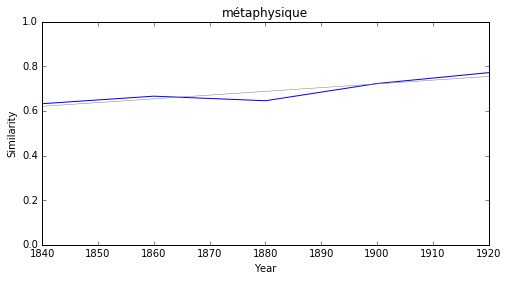

païenne


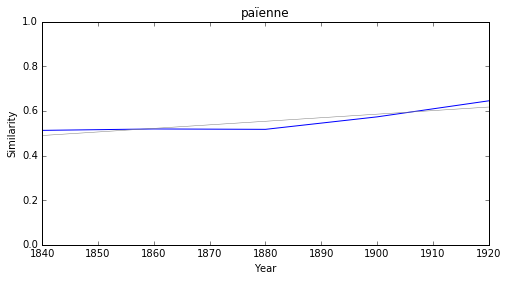

négation


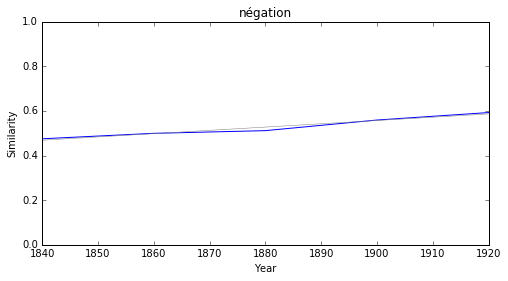

théologie


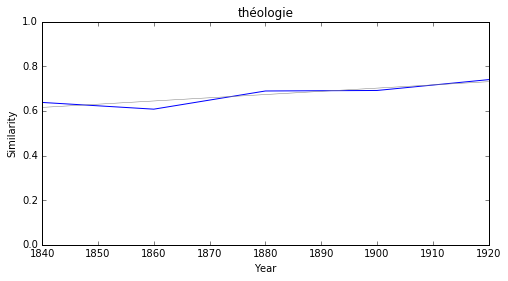

justice


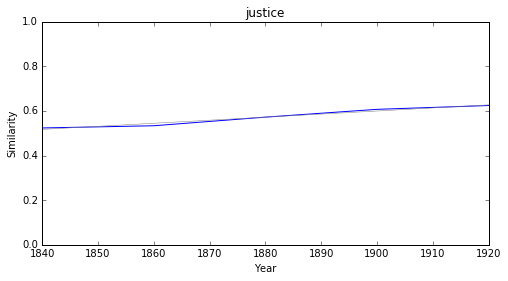

### <i><b>morale</i></b>

           token     slope         p
15    esthétique  0.002901  0.014664
8    spéculative  0.002723  0.041552
23  scientifique  0.002516  0.004308
10   personnelle  0.002328  0.033930
0      substance  0.002269  0.000949
18       formule  0.002267  0.040412
13      instinct  0.002032  0.015021
2      sensation  0.001957  0.038200
16       parenté  0.001844  0.048009
26       analyse  0.001832  0.003704



esthétique


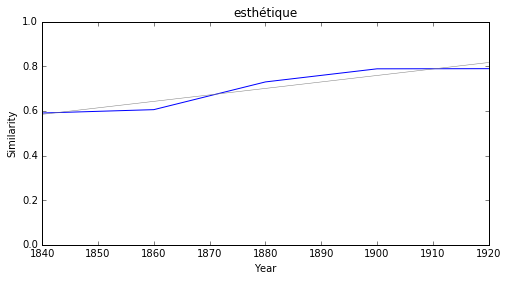

spéculative


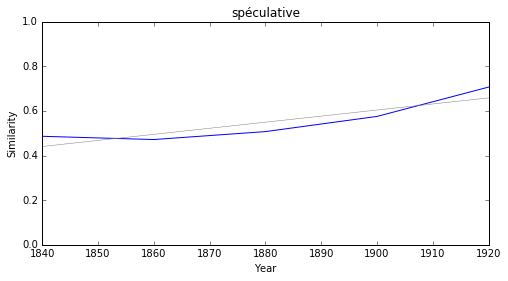

scientifique


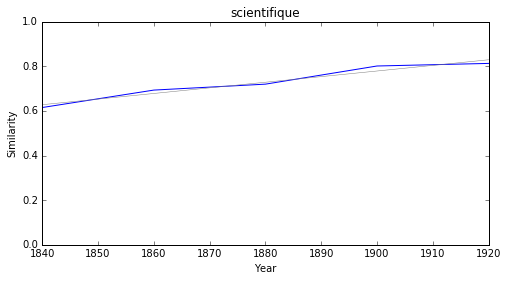

personnelle


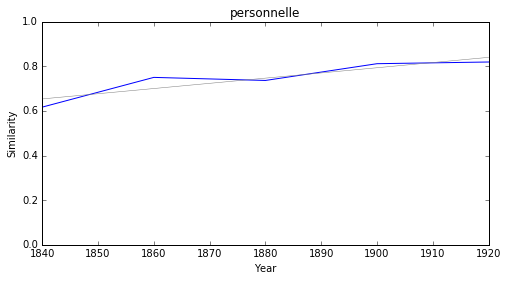

substance


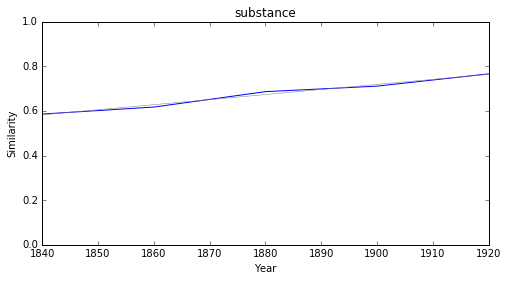

formule


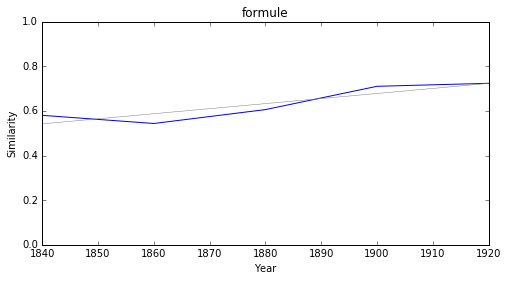

instinct


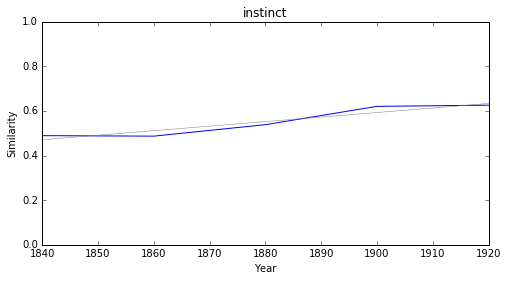

sensation


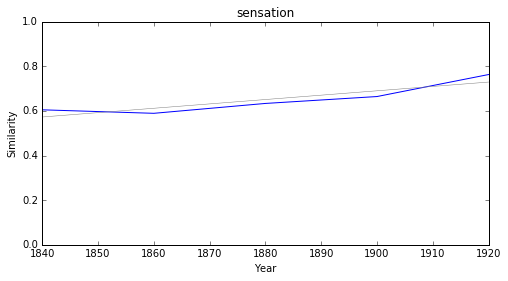

parenté


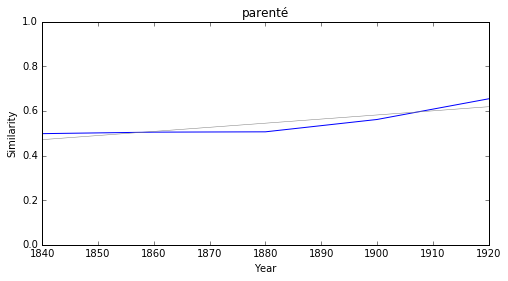

analyse


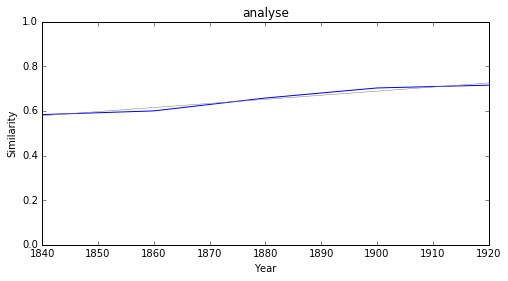

### <i><b>société</i></b>

           token     slope         p
14      histoire  0.001947  0.010065
9         classe -0.000929  0.044949
11       réforme -0.001137  0.038753
17    galanterie -0.001252  0.027140
15         grèce -0.001410  0.045312
5   constitution -0.001677  0.049174
13    corruption -0.001859  0.037352
4   souveraineté -0.002066  0.034000
1        royauté -0.002329  0.046705
12      barbarie -0.002336  0.047836



histoire


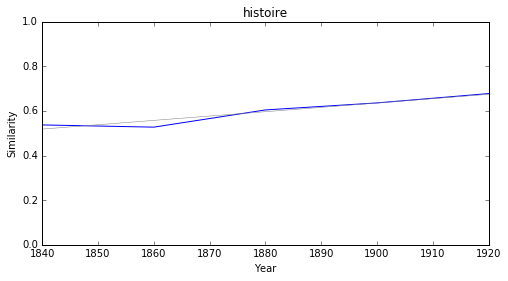

classe


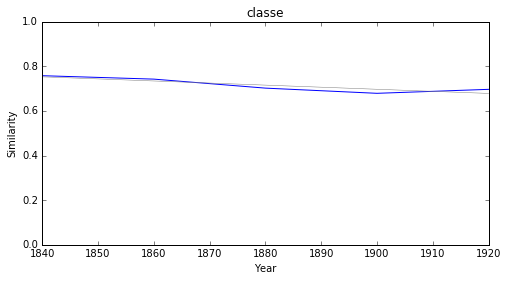

réforme


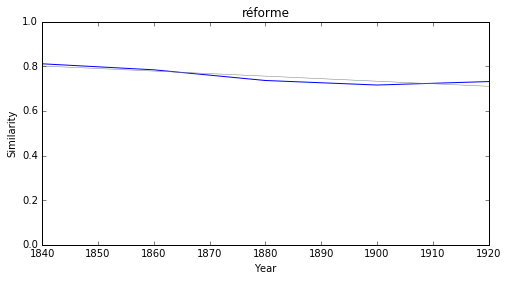

galanterie


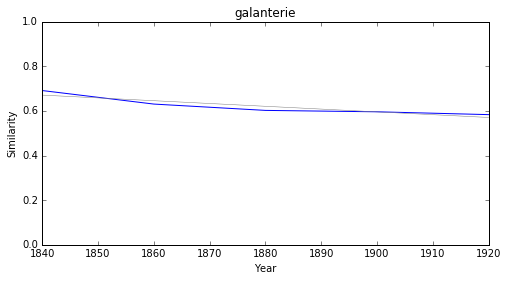

grèce


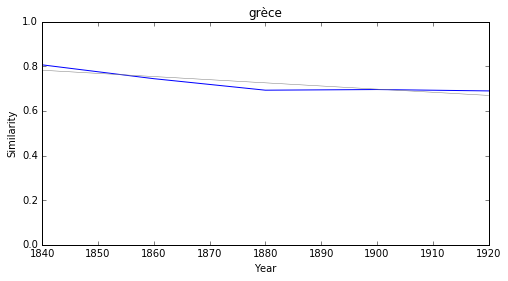

constitution


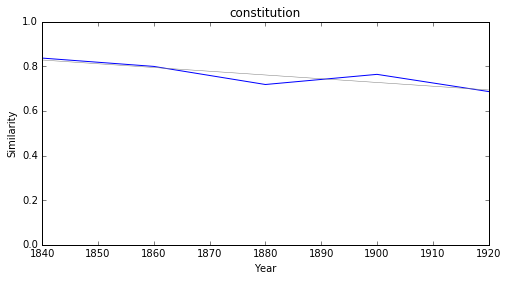

corruption


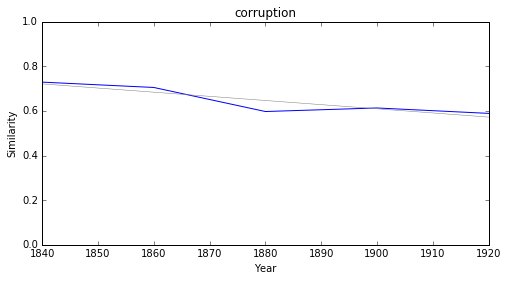

souveraineté


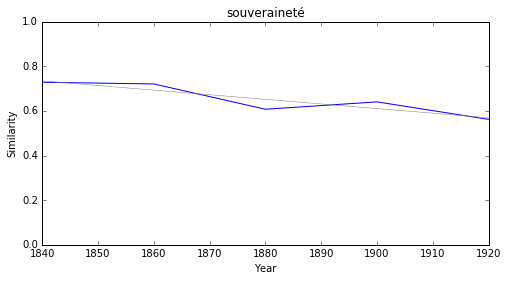

royauté


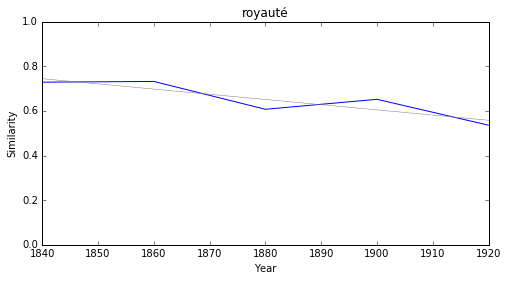

barbarie


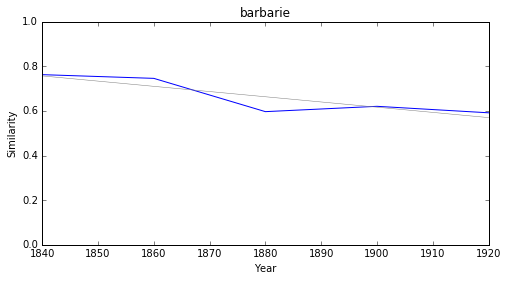

### <i><b>pouvoir</i></b>

          token     slope         p
5        obligé  0.002121  0.049974
1          agir  0.001584  0.046386
0       vouloir  0.001514  0.014140
2     sacrifice  0.001501  0.042706
3     nécessité  0.001350  0.028021
6  gouvernement -0.001131  0.035680
4       liberté -0.001433  0.008069



obligé


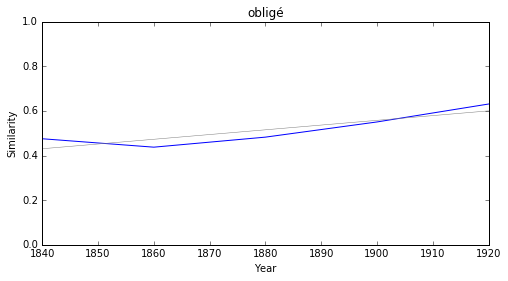

agir


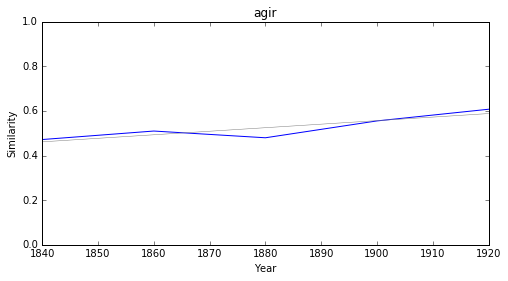

vouloir


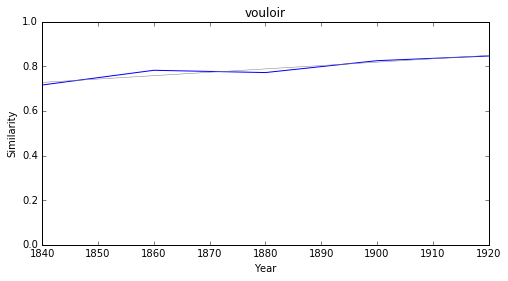

sacrifice


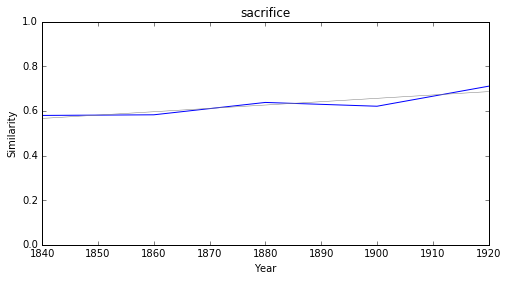

nécessité


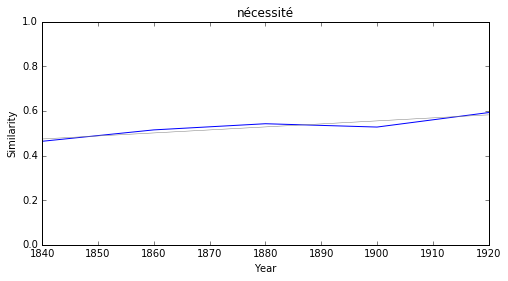

gouvernement


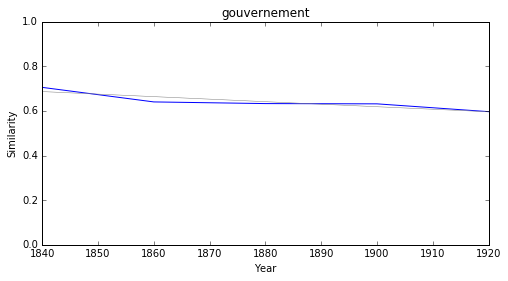

liberté


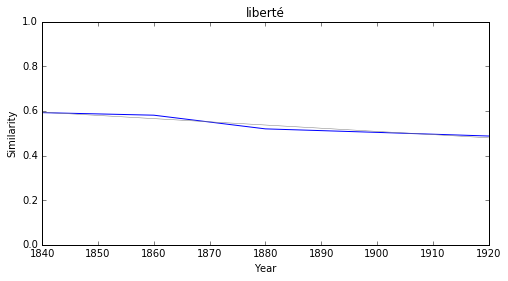

### <i><b>théologie</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>droit</i></b>

       token     slope         p
0  sacrifice  0.002293  0.034426
1      voulu -0.000752  0.008756



sacrifice


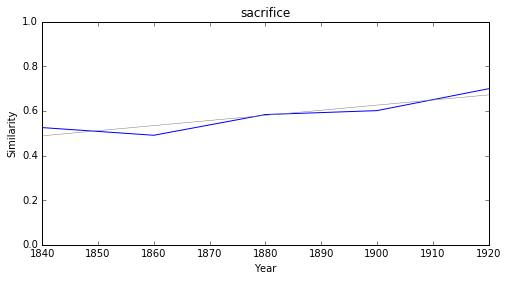

voulu


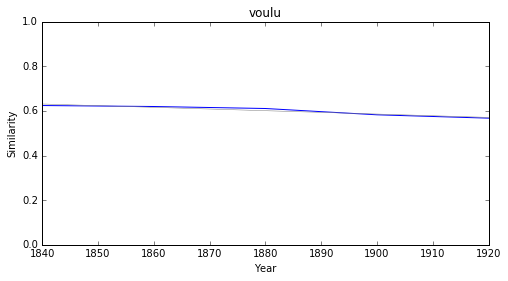

### <i><b>loi</i></b>

          token     slope         p
0        notion  0.002829  0.001297
5         lutte  0.002305  0.016250
4     hypothèse  0.001467  0.032280
2      bassesse  0.001097  0.040452
1     sensation  0.000804  0.031680
3  souveraineté -0.001379  0.012380
6       fiction -0.001857  0.005347



notion


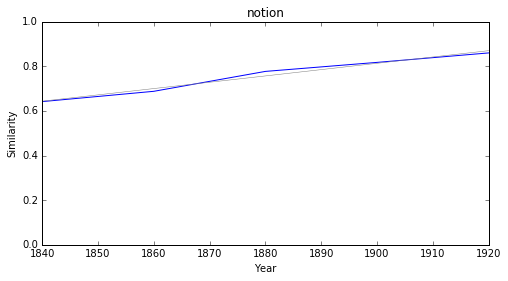

lutte


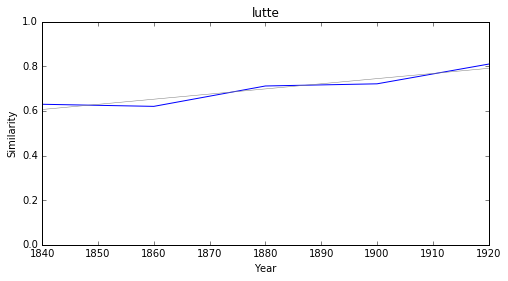

hypothèse


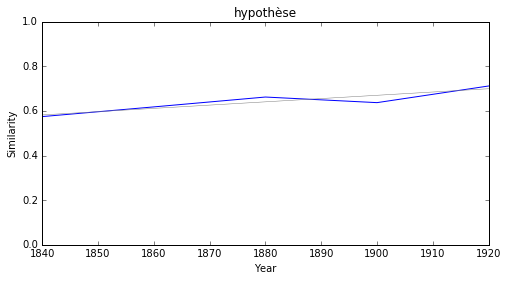

bassesse


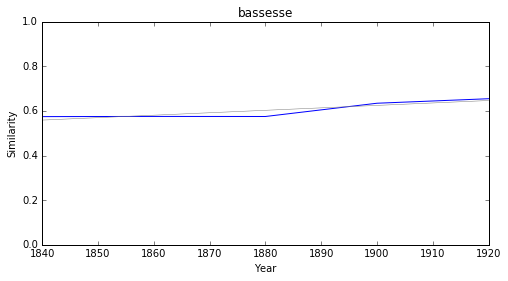

sensation


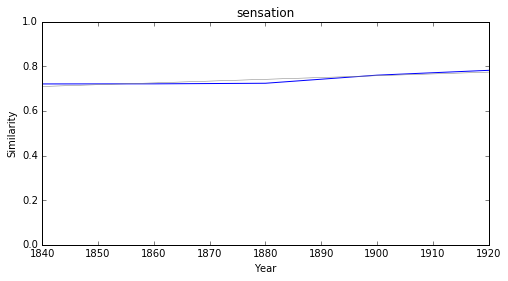

souveraineté


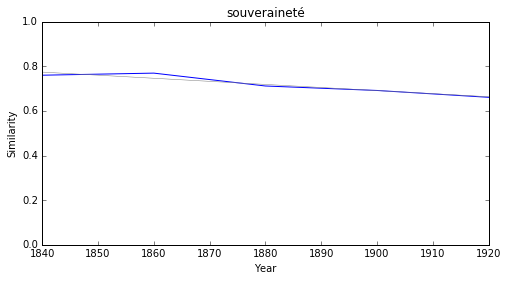

fiction


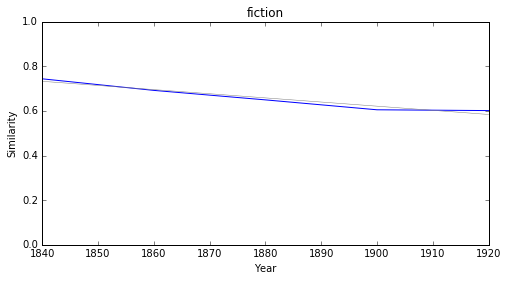

### <i><b>méthode</i></b>

         token     slope         p
0  physiologie -0.002335  0.036919



physiologie


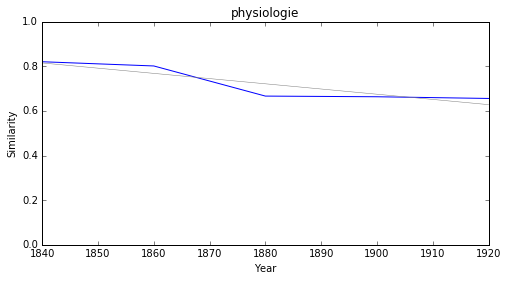

### <i><b>génie</i></b>

         token     slope         p
11       souci  0.003945  0.005811
5      lyrisme  0.003563  0.037866
2       métier  0.002971  0.002768
13        rêve  0.002805  0.049385
4       effort  0.002720  0.040024
6   personnage  0.002546  0.022006
8       labeur  0.002522  0.041553
0   romantisme  0.002115  0.012641
3     créateur  0.001899  0.027459
9    romancier  0.001811  0.046962



souci


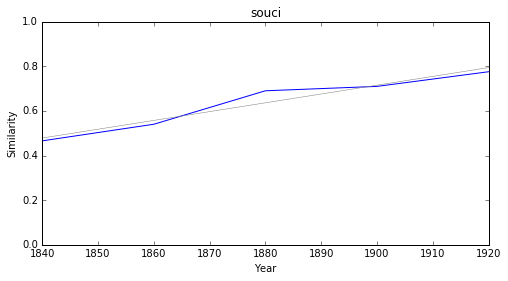

lyrisme


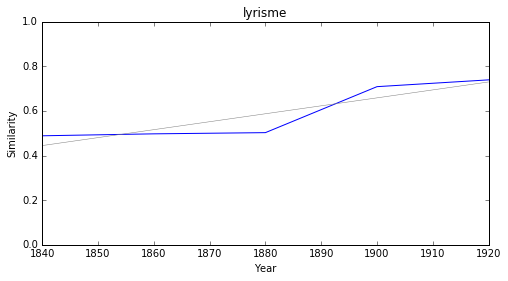

métier


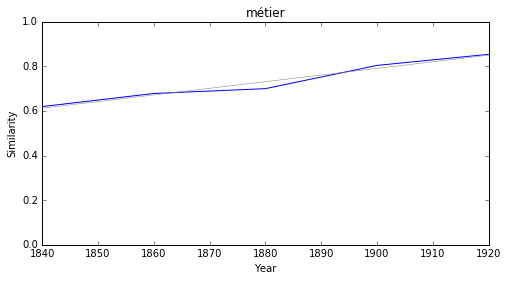

rêve


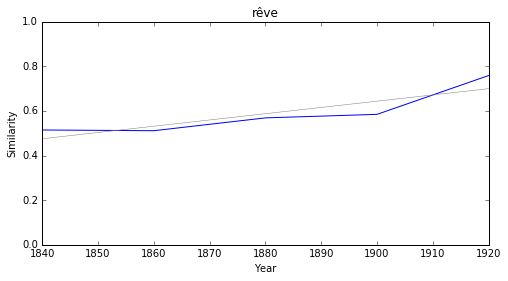

effort


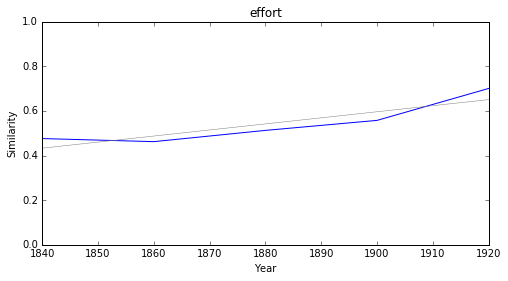

personnage


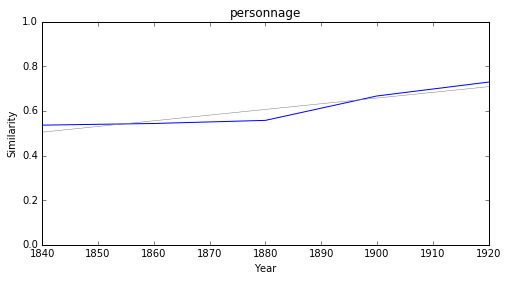

labeur


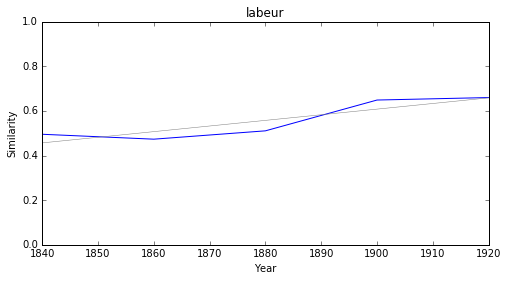

romantisme


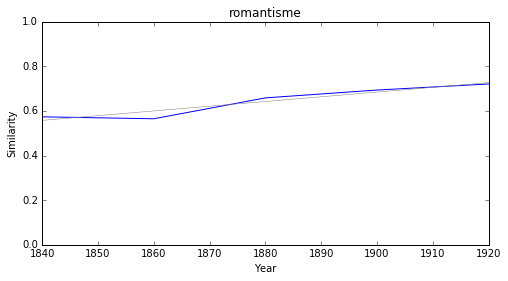

créateur


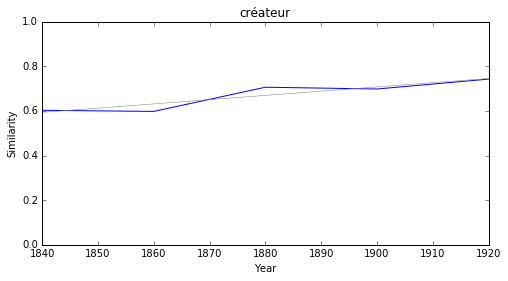

romancier


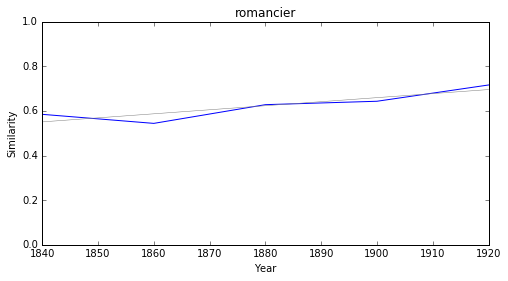

### <i><b>romantisme</i></b>

            token     slope         p
5      symbolisme  0.001870  0.027769
4         théâtre  0.001519  0.049423
6            code -0.000782  0.034922
7             cid -0.000946  0.045961
2       mécanisme -0.001197  0.021972
3      dramaturge -0.001569  0.042755
1  rétablissement -0.002172  0.009012
0        moniteur -0.002613  0.006625



symbolisme


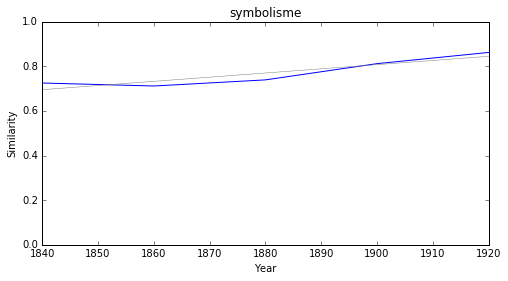

théâtre


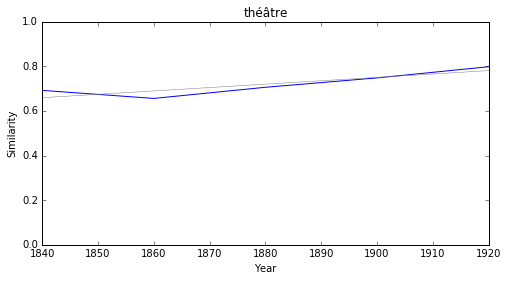

code


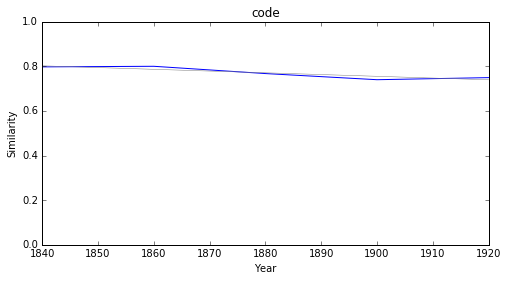

cid


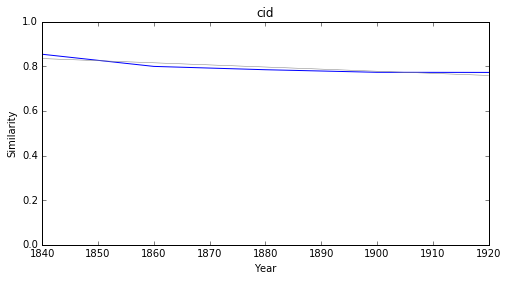

mécanisme


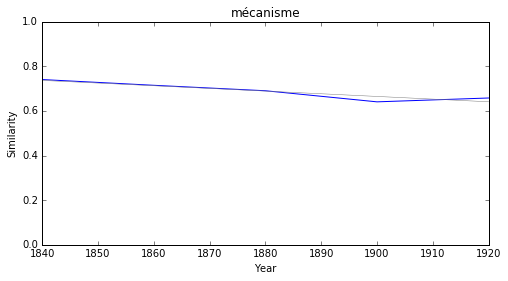

dramaturge


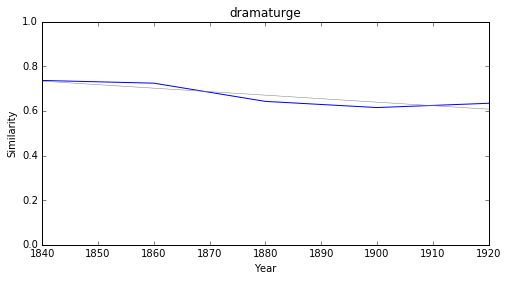

rétablissement


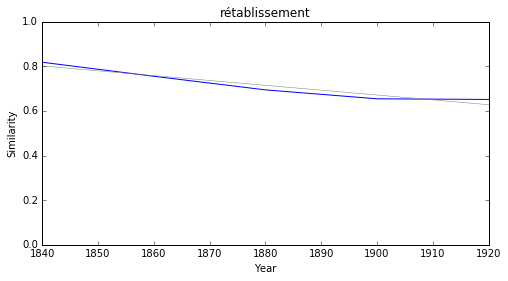

moniteur


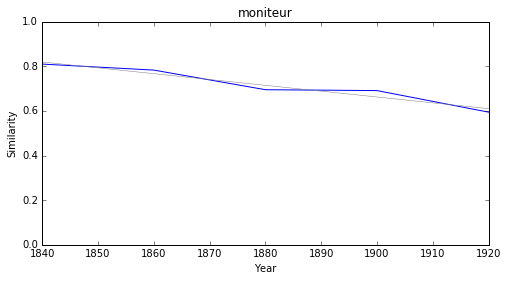

### <i><b>réalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>symbolisme</i></b>

          token     slope         p
0  matérialisme -0.000718  0.016111



matérialisme


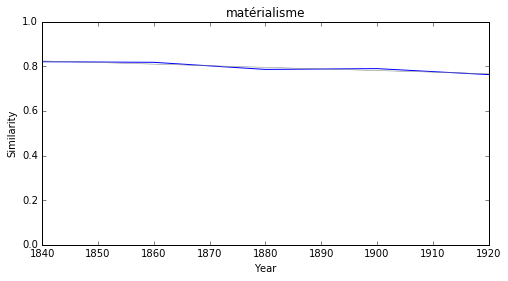

### <i><b>naturalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





In [15]:
from IPython.display import Markdown, display

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df3 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df3.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df3.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)